In [30]:
import matplotlib.pyplot as plt
import scipy.stats as stats
import geneTSmunging as gtm
import numpy as np
import network_helpers as nh
import pandas as pd
%matplotlib inline

# Visualize the GR genes

In [3]:
reload(gtm)

filename = "featurecounts.genes.TPM.selected_reps.ln.surrogate_variables_corrected.protein_coding.txt"
GR_direct_file = "raw_files/GR_direct_candidates-HGNC.txt"
GR_GO_file = "raw_files/GR_Pathway-GO-HGNC.txt"
er_file = "raw_files/edgeR-0.05genes-hg.txt"
er_bg_file = "BIOGRID-ORGANISM-Homo_sapiens-3.4.138.tab2-annot-edgeR.txt"




er_genes = nh.load_genes(er_file)
GR_direct_genes = nh.load_genes(GR_direct_file).intersection(er_genes)
print "num direct genes: ", len(GR_direct_genes)
GR_GO_genes = nh.load_genes(GR_GO_file).intersection(er_genes)
print "num GO genes: ", len(GR_GO_genes)

GR_genes = GR_GO_genes.union(GR_direct_genes)

er_bg_df = pd.read_csv(er_bg_file, sep="\t")

data = gtm.load_file_and_avg(filename)
data["gene"] = [nh.ensg2hg(gene) for gene in data["gene"]]

gene2avg = dict(zip(data["gene"], data["avg"]))

data.head()

# Genes in  raw_files/edgeR-0.05genes-hg.txt :  4345
# Genes in  raw_files/GR_direct_candidates-HGNC.txt :  111
num direct genes:  102
# Genes in  raw_files/GR_Pathway-GO-HGNC.txt :  25
num GO genes:  10
Avg + STD loaded


,gene,t00_rep1,t00_rep2plusextra,t00_rep3plusextra,t00_rep4,t05_rep1,t05_rep2,t05_rep3,t05_rep4,t1_rep1,...,t6_std,t7_,t7_std,t8_,t8_std,t10,t10std,t12,t12std,avg
0,FO538757.3,0.481816,0.659863,0.241623,0.596068,0.494511,0.613470,0.595169,0.445421,0.802590,...,0.033398,0.465733,0.195149,0.525277,0.103423,0.536561,0.321159,0.352902,0.390078,0.479521
1,FO538757.2,1.114874,0.848228,1.026851,0.811767,0.894085,1.161232,0.886624,0.467096,0.922955,...,0.141070,0.963172,0.185245,1.004151,0.225286,0.770368,0.233029,0.980118,0.355129,0.869628
2,SAMD11,3.679652,3.653919,3.418811,3.424767,3.735049,3.642257,3.578353,3.280814,3.032186,...,0.056261,3.243686,0.094690,3.318156,0.137138,3.150481,0.161825,3.149309,0.162680,3.187230
3,NOC2L,3.804179,3.743272,3.758644,3.623162,3.814503,3.667606,3.875614,3.552344,3.738926,...,0.096639,3.704833,0.090487,3.731956,0.081397,3.737911,0.066871,3.721162,0.104242,3.719067
4,KLHL17,2.422637,2.425491,2.448248,2.299855,2.110662,2.356055,2.419790,2.144655,2.379013,...,0.140669,2.202139,0.196477,2.302568,0.092895,2.080218,0.156383,2.086235,0.180433,2.144462


# Plot the GR GO genes

In [124]:
data_GO_genes = GR_GO_genes.intersection(set(data["gene"].values))
print "Num unique GR GO genes in data: ", len(data_GO_genes)

Num unique GR GO genes in data:  10


mkdir: plots/GR-GO-Expression: File exists
10
Gene to color is:  {'NR3C1': 'g', 'NEDD4': 'r', 'RBM14': 'b'}
Y min is :  4.11153515994
Y max is :  6.29287544417
Y avg is :  5.10430836113
Y std is :  0.694157876058
Figure saved to  plots/GR-GO-Expression/GR-GO-Expression-5-0-NEDD4-NR3C1-RBM14


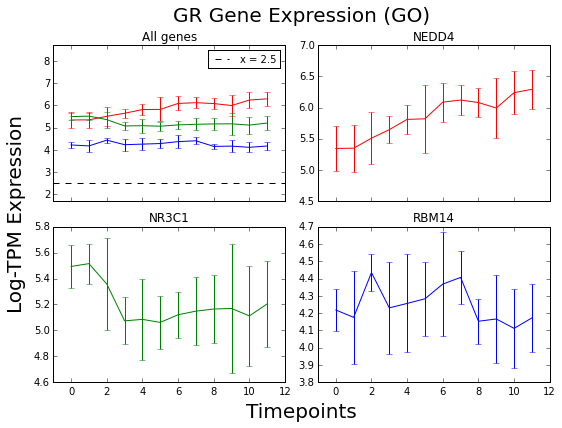

Gene to color is:  {'PER1': 'b', 'CRY1': 'r', 'IPO13': 'g'}
Y min is :  1.6308723733
Y max is :  4.49253617735
Y avg is :  3.64523363675
Y std is :  0.525313329516
Figure saved to  plots/GR-GO-Expression/GR-GO-Expression-3-0-CRY1-IPO13-PER1


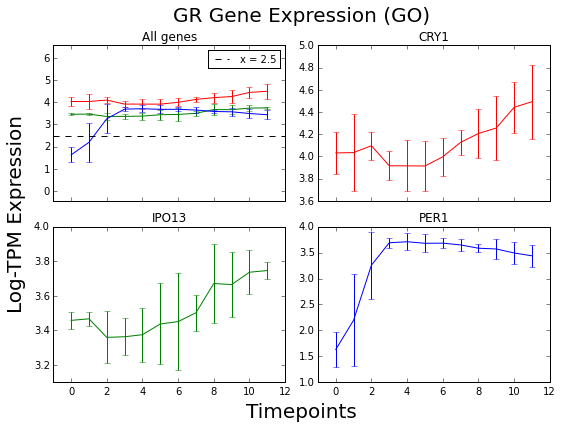

Gene to color is:  {'ARNTL': 'g', 'BDNF': 'r', 'CRY2': 'b'}
Y min is :  1.43265369881
Y max is :  2.95601922657
Y avg is :  2.39439470285
Y std is :  0.34324804335
Figure saved to  plots/GR-GO-Expression/GR-GO-Expression-2-0-ARNTL-BDNF-CRY2


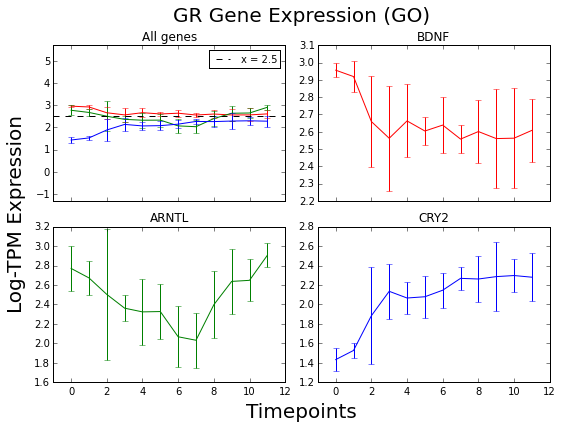

Gene to color is:  {'LMO3': 'r'}
Y min is :  -0.00471402126672
Y max is :  0.0676868447624
Y avg is :  0.0267199681501
Y std is :  0.0204630177687
Figure saved to  plots/GR-GO-Expression/GR-GO-Expression-0-0-LMO3


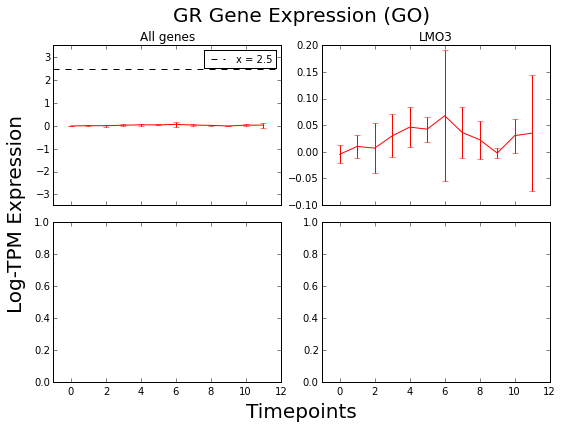

In [125]:
reload(gtm)

plot_genes_list = sorted(data_GO_genes, key = lambda gene: data[data["gene"] == gene]["avg"].values[0],
                        reverse=True)
file_prefix="plots/GR-GO-Expression/GR-GO-Expression"
title = "GR Gene Expression (GO)"

!mkdir plots/GR-GO-Expression

horizontal_line_color_labels = [(2.5, 'k', "x = 2.5")]
print len(plot_genes_list)

gtm.plot_multi_genes_grid(data, plot_genes_list, title, file_prefix=file_prefix, horizontal_line_color_labels=horizontal_line_color_labels)

# Plot the GR direct genes

In [121]:
data_direct_genes = (GR_direct_genes).intersection(set(data["gene"].values))
print "Num unique GR direct genes in data: ", len(data_direct_genes)

Num unique GR direct genes in data:  102


102
Gene to color is:  {'STOM': 'g', 'DUSP1': 'r', 'MAT2A': 'b'}
Y min is :  5.78470498123
Y max is :  7.89212648498
Y avg is :  6.9617354223
Y std is :  0.493341260333
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-6-0-DUSP1-MAT2A-STOM


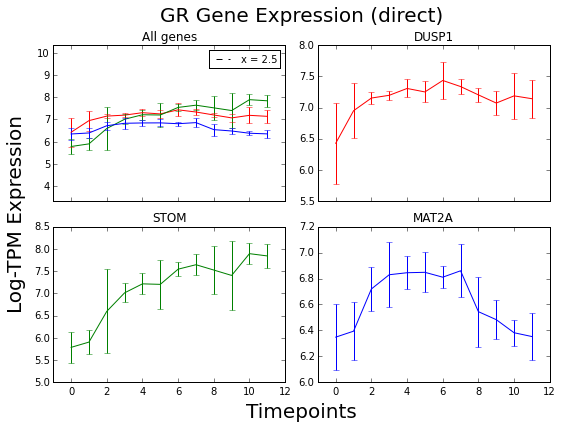

Gene to color is:  {'CEBPB': 'b', 'F2RL1': 'r', 'NFKBIA': 'g'}
Y min is :  5.20601159748
Y max is :  6.54179941285
Y avg is :  6.03656718348
Y std is :  0.280820142806
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-6-0-CEBPB-F2RL1-NFKBIA


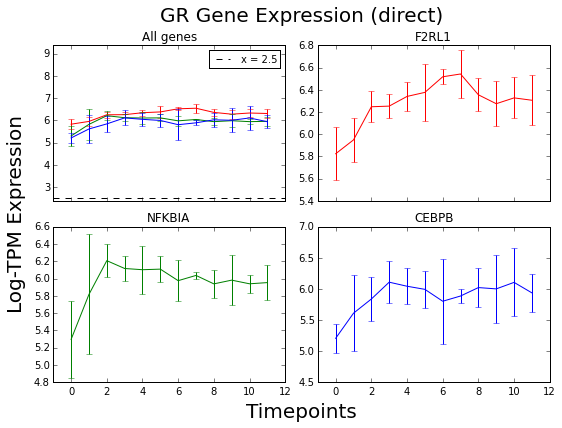

Gene to color is:  {'ERRFI1': 'g', 'TGFBR1': 'r', 'ZFAND5': 'b'}
Y min is :  4.80511194294
Y max is :  6.30637557262
Y avg is :  5.84182371189
Y std is :  0.312361735343
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-5-0-ERRFI1-TGFBR1-ZFAND5


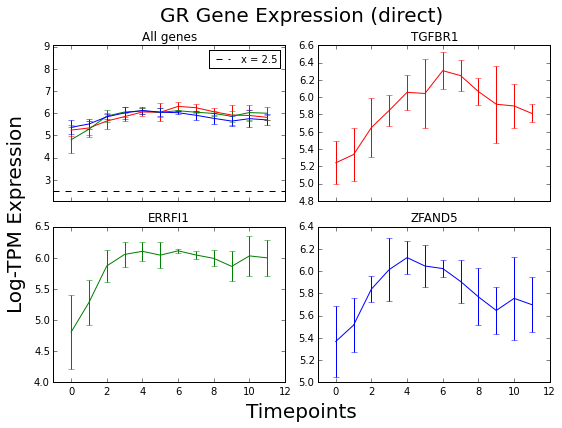

Gene to color is:  {'KLF6': 'b', 'THBD': 'r', 'FOSL2': 'g'}
Y min is :  4.35240581045
Y max is :  5.82376477584
Y avg is :  5.24877758274
Y std is :  0.311532685652
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-5-0-FOSL2-KLF6-THBD


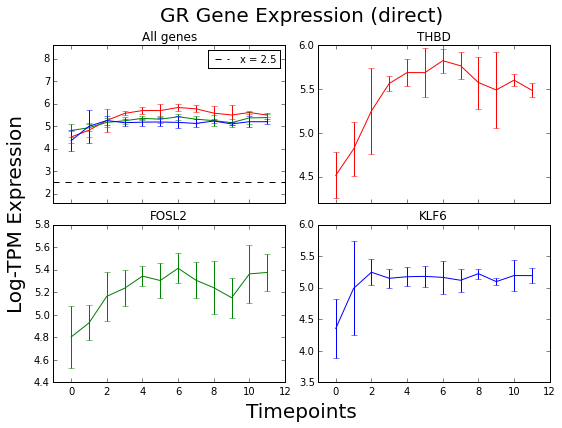

Gene to color is:  {'ELF1': 'b', 'SDPR': 'g', 'ANGPTL4': 'r'}
Y min is :  2.80702777346
Y max is :  5.88887175015
Y avg is :  4.93823372646
Y std is :  0.602586384198
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-4-0-ANGPTL4-ELF1-SDPR


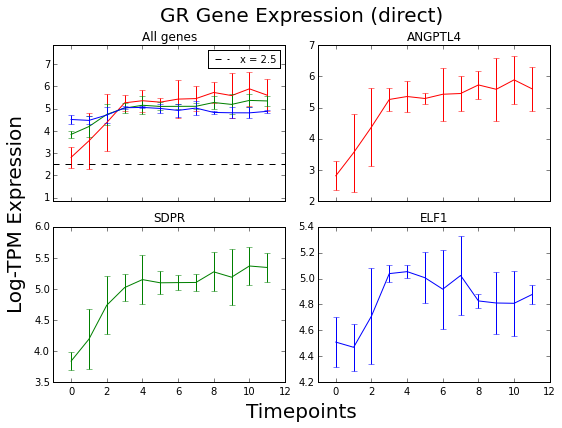

Gene to color is:  {'KCTD3': 'r', 'ZFP36': 'b', 'TIPARP': 'g'}
Y min is :  3.48044474133
Y max is :  5.36470242637
Y avg is :  4.7702633732
Y std is :  0.381996304147
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-4-0-KCTD3-TIPARP-ZFP36


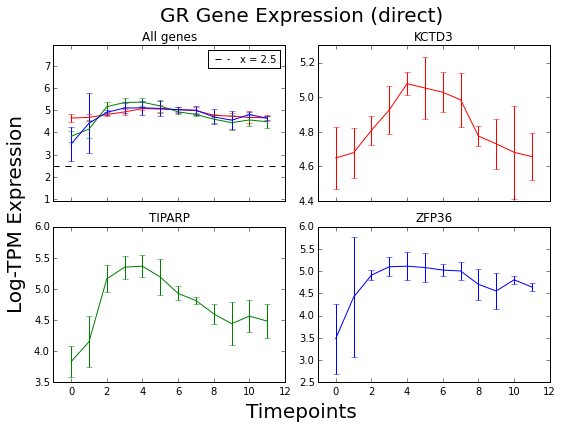

Gene to color is:  {'ETS2': 'b', 'CEBPG': 'g', 'IRS2': 'r'}
Y min is :  3.86796421962
Y max is :  5.0969981312
Y avg is :  4.63193305382
Y std is :  0.246946612225
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-4-0-CEBPG-ETS2-IRS2


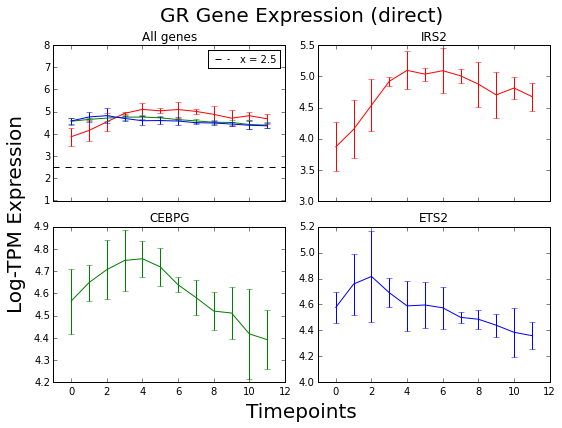

Gene to color is:  {'PDK4': 'g', 'RGS2': 'r', 'PNRC1': 'b'}
Y min is :  3.23585729725
Y max is :  4.9483334303
Y avg is :  4.43742745757
Y std is :  0.414610711064
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-4-0-PDK4-PNRC1-RGS2


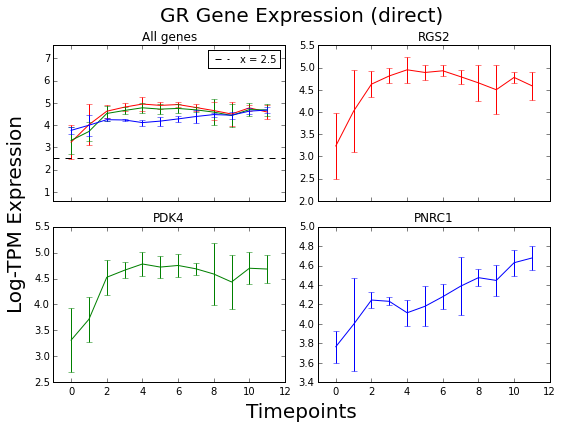

Gene to color is:  {'CREB3L2': 'b', 'INHBB': 'g', 'BIRC3': 'r'}
Y min is :  3.41862129361
Y max is :  4.75578748924
Y avg is :  4.26484546178
Y std is :  0.293430876614
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-4-0-BIRC3-CREB3L2-INHBB


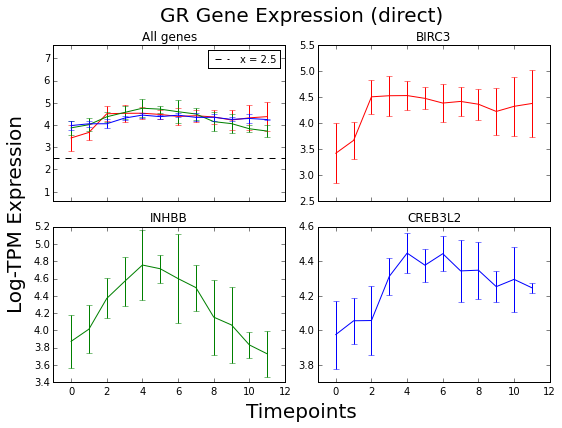

Gene to color is:  {'CPEB4': 'b', 'UGCG': 'g', 'CIDEC': 'r'}
Y min is :  1.73586639474
Y max is :  5.68830359432
Y avg is :  4.14687282097
Y std is :  0.712725907568
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-4-0-CIDEC-CPEB4-UGCG


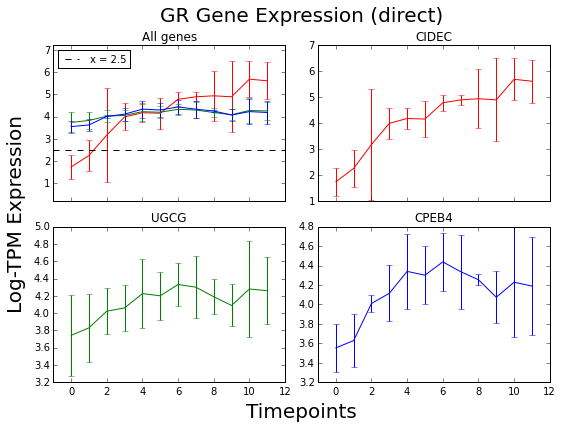

Gene to color is:  {'ELL2': 'g', 'LURAP1L': 'r', 'SLC19A2': 'b'}
Y min is :  3.10760084144
Y max is :  4.58480656142
Y avg is :  4.07786072945
Y std is :  0.335666778407
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-4-0-ELL2-LURAP1L-SLC19A2


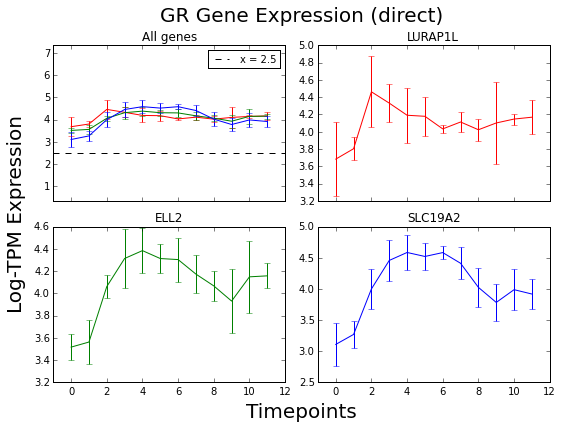

Gene to color is:  {'FKBP5': 'g', 'ZXDB': 'b', 'TFCP2L1': 'r'}
Y min is :  1.73730729708
Y max is :  5.03421505851
Y avg is :  4.02494784495
Y std is :  0.886944935104
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-4-0-FKBP5-TFCP2L1-ZXDB


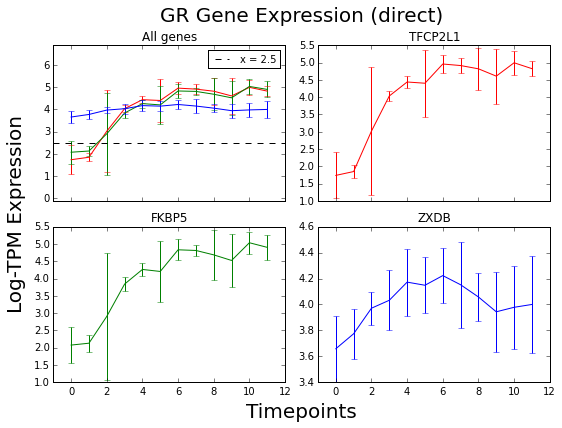

Gene to color is:  {'SNN': 'b', 'CHST3': 'g', 'RNF103': 'r'}
Y min is :  3.20060344352
Y max is :  4.13419414073
Y avg is :  3.88518636892
Y std is :  0.199391266169
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-3-0-CHST3-RNF103-SNN


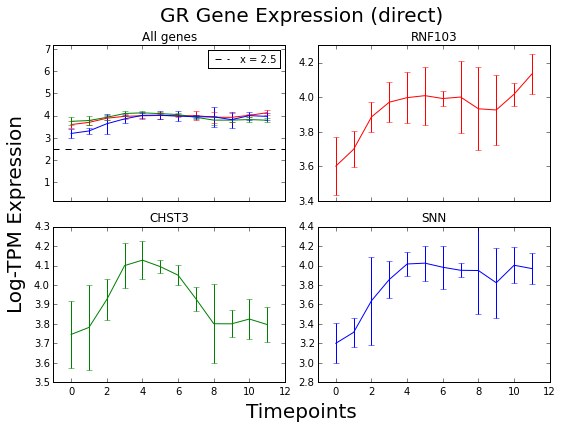

Gene to color is:  {'CITED2': 'g', 'CEBPD': 'b', 'SPC24': 'r'}
Y min is :  2.97189272824
Y max is :  4.03906162591
Y avg is :  3.77879761655
Y std is :  0.212358608881
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-3-0-CEBPD-CITED2-SPC24


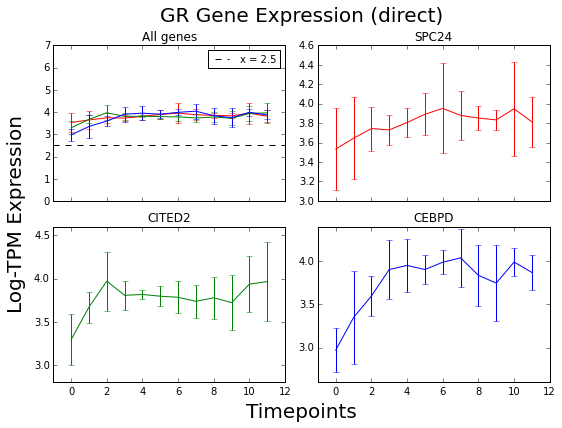

Gene to color is:  {'SLC22A5': 'r', 'RHOBTB2': 'b', 'PARD6B': 'g'}
Y min is :  2.84805741651
Y max is :  4.07499317561
Y avg is :  3.6820281198
Y std is :  0.315919551445
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-3-0-PARD6B-RHOBTB2-SLC22A5


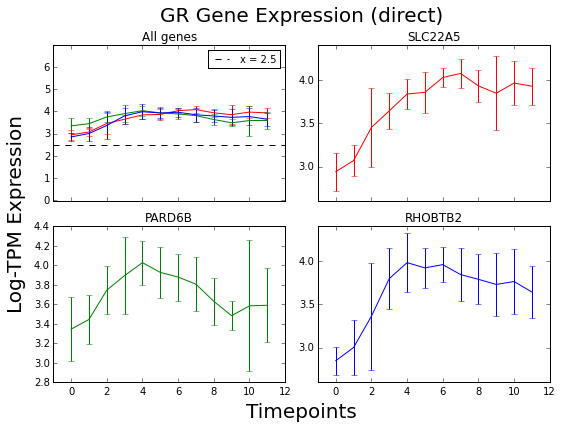

Gene to color is:  {'ZC3H12A': 'b', 'C7orf49': 'r', 'CSRNP1': 'g'}
Y min is :  2.78038889669
Y max is :  3.86226076292
Y avg is :  3.58295860018
Y std is :  0.202973672809
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-3-0-C7orf49-CSRNP1-ZC3H12A


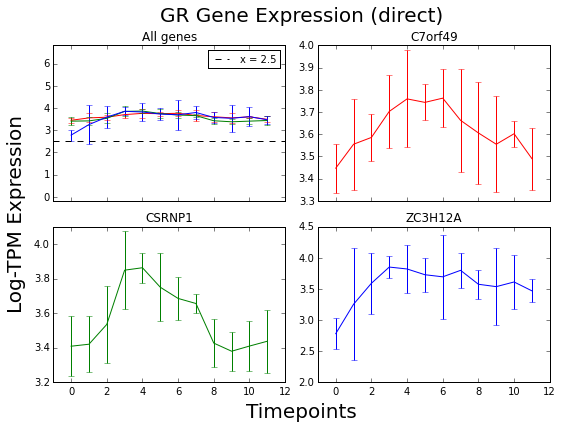

Gene to color is:  {'FGD4': 'g', 'WEE1': 'r', 'ITPRIP': 'b'}
Y min is :  1.9366836541
Y max is :  4.21651289231
Y avg is :  3.45508908804
Y std is :  0.46572631587
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-3-0-FGD4-ITPRIP-WEE1


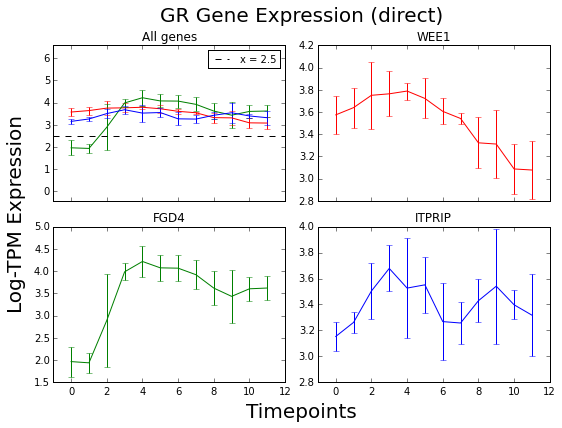

Gene to color is:  {'FOXO3': 'g', 'DCUN1D3': 'r', 'PRR15L': 'b'}
Y min is :  1.98685234942
Y max is :  3.83477439417
Y avg is :  3.37280675401
Y std is :  0.477500423468
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-3-0-DCUN1D3-FOXO3-PRR15L


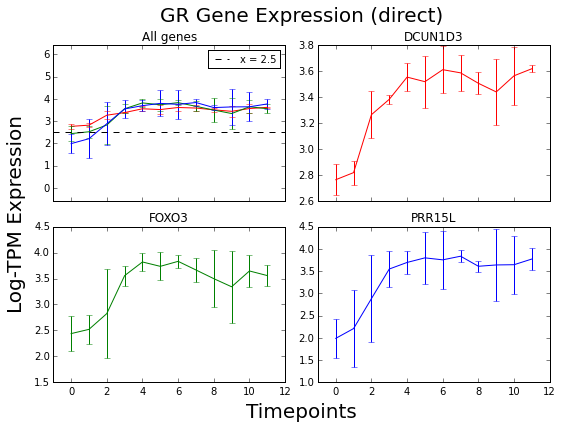

Gene to color is:  {'PER1': 'r', 'FRAT2': 'b', 'ARRDC2': 'g'}
Y min is :  1.6308723733
Y max is :  3.70870867904
Y avg is :  3.24397022361
Y std is :  0.439972977535
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-3-0-ARRDC2-FRAT2-PER1


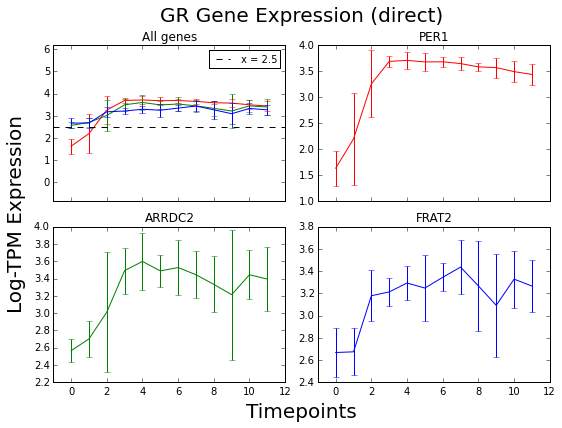

Gene to color is:  {'PER2': 'g', 'CA9': 'b', 'KLF9': 'r'}
Y min is :  1.68669923228
Y max is :  3.71801640611
Y avg is :  3.07104373221
Y std is :  0.432316233092
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-3-0-CA9-KLF9-PER2


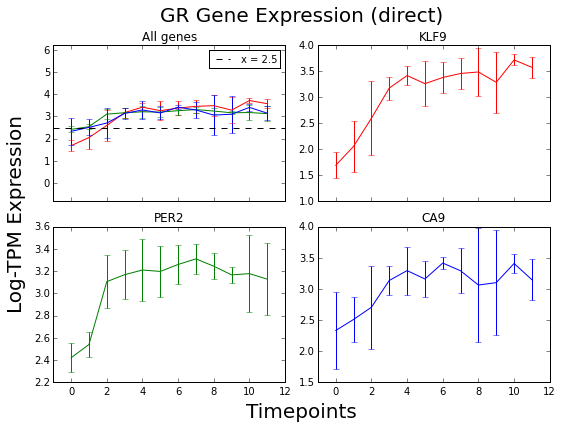

Gene to color is:  {'FLVCR2': 'r', 'IGFBP1': 'g', 'ARHGEF26': 'b'}
Y min is :  1.97502629911
Y max is :  3.82438864933
Y avg is :  2.99773698417
Y std is :  0.492683657708
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-2-0-ARHGEF26-FLVCR2-IGFBP1


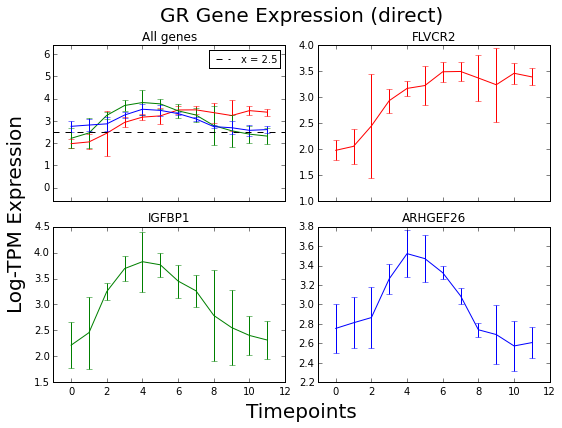

Gene to color is:  {'CAMKK1': 'b', 'F3': 'g', 'ZNF189': 'r'}
Y min is :  2.44466683452
Y max is :  3.47312635277
Y avg is :  2.90386431643
Y std is :  0.277622280811
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-2-0-CAMKK1-F3-ZNF189


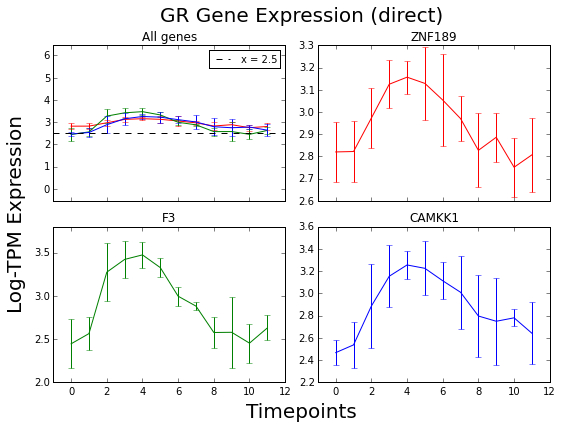

Gene to color is:  {'SNRK': 'g', 'EDN2': 'b', 'RIPK4': 'r'}
Y min is :  1.61018993018
Y max is :  3.57670702605
Y avg is :  2.75497979481
Y std is :  0.371558828936
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-2-0-EDN2-RIPK4-SNRK


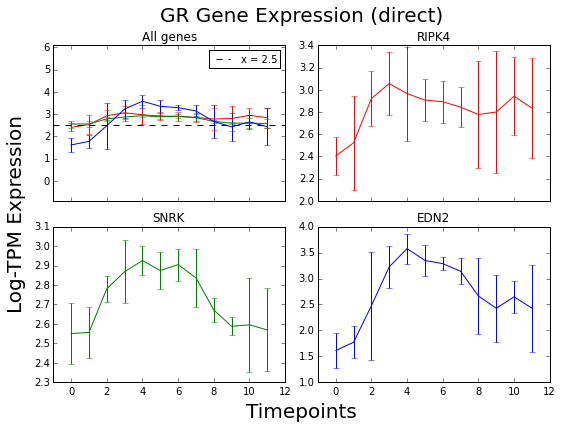

Gene to color is:  {'EDN3': 'b', 'JRK': 'g', 'IL6R': 'r'}
Y min is :  0.650446156032
Y max is :  3.42349554213
Y avg is :  2.60260641036
Y std is :  0.627270780411
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-2-0-EDN3-IL6R-JRK


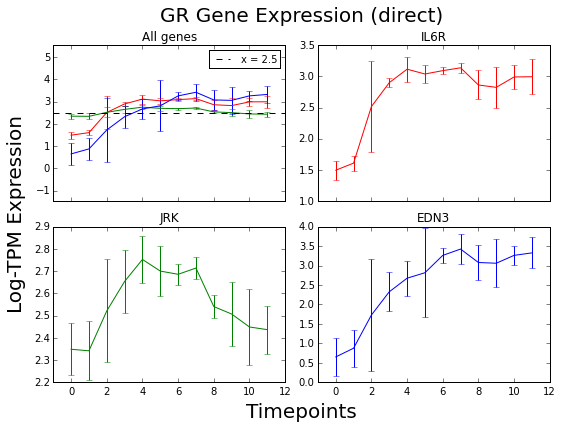

Gene to color is:  {'RASSF9': 'g', 'BCL6': 'b', 'PRDM1': 'r'}
Y min is :  1.93269253595
Y max is :  2.70703921489
Y avg is :  2.47165611031
Y std is :  0.199883627361
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-2-0-BCL6-PRDM1-RASSF9


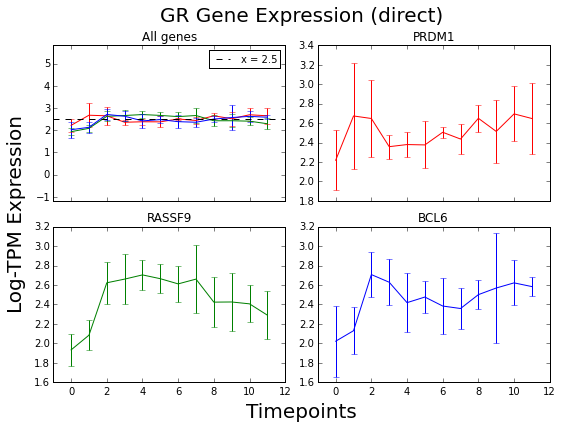

Gene to color is:  {'FNIP2': 'g', 'ENTPD2': 'b', 'TNFAIP3': 'r'}
Y min is :  0.921344030609
Y max is :  2.74363104346
Y avg is :  2.23434548631
Y std is :  0.402564374801
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-2-0-ENTPD2-FNIP2-TNFAIP3


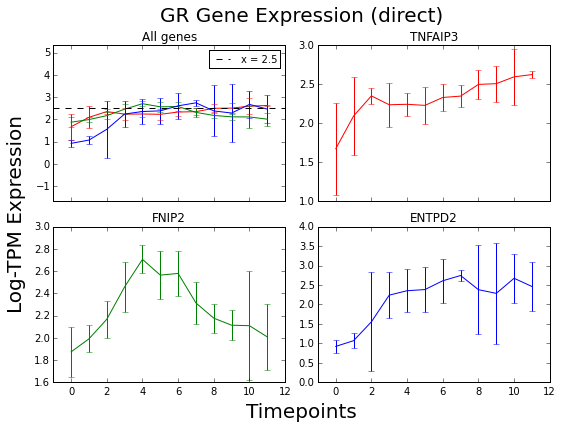

Gene to color is:  {'CYP4F12': 'b', 'SPRY1': 'g', 'CRY2': 'r'}
Y min is :  0.903071693425
Y max is :  2.35697686597
Y avg is :  1.92387766921
Y std is :  0.348626139101
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-1-0-CRY2-CYP4F12-SPRY1


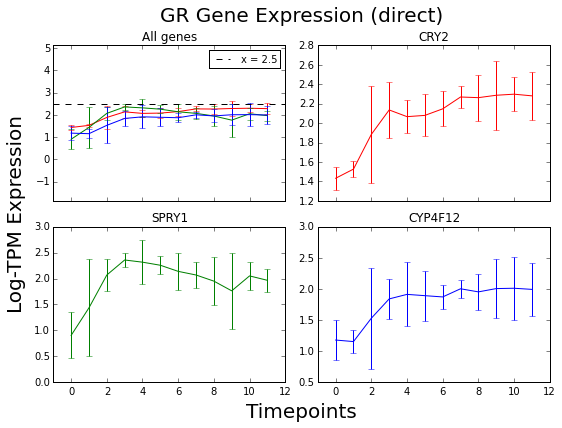

Gene to color is:  {'POU5F1': 'r', 'PLEKHH2': 'g', 'RP11-434D12.1': 'b'}
Y min is :  0.812716845226
Y max is :  2.05001429331
Y avg is :  1.60098453253
Y std is :  0.317878942517
Figure saved to  plots/GR-direct-Expression/GR-direct-Expression-1-0-PLEKHH2-POU5F1-RP11-434D12.1


ValueError: Format "1" is not supported.
Supported formats: eps, jpeg, jpg, pdf, pgf, png, ps, raw, rgba, svg, svgz, tif, tiff.

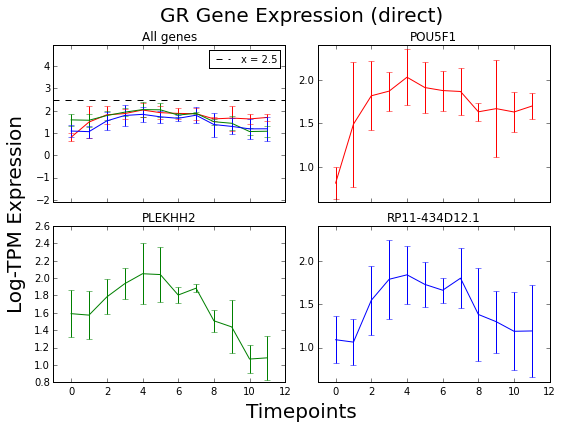

In [122]:
reload(gtm)

plot_genes_list = sorted(data_direct_genes, key = lambda gene: data[data["gene"] == gene]["avg"].values[0],
                        reverse=True)
file_prefix="plots/GR-direct-Expression/GR-direct-Expression"
title = "GR Gene Expression (direct)"

!mkdir plots/GR-direct-Expression

horizontal_line_color_labels = [(2.5, 'k', "x = 2.5")]
print len(plot_genes_list)

gtm.plot_multi_genes_grid(data, plot_genes_list, title, file_prefix=file_prefix, horizontal_line_color_labels=horizontal_line_color_labels)

# Get number up, downreg genes

In [134]:
filekeys = ["t05"] + ["t" + str(i) for i in range(1, 9)] + ["t10" , "t12"]
downreg_files = ["raw_files/sig_genes_downreg_fdr-0.05-" + filekey + ".txt" for filekey in filekeys]
print "# Downreg genes at fdr 0.05 at each timepoint"

for filekey in filekeys:
    print filekey
for downreg_file in downreg_files:
    genes = nh.load_genes(downreg_file, verbose=False )
    print len(genes)

# Downreg genes at fdr 0.05 at each timepoint
t05
t1
t2
t3
t4
t5
t6
t7
t8
t10
t12
7
67
176
292
232
476
375
441
347
982
1157


In [135]:
filekeys = ["t05"] + ["t" + str(i) for i in range(1, 9)] + ["t10" , "t12"]
upreg_files = ["raw_files/sig_genes_upreg_fdr-0.05-" + filekey + ".txt" for filekey in filekeys]
print "# upreg genes at fdr 0.05 at each timepoint"

for filekey in filekeys:
    print filekey
for upreg_file in upreg_files:
    genes = nh.load_genes(upreg_file, verbose=False )
    print len(genes)

# upreg genes at fdr 0.05 at each timepoint
t05
t1
t2
t3
t4
t5
t6
t7
t8
t10
t12
14
131
314
495
497
796
662
794
681
1164
1388


# PLOT 2ND-ORDER DOWNREG genes

In [139]:
filekeys = ["t" + str(i) for i in range(5, 6)]
downreg_files = ["raw_files/sig_genes_downreg_fdr-0.05-" + filekey + ".txt" for filekey in filekeys]

downreg_genes = set()
for downreg_file in downreg_files:
    downreg_genes = set.union(nh.load_genes(downreg_file))

downreg_genes = downreg_genes.intersection(er_genes)
data_downreg_mid_genes = downreg_genes.intersection(set(data["gene"].values))

# Genes in  raw_files/sig_genes_downreg_fdr-0.05-t5.txt :  476


334
Gene to color is:  {'AKR1B1': 'r', 'HSPA8': 'g', 'CAPN2': 'b'}
Y min is :  5.95536514279
Y max is :  8.12364256307
Y avg is :  7.18436924988
Y std is :  0.790488451
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-7-0-AKR1B1-CAPN2-HSPA8


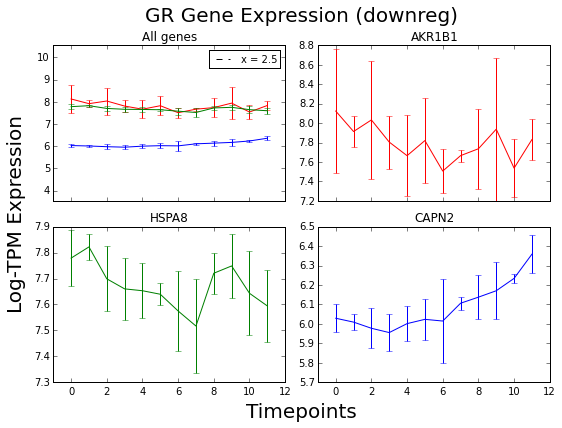

Gene to color is:  {'PFKFB3': 'g', 'GLS': 'b', 'DYNLL1': 'r'}
Y min is :  5.40867602072
Y max is :  6.18749099684
Y avg is :  5.7848129029
Y std is :  0.177505432119
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-5-0-DYNLL1-GLS-PFKFB3


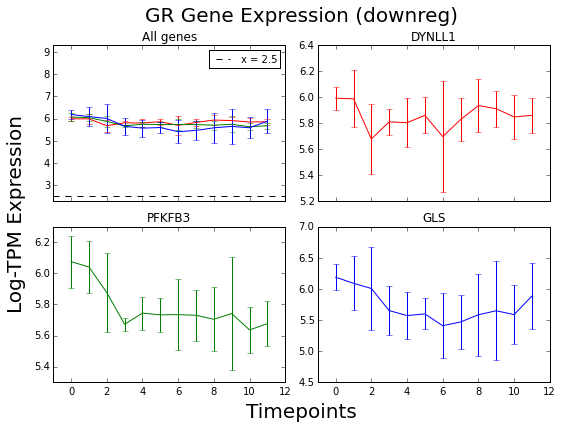

Gene to color is:  {'TAF7': 'b', 'JAG1': 'r', 'HSPH1': 'g'}
Y min is :  5.12928860733
Y max is :  5.69924103715
Y avg is :  5.34261869663
Y std is :  0.152594108901
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-5-0-HSPH1-JAG1-TAF7


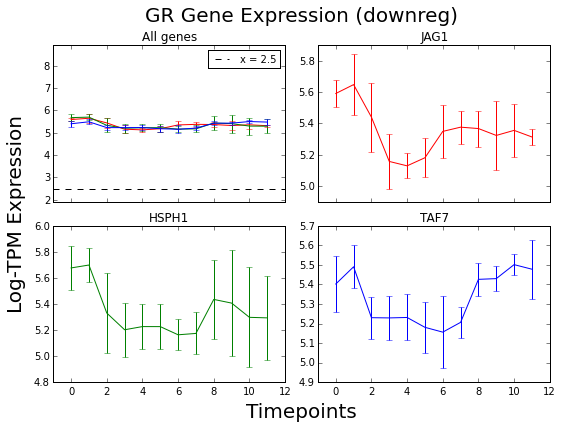

Gene to color is:  {'PLK2': 'r', 'HMOX1': 'b', 'KLF10': 'g'}
Y min is :  4.50258277071
Y max is :  6.18479544954
Y avg is :  5.09194298754
Y std is :  0.357664230687
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-5-0-HMOX1-KLF10-PLK2


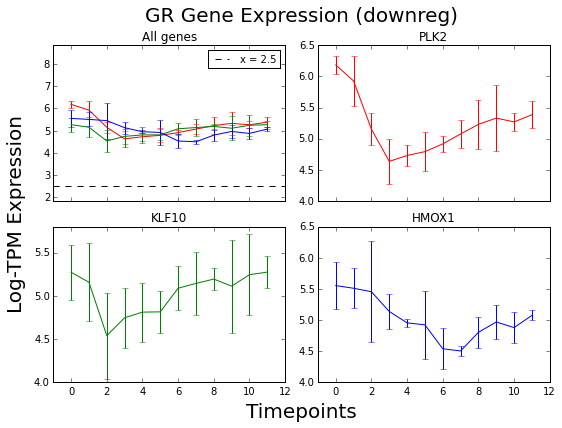

Gene to color is:  {'OSGIN2': 'b', 'RND3': 'r', 'ASUN': 'g'}
Y min is :  4.61955969107
Y max is :  5.4244544937
Y avg is :  4.98148436741
Y std is :  0.187765324163
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-4-0-ASUN-OSGIN2-RND3


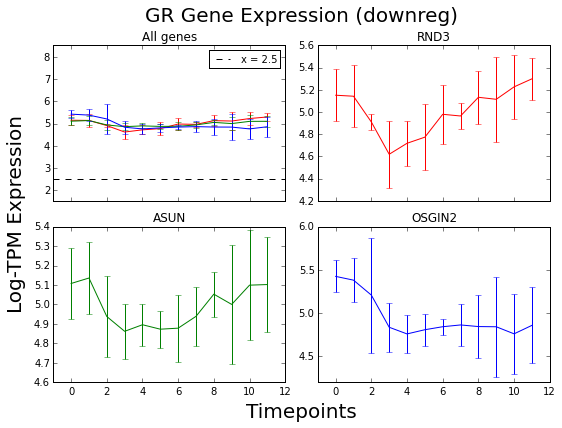

Gene to color is:  {'ALDH1B1': 'g', 'FZD2': 'r', 'SFRP1': 'b'}
Y min is :  4.33273331527
Y max is :  5.01320024054
Y avg is :  4.70054288483
Y std is :  0.15113961746
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-4-0-ALDH1B1-FZD2-SFRP1


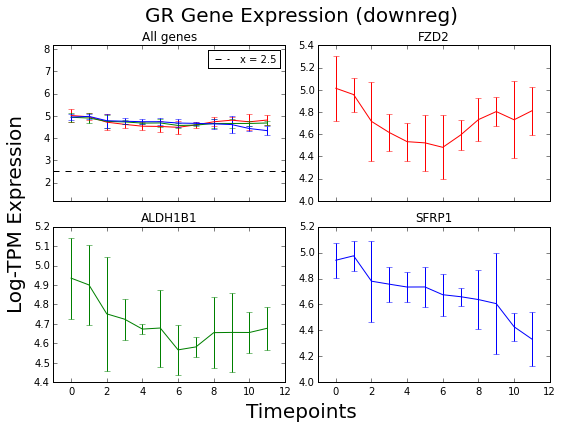

Gene to color is:  {'BHLHE40': 'r', 'DHX32': 'b', 'SMOX': 'g'}
Y min is :  4.18379885863
Y max is :  5.09258170833
Y avg is :  4.65135480041
Y std is :  0.204992239038
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-4-0-BHLHE40-DHX32-SMOX


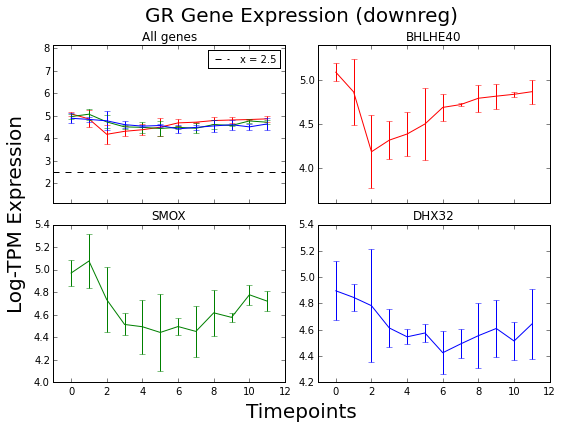

Gene to color is:  {'NFE2L2': 'b', 'RIPK2': 'r', 'IVNS1ABP': 'g'}
Y min is :  4.31847885113
Y max is :  4.93656112951
Y avg is :  4.55642258002
Y std is :  0.160845635739
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-4-0-IVNS1ABP-NFE2L2-RIPK2


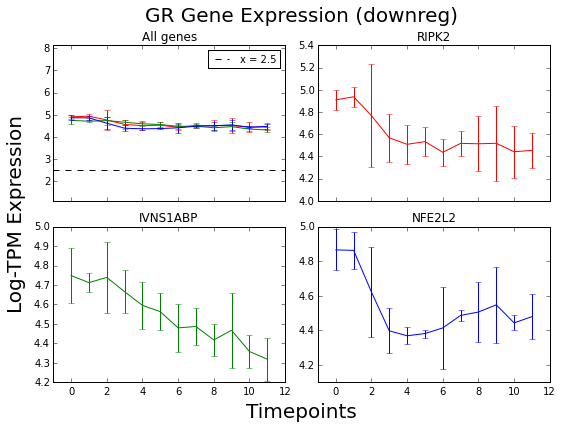

Gene to color is:  {'PVRL2': 'g', 'TNFAIP1': 'r', 'SH3KBP1': 'b'}
Y min is :  4.2822551706
Y max is :  4.76822422902
Y avg is :  4.52514687983
Y std is :  0.118740233646
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-4-0-PVRL2-SH3KBP1-TNFAIP1


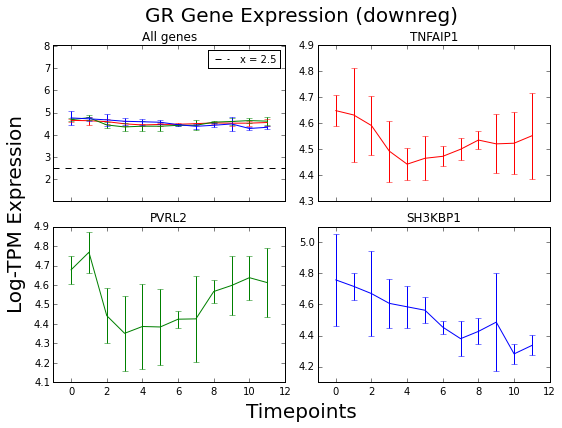

Gene to color is:  {'TUBA4A': 'b', 'TNFRSF12A': 'g', 'EMP3': 'r'}
Y min is :  4.01536033976
Y max is :  4.7926169461
Y avg is :  4.46621218775
Y std is :  0.180480608885
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-4-0-EMP3-TNFRSF12A-TUBA4A


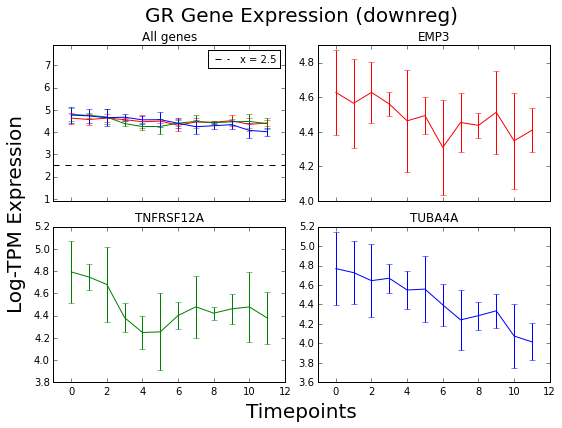

Gene to color is:  {'DUSP4': 'r', 'BAIAP2L1': 'g', 'MOSPD1': 'b'}
Y min is :  4.14882932833
Y max is :  4.8466268548
Y avg is :  4.40480267719
Y std is :  0.164275357625
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-4-0-BAIAP2L1-DUSP4-MOSPD1


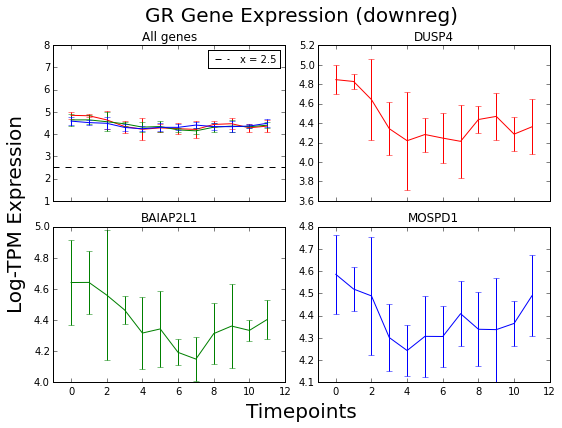

Gene to color is:  {'STK17A': 'g', 'RFC1': 'b', 'MSANTD3': 'r'}
Y min is :  4.07391856836
Y max is :  4.54845954692
Y avg is :  4.30524786128
Y std is :  0.139067665859
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-4-0-MSANTD3-RFC1-STK17A


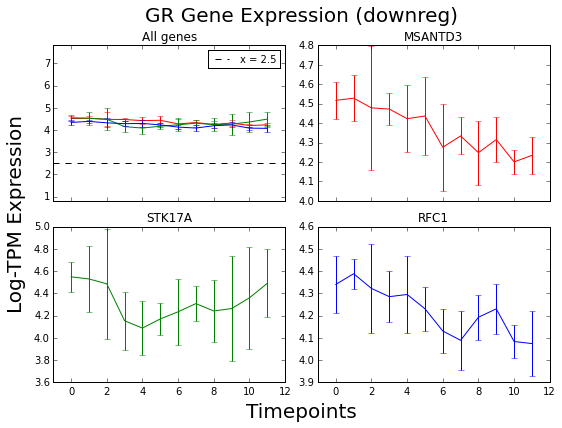

Gene to color is:  {'DCBLD1': 'r', 'DNAJC1': 'b', 'WNT7B': 'g'}
Y min is :  3.83401093816
Y max is :  4.65231391064
Y avg is :  4.176294477
Y std is :  0.183856044639
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-4-0-DCBLD1-DNAJC1-WNT7B


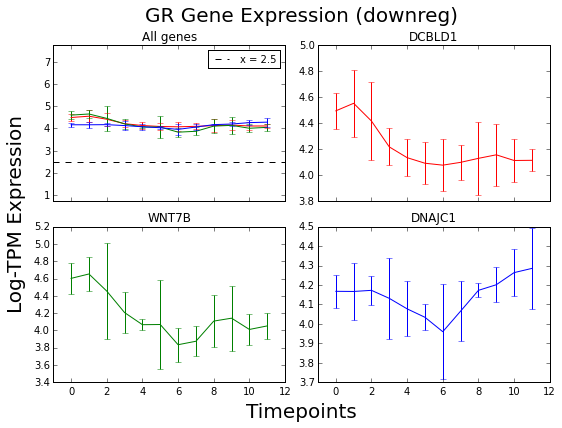

Gene to color is:  {'PNP': 'b', 'DHRS3': 'r', 'CRY1': 'g'}
Y min is :  3.783829012
Y max is :  4.49253617735
Y avg is :  4.11563790912
Y std is :  0.181031385444
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-4-0-CRY1-DHRS3-PNP


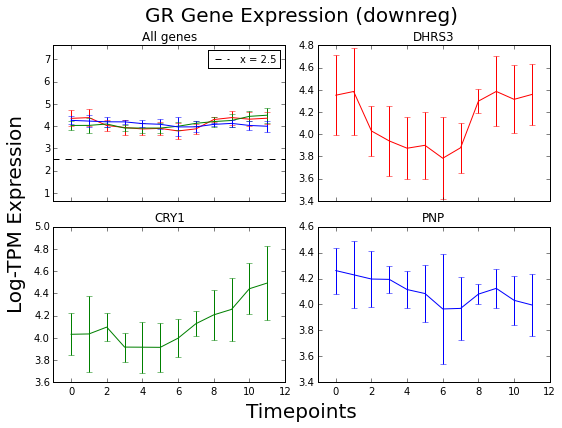

Gene to color is:  {'KRT80': 'r', 'KIF16B': 'g', 'VLDLR': 'b'}
Y min is :  3.78793495287
Y max is :  4.59519103938
Y avg is :  4.07669249501
Y std is :  0.179405429693
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-4-0-KIF16B-KRT80-VLDLR


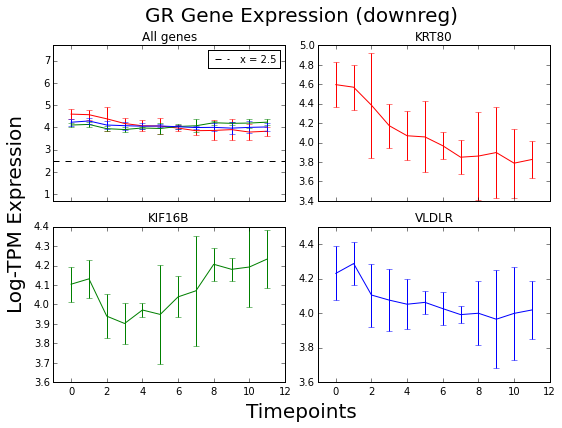

Gene to color is:  {'RAB9A': 'r', 'ASF1A': 'g', 'EREG': 'b'}
Y min is :  3.39513150355
Y max is :  5.10785079863
Y avg is :  4.0446019368
Y std is :  0.313285266986
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-4-0-ASF1A-EREG-RAB9A


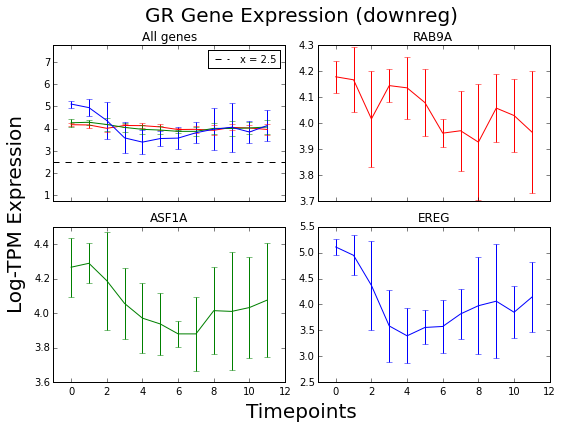

Gene to color is:  {'DRAM1': 'r', 'EDN1': 'b', 'RP2': 'g'}
Y min is :  3.70691031835
Y max is :  4.51877206016
Y avg is :  4.00257250106
Y std is :  0.206496450801
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-4-0-DRAM1-EDN1-RP2


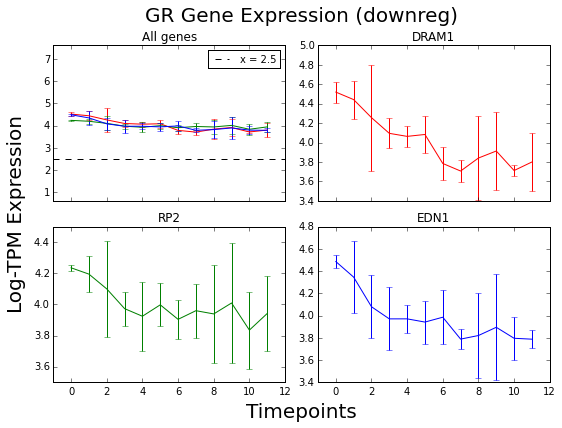

Gene to color is:  {'NXPE3': 'b', 'DOCK10': 'r', 'AKIRIN2': 'g'}
Y min is :  3.59117667269
Y max is :  4.50539738487
Y avg is :  3.96931465164
Y std is :  0.213807560339
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-AKIRIN2-DOCK10-NXPE3


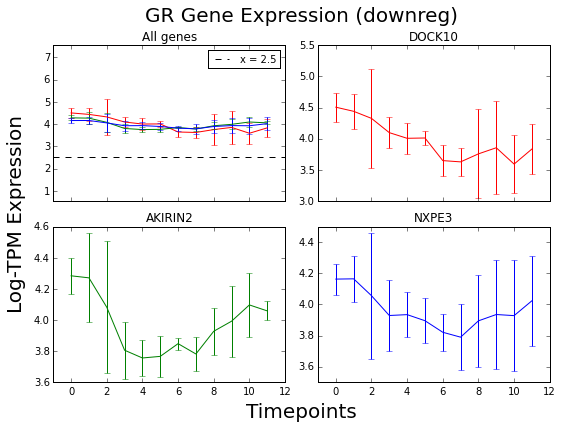

Gene to color is:  {'CCND3': 'g', 'FUT8': 'b', 'PCED1B': 'r'}
Y min is :  3.62955788984
Y max is :  4.51752566793
Y avg is :  3.95420245191
Y std is :  0.241575479448
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-CCND3-FUT8-PCED1B


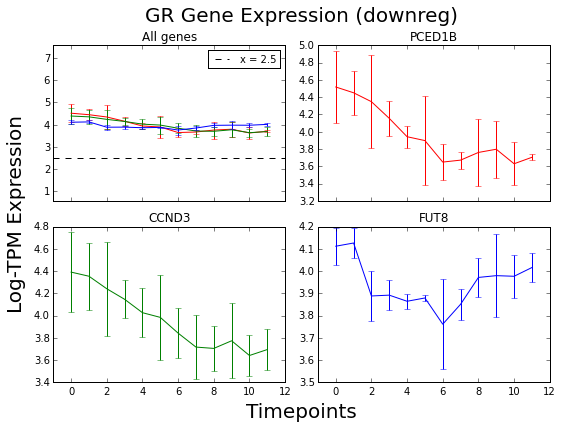

Gene to color is:  {'NRG1': 'r', 'CHORDC1': 'g', 'KIFC3': 'b'}
Y min is :  3.61616229429
Y max is :  4.47104413192
Y avg is :  3.93162025444
Y std is :  0.208623710019
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-CHORDC1-KIFC3-NRG1


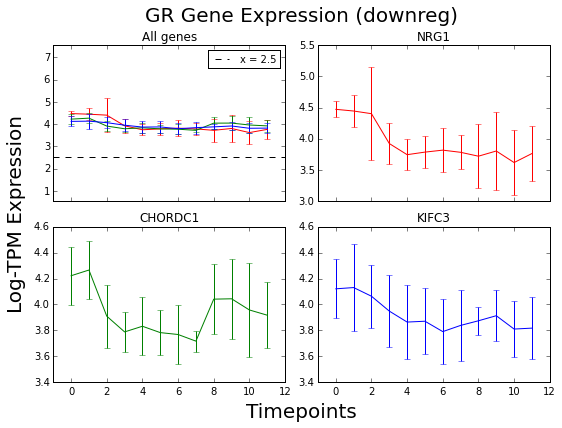

Gene to color is:  {'L3HYPDH': 'g', 'NUAK2': 'b', 'IER5L': 'r'}
Y min is :  3.45885340346
Y max is :  4.54323563355
Y avg is :  3.89943890317
Y std is :  0.212392325583
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-IER5L-L3HYPDH-NUAK2


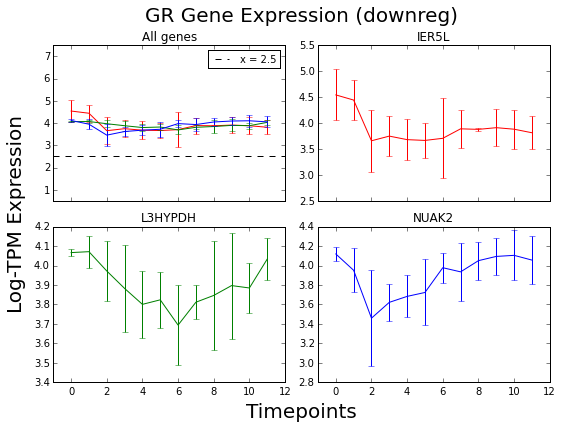

Gene to color is:  {'FAM13B': 'b', 'SERPINH1': 'g', 'C9orf3': 'r'}
Y min is :  3.6717151489
Y max is :  4.13403334258
Y avg is :  3.85888362302
Y std is :  0.12778400174
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-C9orf3-FAM13B-SERPINH1


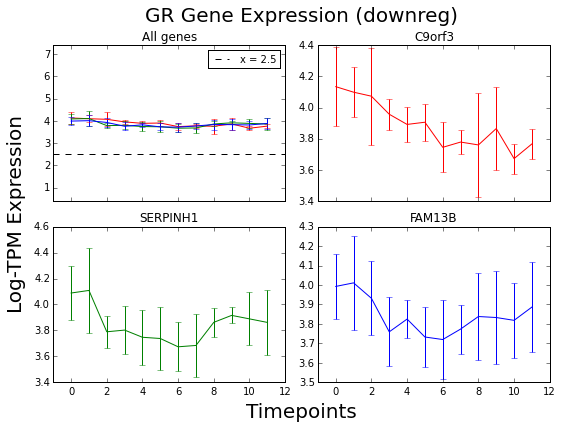

Gene to color is:  {'WDSUB1': 'g', 'DUSP14': 'b', 'C11orf86': 'r'}
Y min is :  3.32207737852
Y max is :  4.32716580368
Y avg is :  3.80536189379
Y std is :  0.224676396196
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-C11orf86-DUSP14-WDSUB1


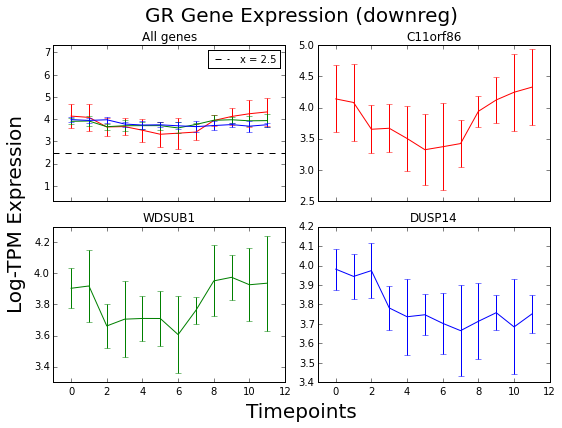

Gene to color is:  {'MAP2K3': 'b', 'MRGBP': 'r', 'UACA': 'g'}
Y min is :  3.5107835468
Y max is :  4.02125078042
Y avg is :  3.76572614159
Y std is :  0.140848503521
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-MAP2K3-MRGBP-UACA


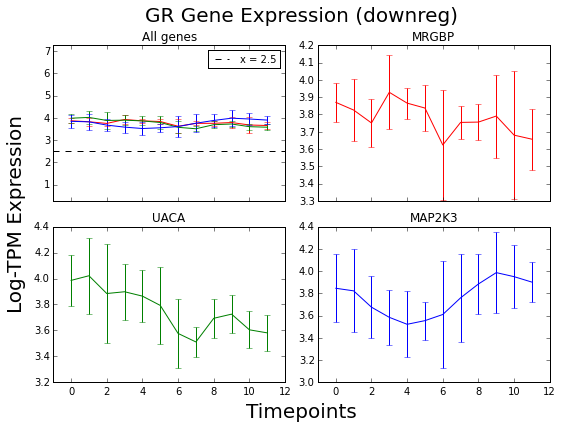

Gene to color is:  {'HSPA1A': 'b', 'FOXA2': 'r', 'TGIF1': 'g'}
Y min is :  3.28256409895
Y max is :  4.41370827402
Y avg is :  3.74986674087
Y std is :  0.268188173023
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-FOXA2-HSPA1A-TGIF1


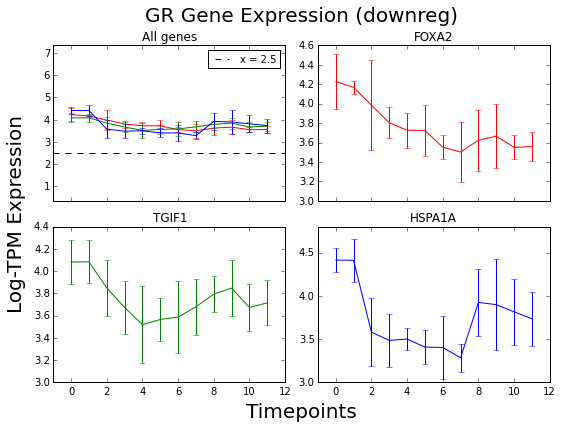

Gene to color is:  {'TPBG': 'b', 'CASC10': 'g', 'SPG20': 'r'}
Y min is :  3.29553630194
Y max is :  4.04574315884
Y avg is :  3.6767632879
Y std is :  0.175414004665
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-CASC10-SPG20-TPBG


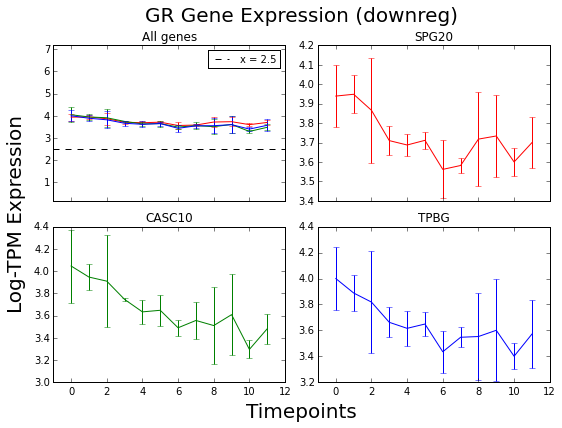

Gene to color is:  {'FHL2': 'b', 'AMN1': 'g', 'EFTUD1': 'r'}
Y min is :  3.43442420683
Y max is :  3.9022284656
Y avg is :  3.63588131341
Y std is :  0.119489545511
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-AMN1-EFTUD1-FHL2


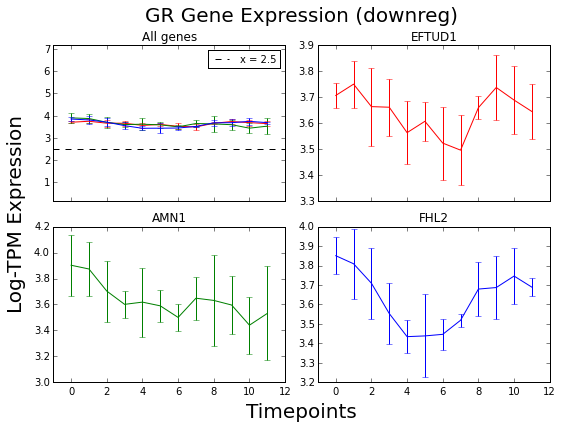

Gene to color is:  {'ATG4C': 'g', 'KANSL3': 'b', 'HERC4': 'r'}
Y min is :  3.39751508921
Y max is :  3.88495938012
Y avg is :  3.59509898503
Y std is :  0.128426754557
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-ATG4C-HERC4-KANSL3


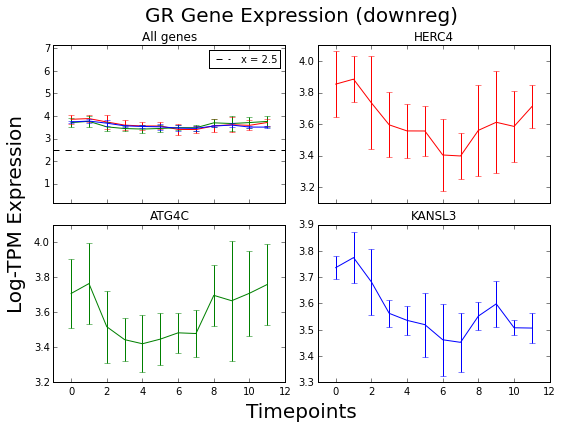

Gene to color is:  {'PTGS2': 'g', 'ZBTB18': 'b', 'CPEB2': 'r'}
Y min is :  3.21233310399
Y max is :  4.28306496742
Y avg is :  3.55193166525
Y std is :  0.251511880807
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-CPEB2-PTGS2-ZBTB18


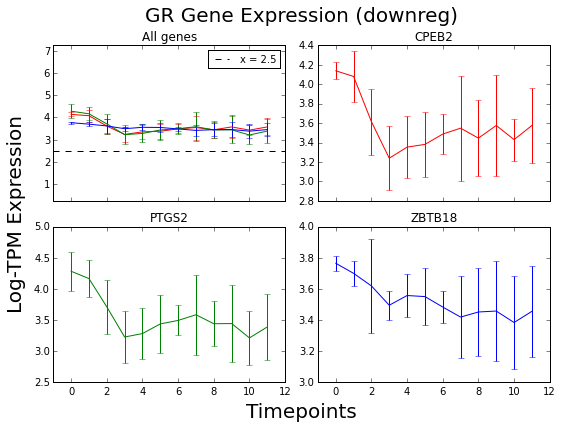

Gene to color is:  {'RBM24': 'b', 'ENC1': 'r', 'PPAP2B': 'g'}
Y min is :  3.15106150846
Y max is :  4.24337200329
Y avg is :  3.51941414812
Y std is :  0.297581457314
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-ENC1-PPAP2B-RBM24


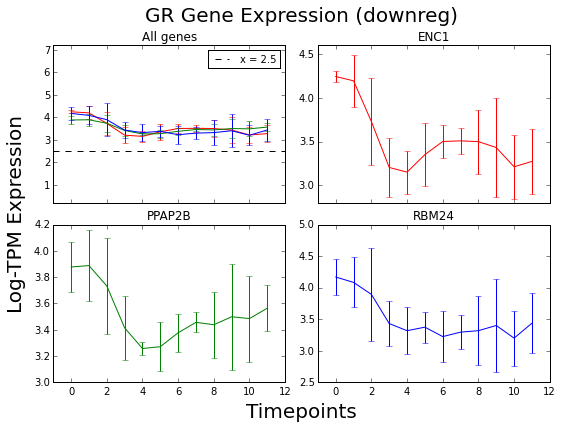

Gene to color is:  {'IER5': 'r', 'MALT1': 'g', 'AREG': 'b'}
Y min is :  3.09407680767
Y max is :  4.2247328364
Y avg is :  3.49302775441
Y std is :  0.293137860646
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-AREG-IER5-MALT1


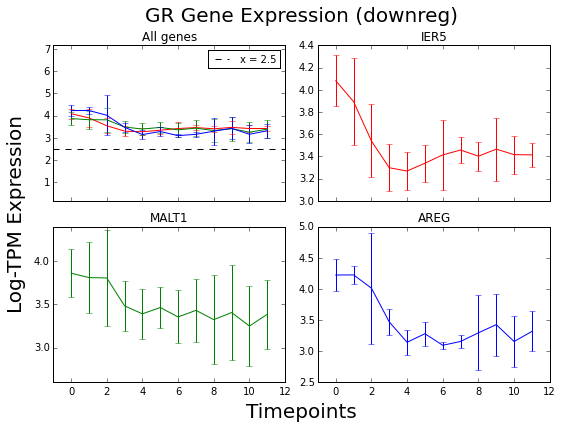

Gene to color is:  {'NUAK1': 'g', 'SERTAD2': 'b', 'TRAFD1': 'r'}
Y min is :  3.11859015662
Y max is :  3.95979296136
Y avg is :  3.44518175551
Y std is :  0.214557956354
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-NUAK1-SERTAD2-TRAFD1


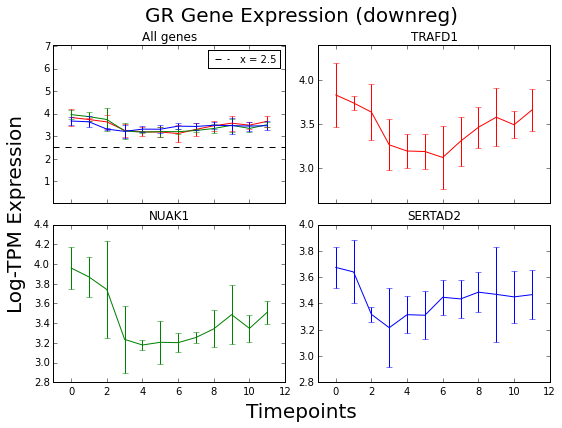

Gene to color is:  {'SYT13': 'g', 'MAFK': 'r', 'TUFT1': 'b'}
Y min is :  2.77165981241
Y max is :  4.14607679933
Y avg is :  3.40911270409
Y std is :  0.325363580942
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-MAFK-SYT13-TUFT1


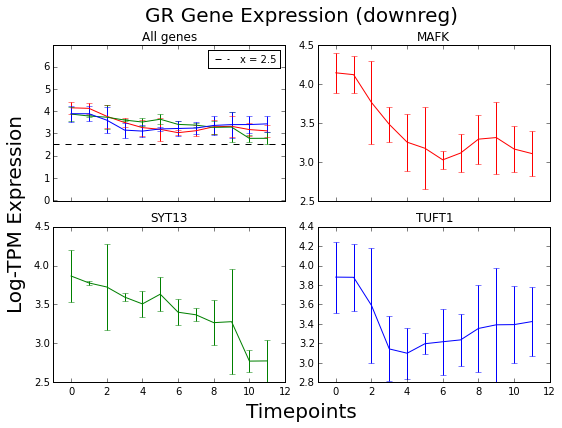

Gene to color is:  {'MAP3K8': 'b', 'CSF1': 'r', 'EXT1': 'g'}
Y min is :  2.9558310367
Y max is :  3.92450092432
Y avg is :  3.38379639574
Y std is :  0.249225669726
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-CSF1-EXT1-MAP3K8


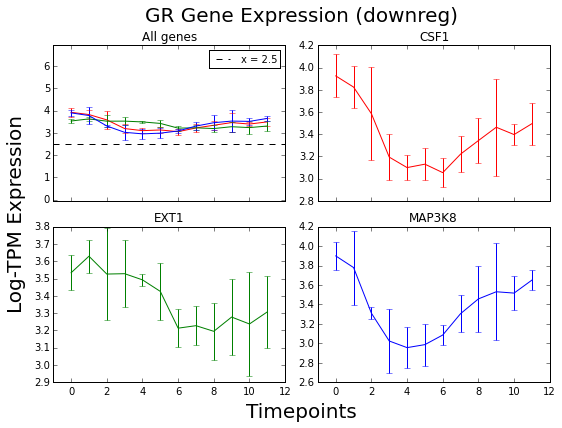

Gene to color is:  {'UNKL': 'r', 'SMARCAL1': 'g', 'SGK223': 'b'}
Y min is :  3.03066233553
Y max is :  3.73402800023
Y avg is :  3.35988407164
Y std is :  0.180514205508
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-SGK223-SMARCAL1-UNKL


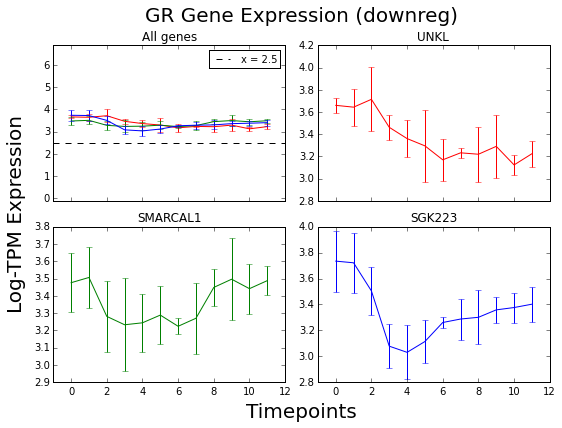

Gene to color is:  {'E2F5': 'b', 'DIO2': 'g', 'TRIM6': 'r'}
Y min is :  2.28732667516
Y max is :  4.40344683785
Y avg is :  3.31326694721
Y std is :  0.421902013836
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-DIO2-E2F5-TRIM6


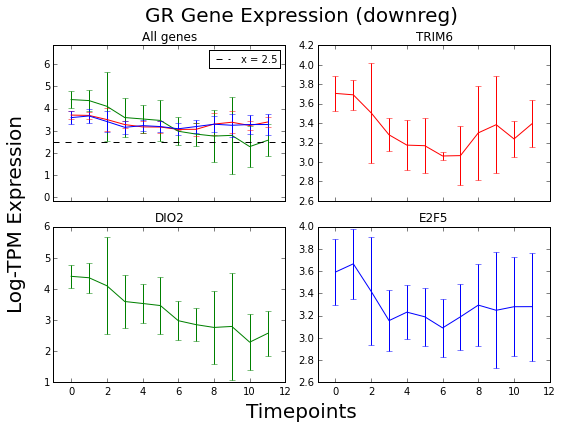

Gene to color is:  {'CDC42EP1': 'g', 'RHOF': 'r', 'AFAP1': 'b'}
Y min is :  2.98578518117
Y max is :  3.7318326549
Y avg is :  3.28532003013
Y std is :  0.20321784231
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-AFAP1-CDC42EP1-RHOF


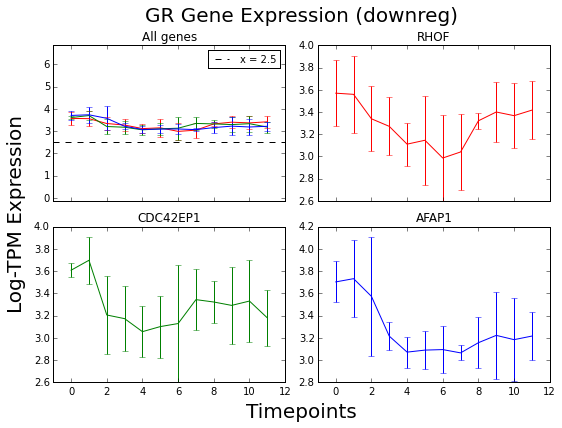

Gene to color is:  {'LIPH': 'g', 'CCNH': 'r', 'SLC10A4': 'b'}
Y min is :  2.90175401221
Y max is :  3.60755338559
Y avg is :  3.26159188328
Y std is :  0.144505038657
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-CCNH-LIPH-SLC10A4


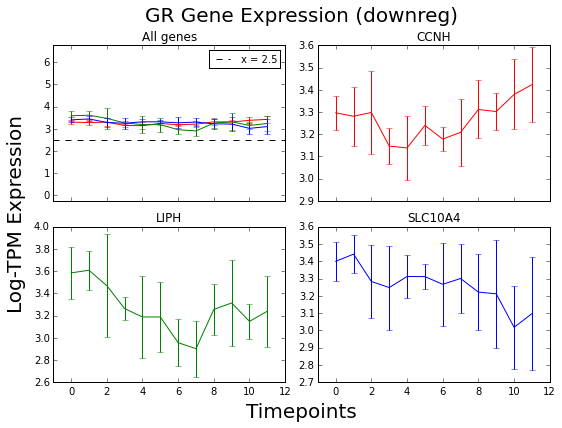

Gene to color is:  {'ALPK2': 'b', 'JUN': 'r', 'TPST1': 'g'}
Y min is :  2.85297901448
Y max is :  3.67998945913
Y avg is :  3.24523114062
Y std is :  0.200211989904
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-ALPK2-JUN-TPST1


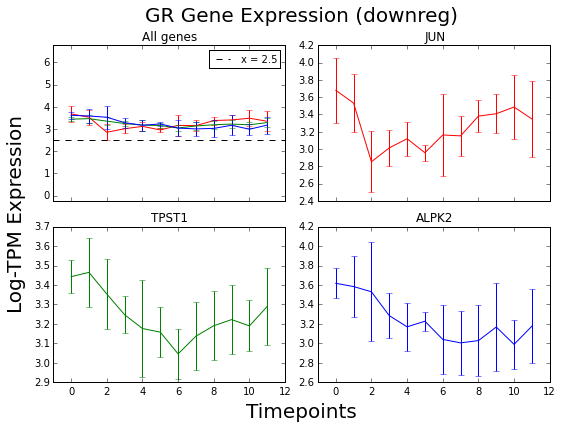

Gene to color is:  {'EFR3B': 'g', 'PCOLCE2': 'b', 'PNMAL1': 'r'}
Y min is :  2.83558904501
Y max is :  3.56806345054
Y avg is :  3.20895313424
Y std is :  0.173385473651
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-EFR3B-PCOLCE2-PNMAL1


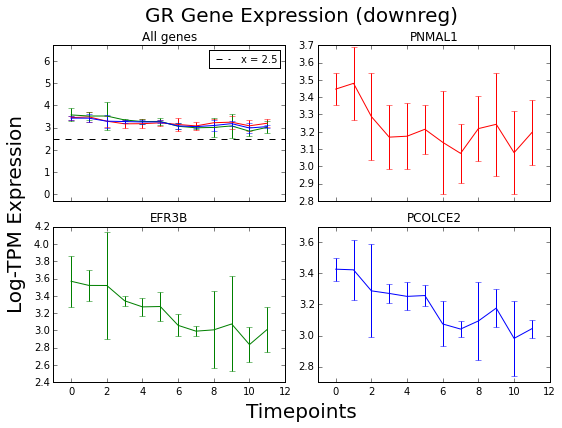

Gene to color is:  {'STXBP1': 'g', 'IFFO2': 'b', 'ACKR3': 'r'}
Y min is :  2.67780863117
Y max is :  4.11272781563
Y avg is :  3.1901889733
Y std is :  0.3269731344
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-ACKR3-IFFO2-STXBP1


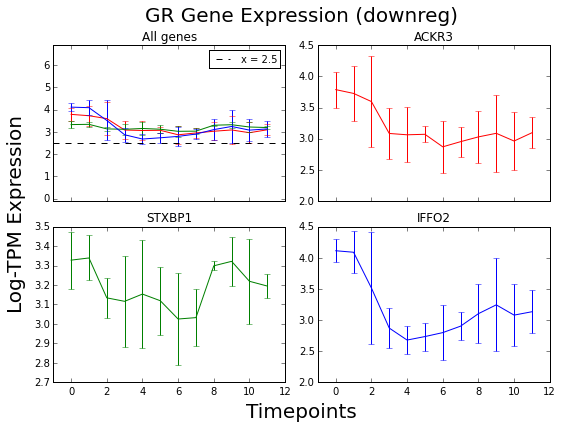

Gene to color is:  {'STAMBPL1': 'r', 'LIF': 'b', 'ZCCHC7': 'g'}
Y min is :  2.85374799057
Y max is :  3.6614495312
Y avg is :  3.17001498061
Y std is :  0.218169183447
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-LIF-STAMBPL1-ZCCHC7


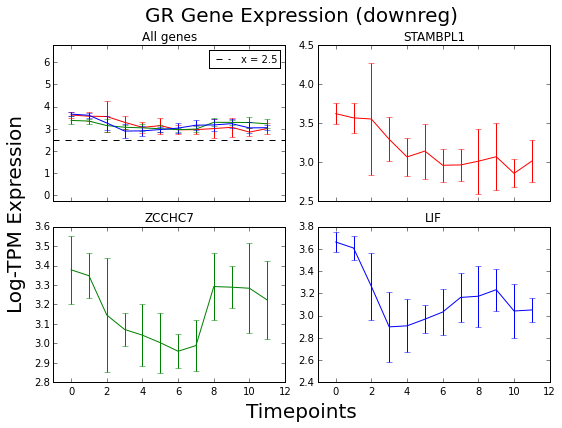

Gene to color is:  {'ARHGEF10': 'b', 'IFT46': 'g', 'SLC40A1': 'r'}
Y min is :  2.69041579585
Y max is :  3.649097733
Y avg is :  3.15363023084
Y std is :  0.176210520663
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-ARHGEF10-IFT46-SLC40A1


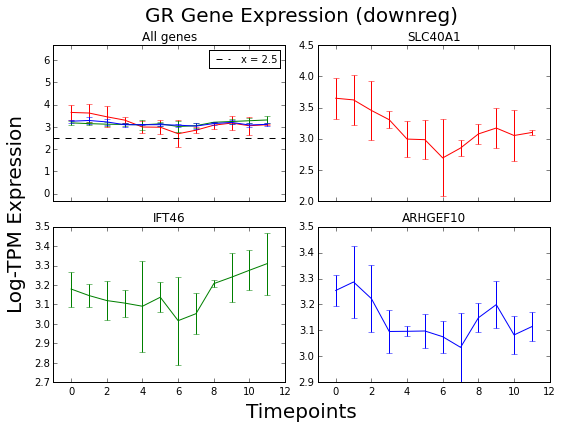

Gene to color is:  {'SYNJ2': 'g', 'DCLK2': 'b', 'IER3': 'r'}
Y min is :  2.62378410549
Y max is :  4.21353025018
Y avg is :  3.1187545621
Y std is :  0.331044366746
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-DCLK2-IER3-SYNJ2


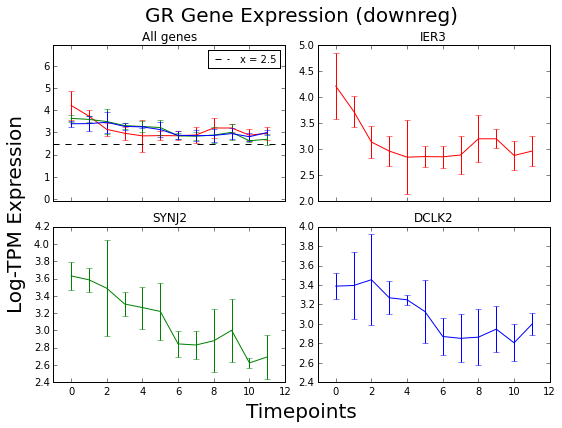

Gene to color is:  {'CHST11': 'g', 'TRIM5': 'b', 'CNNM4': 'r'}
Y min is :  2.67717770394
Y max is :  3.59563499583
Y avg is :  3.07267138422
Y std is :  0.225301662326
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-CHST11-CNNM4-TRIM5


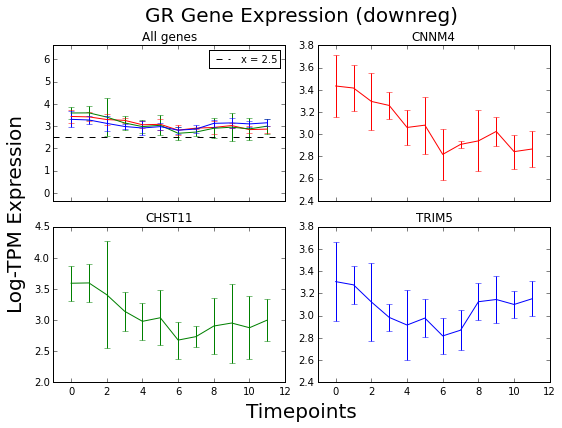

Gene to color is:  {'NIPAL4': 'b', 'MSC': 'g', 'NR5A2': 'r'}
Y min is :  2.63102215906
Y max is :  3.66469419223
Y avg is :  3.03469708972
Y std is :  0.262768920889
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-MSC-NIPAL4-NR5A2


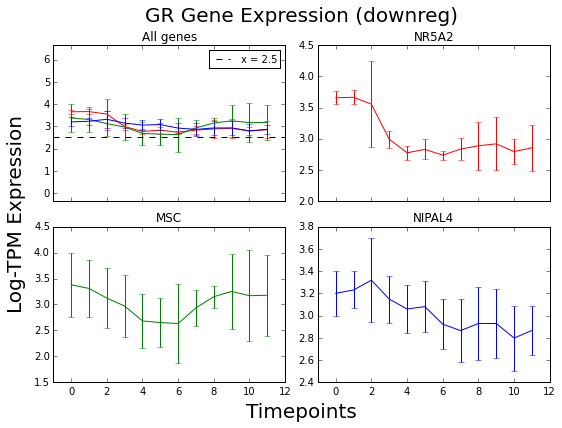

Gene to color is:  {'CLN8': 'b', 'HSPA12A': 'g', 'GCNT2': 'r'}
Y min is :  2.61837696916
Y max is :  3.37146609573
Y avg is :  3.00624131168
Y std is :  0.189627493699
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-3-0-CLN8-GCNT2-HSPA12A


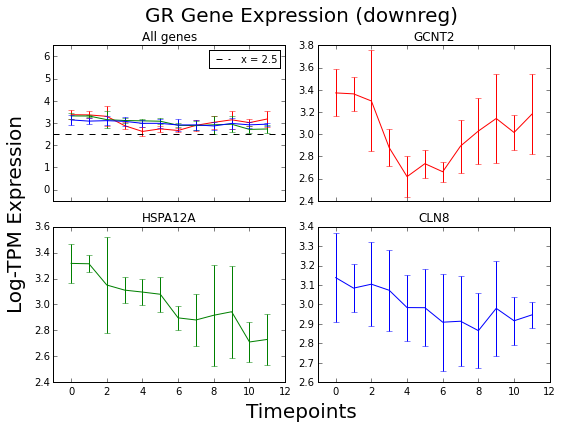

Gene to color is:  {'ADAM19': 'b', 'ZNF385A': 'g', 'AKR1E2': 'r'}
Y min is :  2.71621430447
Y max is :  3.32896268903
Y avg is :  2.96612232066
Y std is :  0.148776831492
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-ADAM19-AKR1E2-ZNF385A


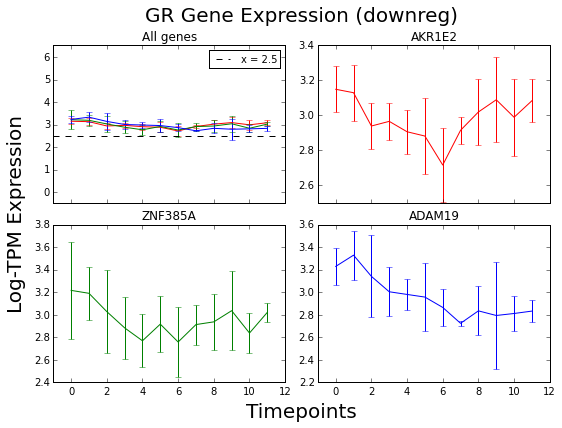

Gene to color is:  {'TBC1D22B': 'r', 'SAMD9': 'b', 'IER2': 'g'}
Y min is :  2.55350336466
Y max is :  3.66066004267
Y avg is :  2.95048225952
Y std is :  0.221430615061
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-IER2-SAMD9-TBC1D22B


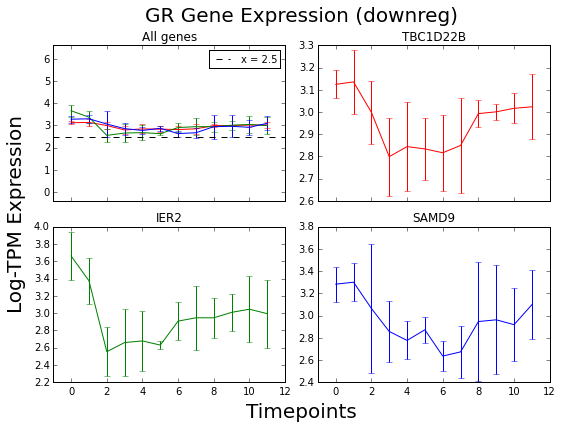

Gene to color is:  {'OAS1': 'g', 'FBLIM1': 'r', 'NFKB2': 'b'}
Y min is :  2.42838077958
Y max is :  3.5745717769
Y avg is :  2.93458834541
Y std is :  0.250416960944
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-FBLIM1-NFKB2-OAS1


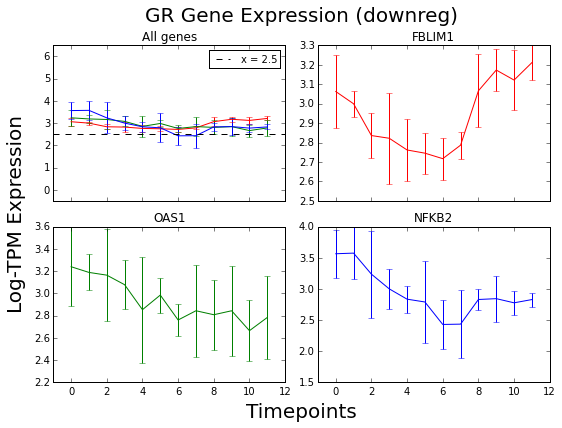

Gene to color is:  {'HOXC8': 'b', 'RNF19B': 'r', 'NRF1': 'g'}
Y min is :  2.69429729956
Y max is :  3.16962627781
Y avg is :  2.91758646662
Y std is :  0.132971099973
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-HOXC8-NRF1-RNF19B


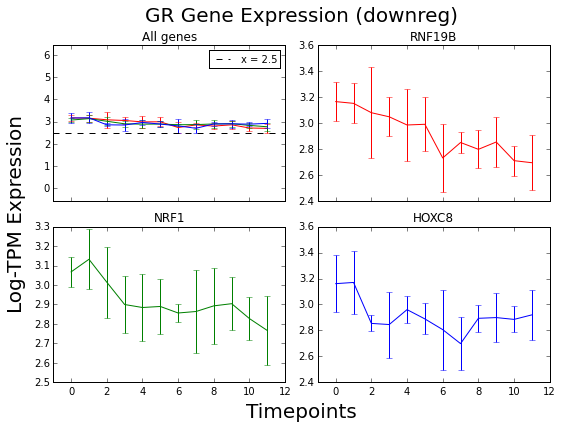

Gene to color is:  {'CLDN23': 'b', 'LIMA1': 'r', 'LARP6': 'g'}
Y min is :  2.59956367858
Y max is :  3.27949714404
Y avg is :  2.87415318699
Y std is :  0.135120500375
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-CLDN23-LARP6-LIMA1


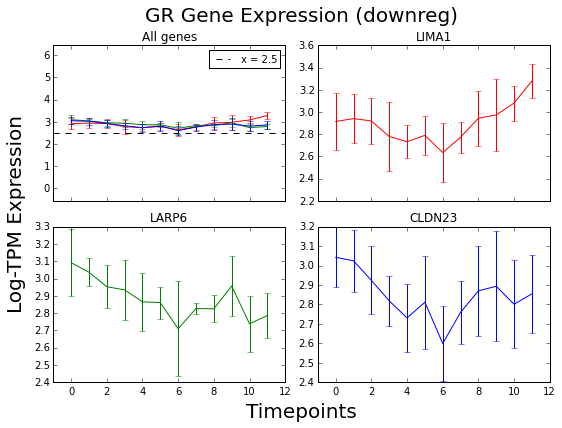

Gene to color is:  {'CYP26B1': 'b', 'SYNPO': 'r', 'MYOCD': 'g'}
Y min is :  2.46291181074
Y max is :  3.55771822852
Y avg is :  2.82148886456
Y std is :  0.266448006131
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-CYP26B1-MYOCD-SYNPO


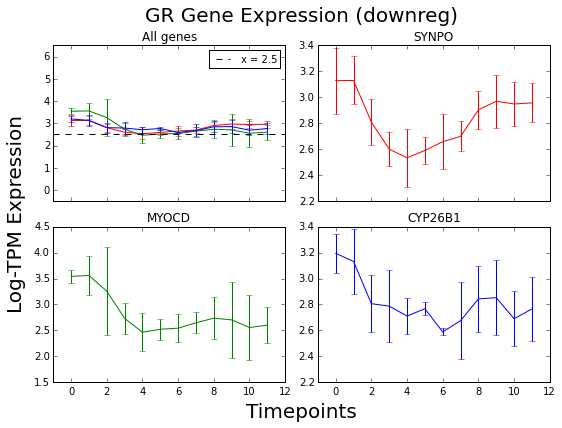

Gene to color is:  {'CCL2': 'b', 'ARSI': 'r', 'KANK1': 'g'}
Y min is :  2.08087595825
Y max is :  3.76472710587
Y avg is :  2.77633061134
Y std is :  0.294013435512
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-ARSI-CCL2-KANK1


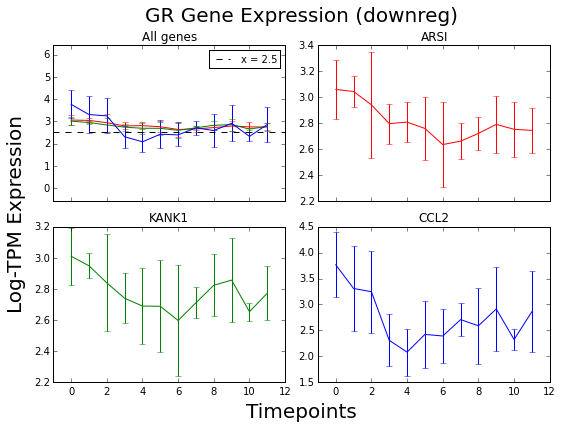

Gene to color is:  {'DAB2': 'r', 'BDNF': 'b', 'SLC35F3': 'g'}
Y min is :  2.39650257128
Y max is :  2.97376190456
Y avg is :  2.70709871729
Y std is :  0.151959835545
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-BDNF-DAB2-SLC35F3


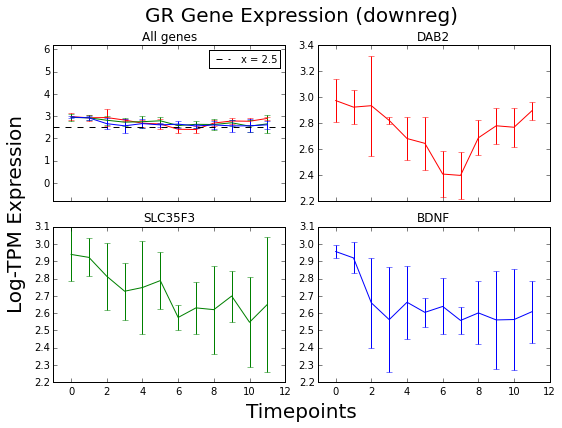

Gene to color is:  {'MRPS6': 'g', 'MAP3K14': 'r', 'AMPD2': 'b'}
Y min is :  2.36391753891
Y max is :  3.16382380931
Y avg is :  2.64070074325
Y std is :  0.198346669165
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-AMPD2-MAP3K14-MRPS6


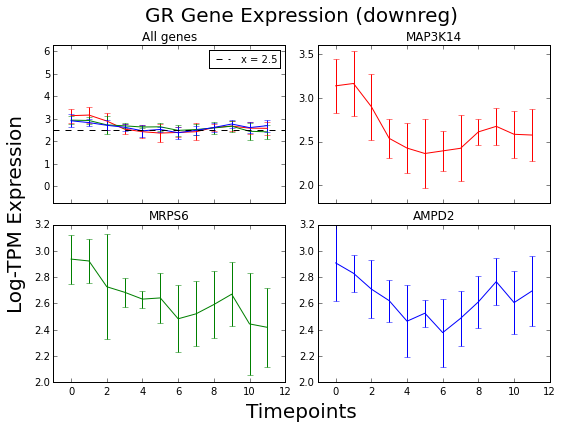

Gene to color is:  {'EVA1A': 'r', 'CEP72': 'b', 'PRKD2': 'g'}
Y min is :  2.01701351207
Y max is :  3.39499077292
Y avg is :  2.62672742302
Y std is :  0.254661586363
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-CEP72-EVA1A-PRKD2


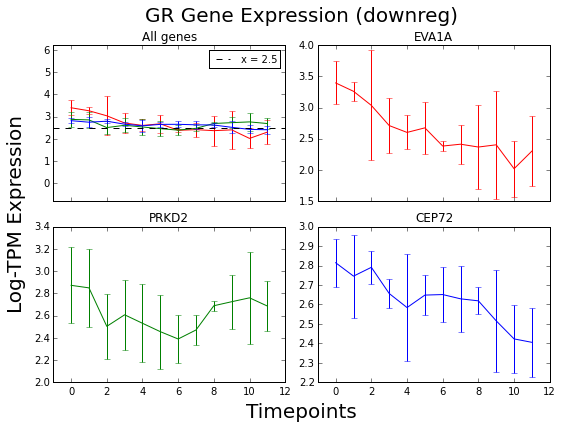

Gene to color is:  {'IRAK2': 'b', 'TRIML2': 'g', 'PITPNM1': 'r'}
Y min is :  1.84782615636
Y max is :  3.50752470498
Y avg is :  2.60290476819
Y std is :  0.374579329626
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-IRAK2-PITPNM1-TRIML2


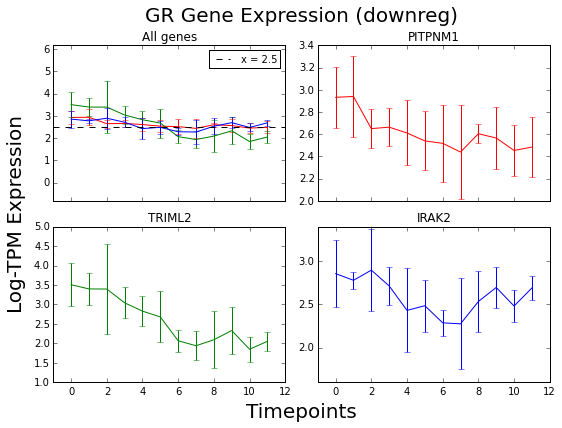

Gene to color is:  {'GLIS2': 'r', 'BCL2A1': 'b', 'TAOK3': 'g'}
Y min is :  1.90978465559
Y max is :  3.28281963436
Y avg is :  2.53785986257
Y std is :  0.254416548045
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-BCL2A1-GLIS2-TAOK3


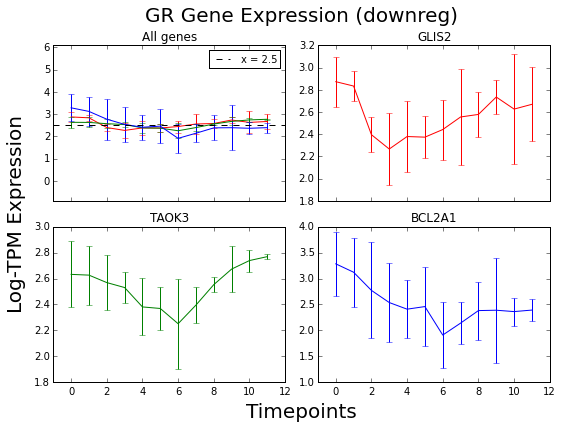

Gene to color is:  {'DNAJB2': 'r', 'DDX58': 'g', 'FOSL1': 'b'}
Y min is :  2.10647650228
Y max is :  3.05774850735
Y avg is :  2.48883578361
Y std is :  0.204834372079
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-DDX58-DNAJB2-FOSL1


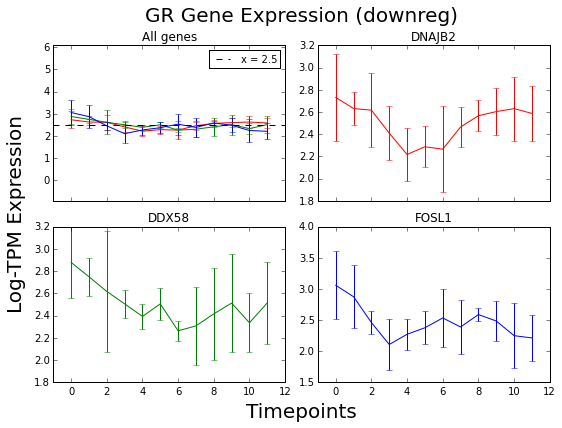

Gene to color is:  {'OCLN': 'g', 'NR0B1': 'b', 'MICB': 'r'}
Y min is :  1.93275816889
Y max is :  3.13673621227
Y avg is :  2.46434315329
Y std is :  0.283133389934
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-MICB-NR0B1-OCLN


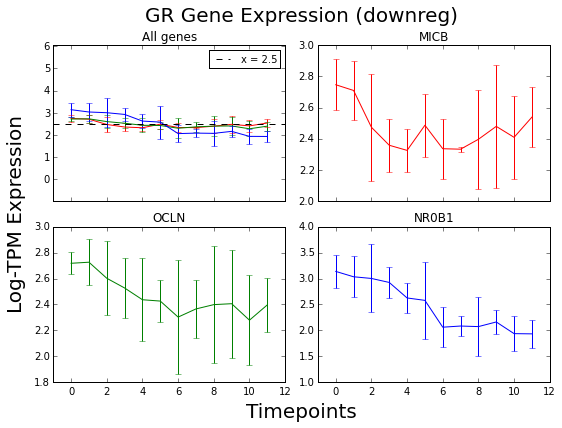

Gene to color is:  {'HNF1B': 'r', 'TNFSF9': 'b', 'ITGB6': 'g'}
Y min is :  2.00815340107
Y max is :  3.25762194098
Y avg is :  2.4523320082
Y std is :  0.26643813119
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-HNF1B-ITGB6-TNFSF9


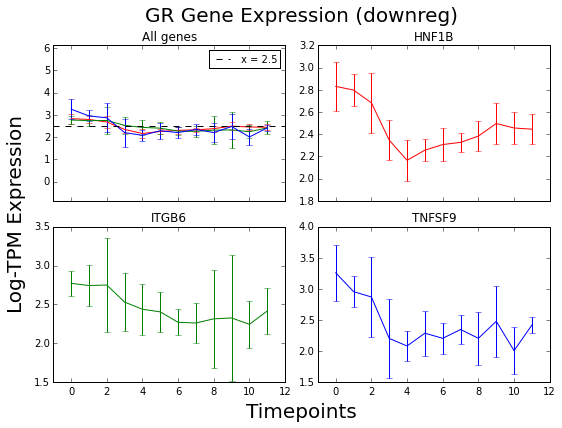

Gene to color is:  {'C17orf104': 'g', 'CEP19': 'r', 'ABHD6': 'b'}
Y min is :  2.17130966654
Y max is :  2.77331684167
Y avg is :  2.39566726708
Y std is :  0.141289069956
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-ABHD6-C17orf104-CEP19


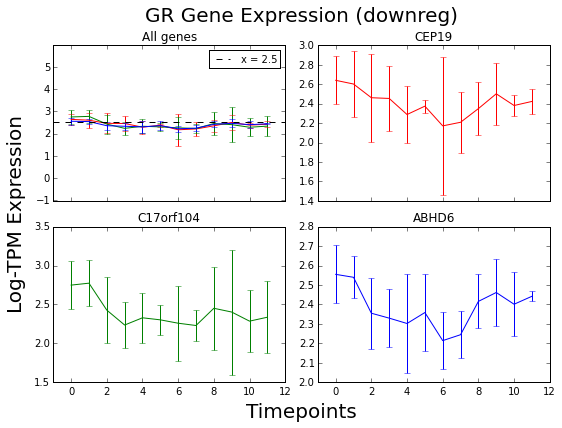

Gene to color is:  {'NR2F1': 'g', 'CD70': 'r', 'ZNF319': 'b'}
Y min is :  1.90691578362
Y max is :  2.89047559208
Y avg is :  2.35889460782
Y std is :  0.196901911701
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-CD70-NR2F1-ZNF319


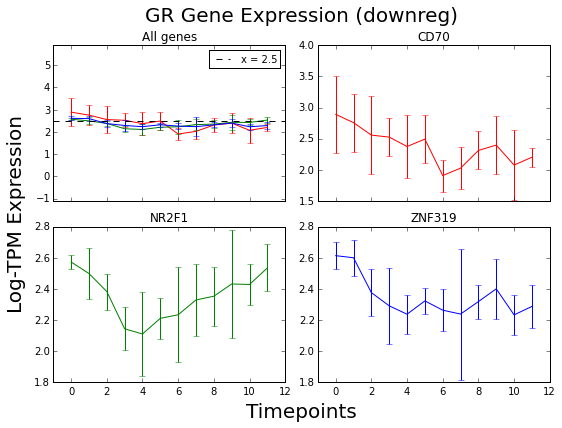

Gene to color is:  {'TGFA': 'g', 'ZNF544': 'r', 'TMEM92': 'b'}
Y min is :  1.82935474943
Y max is :  2.77923164425
Y avg is :  2.30448452854
Y std is :  0.219003232272
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-TGFA-TMEM92-ZNF544


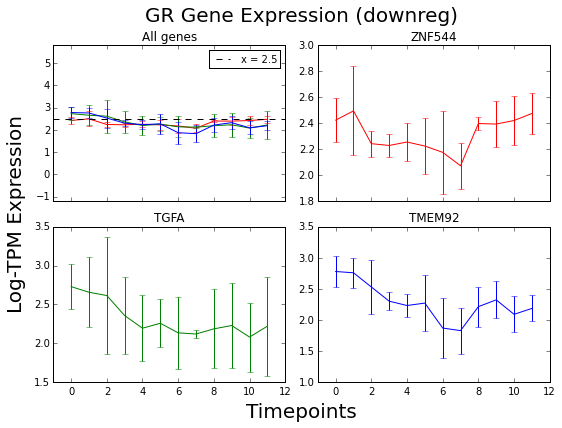

Gene to color is:  {'C6orf141': 'r', 'CYP27C1': 'b', 'RALGAPA2': 'g'}
Y min is :  1.73538416822
Y max is :  3.30855976927
Y avg is :  2.25593932934
Y std is :  0.337613423174
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-C6orf141-CYP27C1-RALGAPA2


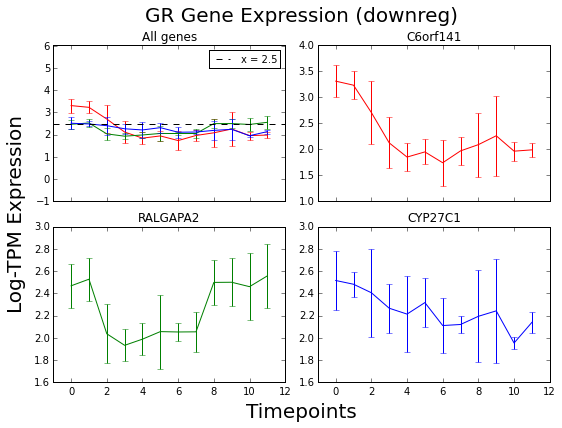

Gene to color is:  {'LAYN': 'r', 'CSRP2': 'g', 'MR1': 'b'}
Y min is :  1.8204660039
Y max is :  2.66430763466
Y avg is :  2.21240315114
Y std is :  0.191699877694
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-CSRP2-LAYN-MR1


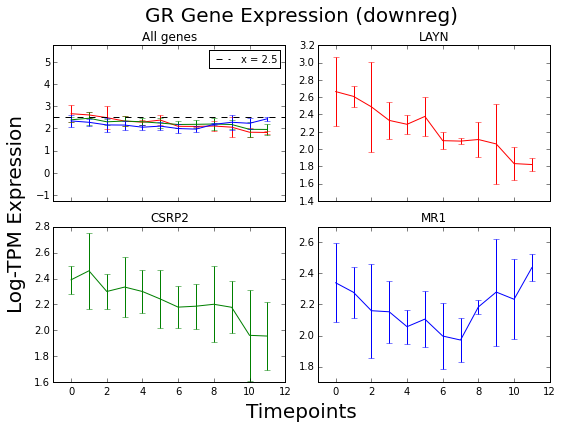

Gene to color is:  {'RGL1': 'r', 'FZD8': 'g', 'ATP10D': 'b'}
Y min is :  1.73748767098
Y max is :  2.92497882274
Y avg is :  2.15129547695
Y std is :  0.246886864861
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-ATP10D-FZD8-RGL1


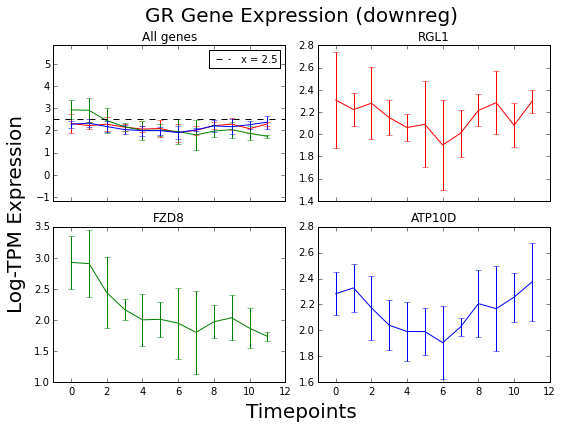

Gene to color is:  {'VAV3': 'g', 'OTUB2': 'b', 'HSD17B7': 'r'}
Y min is :  1.63044437215
Y max is :  2.74504274217
Y avg is :  2.12909475497
Y std is :  0.233274712215
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-HSD17B7-OTUB2-VAV3


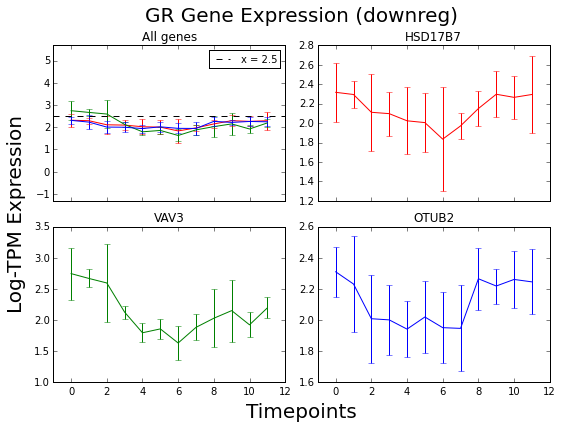

Gene to color is:  {'GLRB': 'g', 'GEM': 'b', 'NFKBIE': 'r'}
Y min is :  1.7649098533
Y max is :  2.73465572767
Y avg is :  2.097284227
Y std is :  0.211798147889
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-GEM-GLRB-NFKBIE


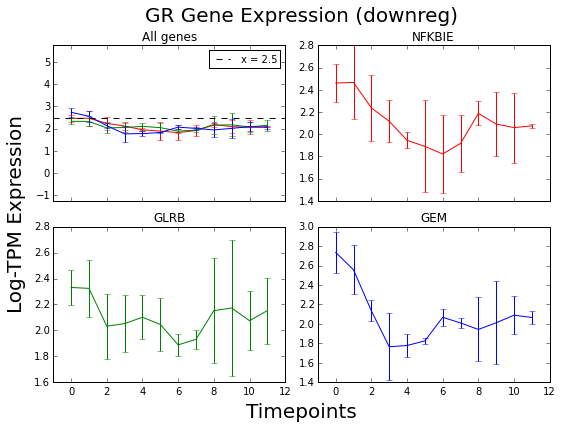

Gene to color is:  {'PLAUR': 'b', 'ZNF274': 'g', 'FMN2': 'r'}
Y min is :  1.79969695271
Y max is :  2.51226892048
Y avg is :  2.07414154778
Y std is :  0.201672204666
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-2-0-FMN2-PLAUR-ZNF274


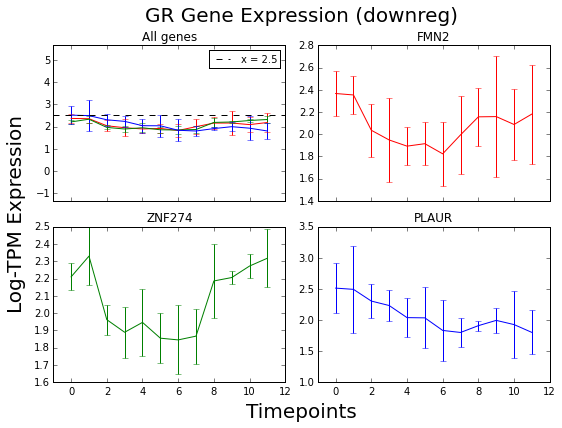

Gene to color is:  {'CDCP1': 'r', 'TRIM69': 'g', 'TMEM27': 'b'}
Y min is :  1.62443784606
Y max is :  2.42627181562
Y avg is :  1.9946728967
Y std is :  0.226793899695
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-CDCP1-TMEM27-TRIM69


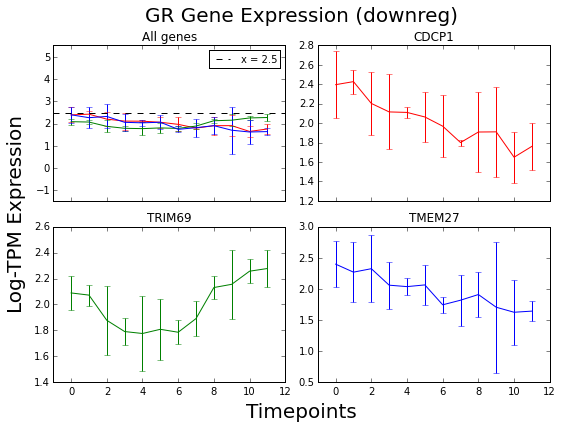

Gene to color is:  {'CLIP2': 'r', 'PLCL2': 'g', 'FBXO27': 'b'}
Y min is :  1.58690447342
Y max is :  2.48066638528
Y avg is :  1.94800864244
Y std is :  0.215545525405
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-CLIP2-FBXO27-PLCL2


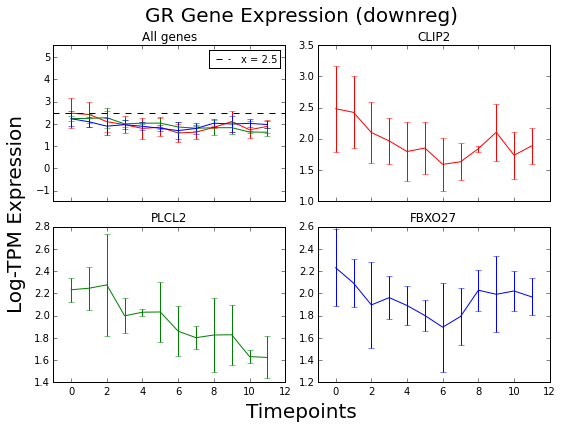

Gene to color is:  {'RND1': 'b', 'SMTN': 'r', 'TMEM158': 'g'}
Y min is :  1.45826367054
Y max is :  2.99701009898
Y avg is :  1.91879012329
Y std is :  0.323584239696
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-RND1-SMTN-TMEM158


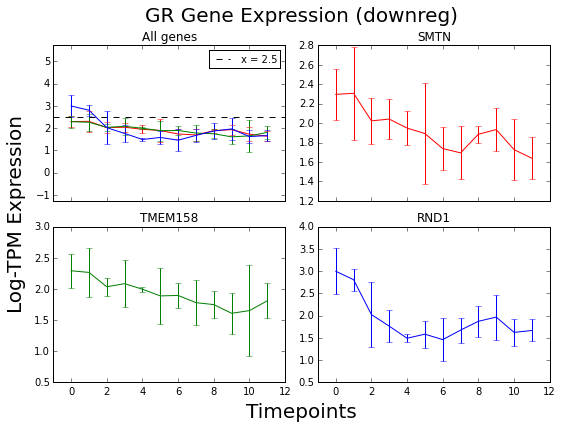

Gene to color is:  {'HIST1H2AG': 'b', 'ITPKB': 'r', 'DGKG': 'g'}
Y min is :  1.60819929038
Y max is :  2.10816422934
Y avg is :  1.8697486586
Y std is :  0.138399270771
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-DGKG-HIST1H2AG-ITPKB


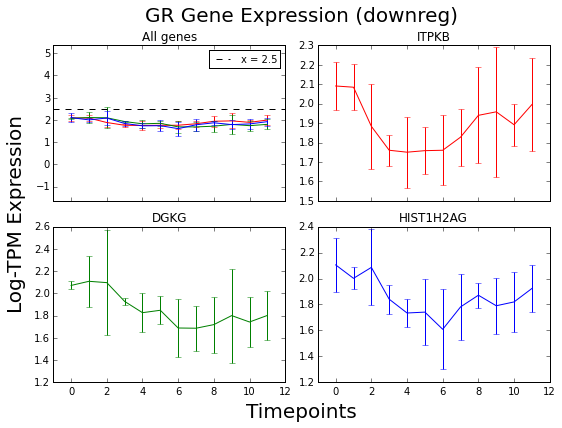

Gene to color is:  {'MARCH4': 'r', 'DLG4': 'g', 'PTHLH': 'b'}
Y min is :  1.34846883211
Y max is :  2.67876964178
Y avg is :  1.84822751043
Y std is :  0.353873893222
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-DLG4-MARCH4-PTHLH


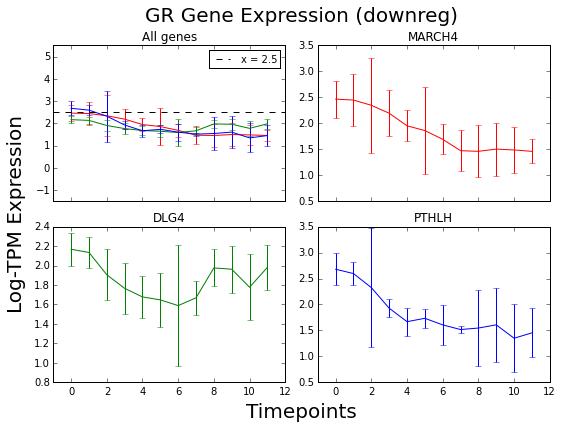

Gene to color is:  {'SYNE1': 'r', 'PPP2R5B': 'b', 'GALNT5': 'g'}
Y min is :  1.40680755778
Y max is :  2.32489507244
Y avg is :  1.78943515749
Y std is :  0.239455922227
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-GALNT5-PPP2R5B-SYNE1


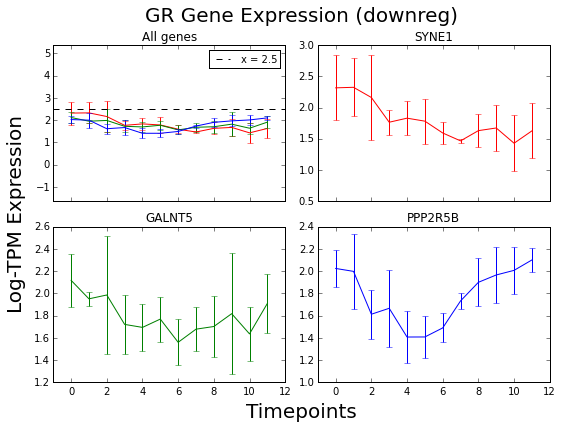

Gene to color is:  {'CXCL1': 'r', 'MAPK8IP1': 'b', 'CPA4': 'g'}
Y min is :  1.03798750785
Y max is :  2.53411921727
Y avg is :  1.74858908048
Y std is :  0.359110469292
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-CPA4-CXCL1-MAPK8IP1


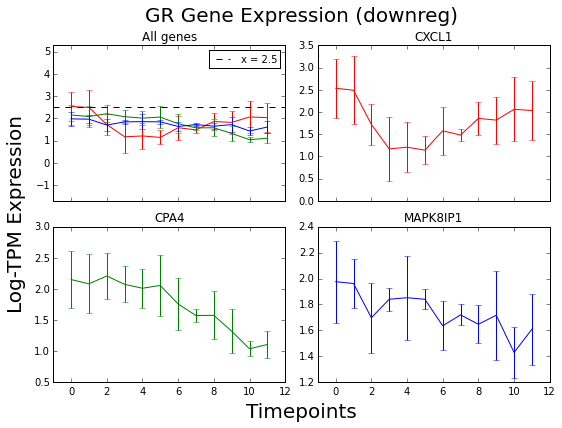

Gene to color is:  {'IL11': 'r', 'BDKRB2': 'b', 'THSD1': 'g'}
Y min is :  0.887912006758
Y max is :  3.51181963038
Y avg is :  1.73527782016
Y std is :  0.5432671902
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-BDKRB2-IL11-THSD1


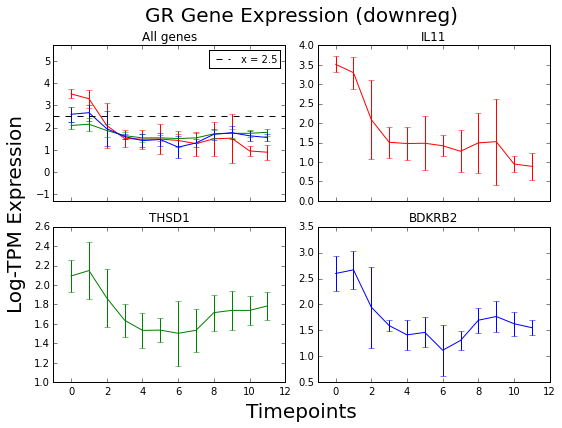

Gene to color is:  {'MN1': 'r', 'TRAPPC2B': 'g', 'BFSP1': 'b'}
Y min is :  1.32988021264
Y max is :  2.28167790139
Y avg is :  1.71994025431
Y std is :  0.259801360111
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-BFSP1-MN1-TRAPPC2B


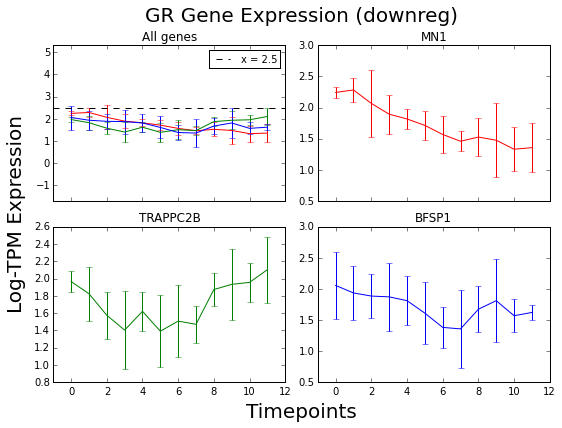

Gene to color is:  {'TSHZ3': 'b', 'PEAR1': 'g', 'HOXA1': 'r'}
Y min is :  1.37487868857
Y max is :  2.00288402934
Y avg is :  1.68379665757
Y std is :  0.166009682629
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-HOXA1-PEAR1-TSHZ3


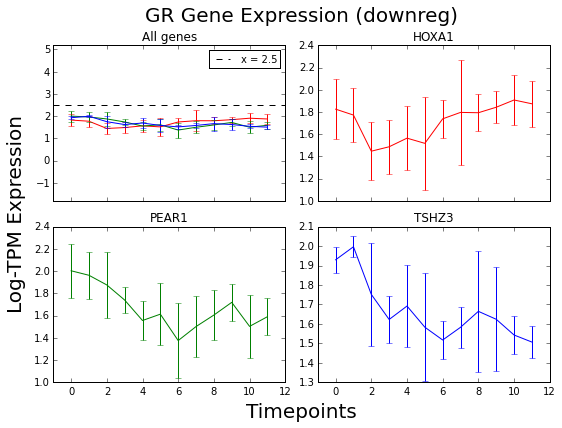

Gene to color is:  {'LHX8': 'g', 'GDF15': 'r', 'TMEM45A': 'b'}
Y min is :  1.11582735087
Y max is :  3.07514185137
Y avg is :  1.61268504967
Y std is :  0.39370250728
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-GDF15-LHX8-TMEM45A


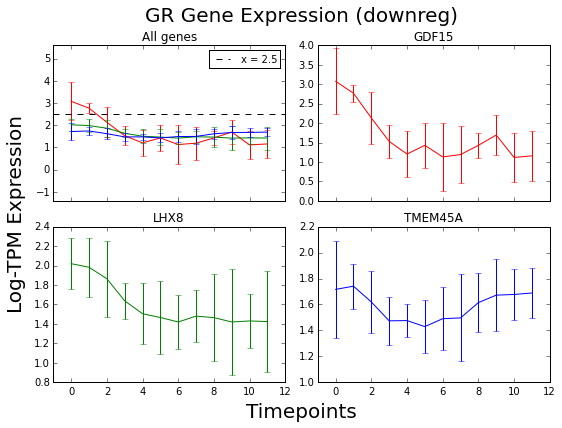

Gene to color is:  {'CNNM2': 'g', 'P2RY6': 'r', 'RGS3': 'b'}
Y min is :  1.14201233224
Y max is :  2.12659418574
Y avg is :  1.5715057876
Y std is :  0.217070567745
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-CNNM2-P2RY6-RGS3


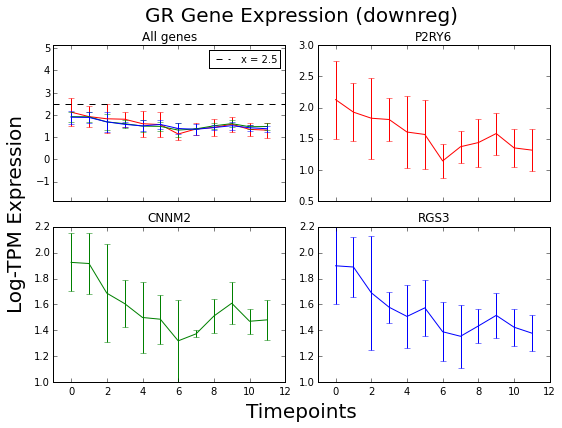

Gene to color is:  {'OSGIN1': 'b', 'CSF2RA': 'r', 'CYP26A1': 'g'}
Y min is :  1.10594601473
Y max is :  2.2076029077
Y avg is :  1.52750099977
Y std is :  0.275146079456
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-CSF2RA-CYP26A1-OSGIN1


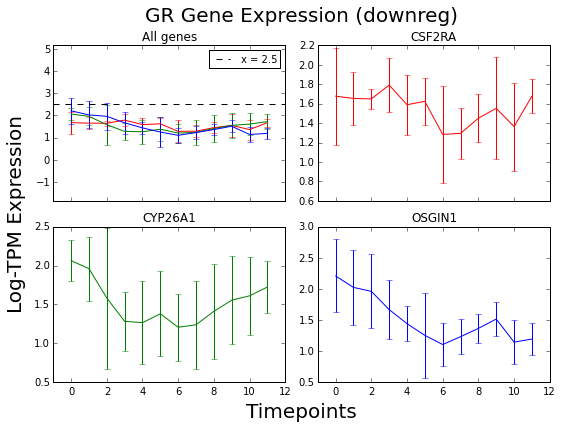

Gene to color is:  {'BEND6': 'g', 'LRRC6': 'r', 'NAV3': 'b'}
Y min is :  0.887289928826
Y max is :  2.20662395694
Y avg is :  1.46186118994
Y std is :  0.279701101214
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-BEND6-LRRC6-NAV3


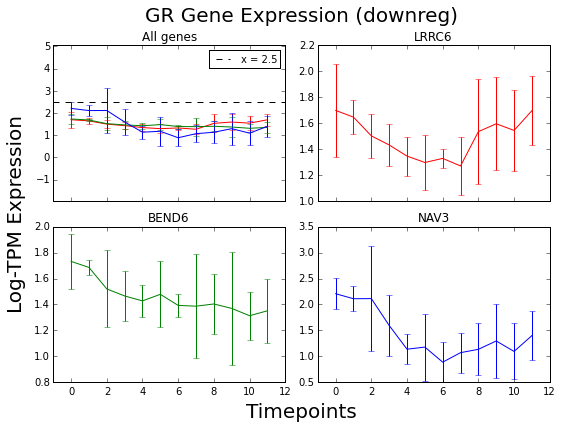

Gene to color is:  {'ARHGAP44': 'r', 'BBS5': 'b', 'HDX': 'g'}
Y min is :  1.20303962948
Y max is :  1.63908689296
Y avg is :  1.41730362369
Y std is :  0.114815213972
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-ARHGAP44-BBS5-HDX


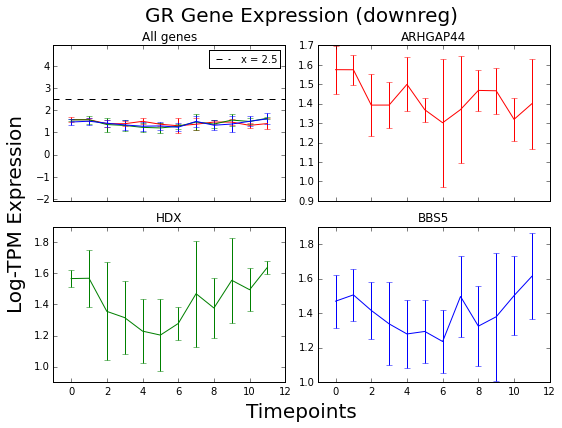

Gene to color is:  {'SKIDA1': 'g', 'RASSF10': 'r', 'FGFBP1': 'b'}
Y min is :  0.849802548009
Y max is :  2.87061069319
Y avg is :  1.36144560862
Y std is :  0.445177278601
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-FGFBP1-RASSF10-SKIDA1


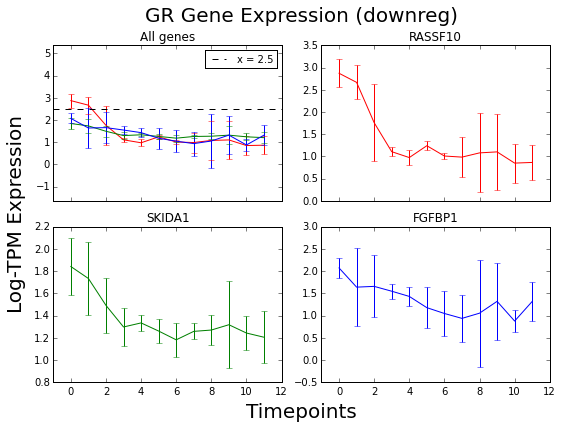

Gene to color is:  {'HS3ST6': 'b', 'KIAA1217': 'r', 'ZNF850': 'g'}
Y min is :  0.796809967777
Y max is :  1.98572527744
Y avg is :  1.32188164857
Y std is :  0.266279234235
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-HS3ST6-KIAA1217-ZNF850


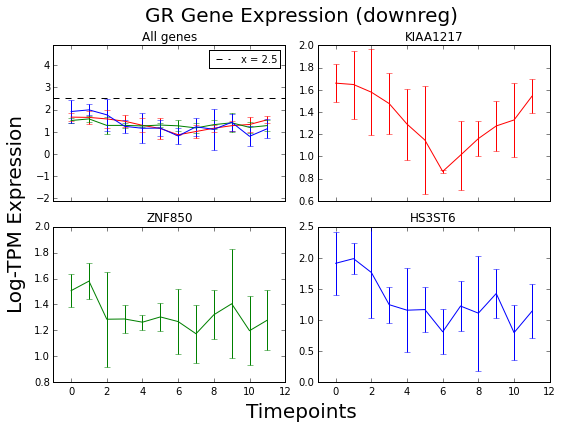

Gene to color is:  {'NR4A2': 'b', 'CNRIP1': 'g', 'FCHO1': 'r'}
Y min is :  0.905453278513
Y max is :  2.16827117669
Y avg is :  1.25094972891
Y std is :  0.276752829806
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-CNRIP1-FCHO1-NR4A2


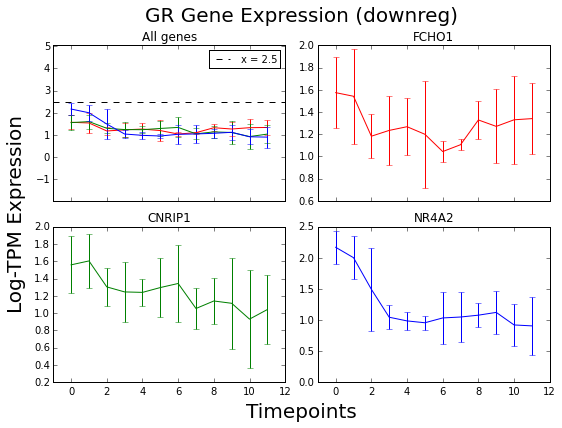

Gene to color is:  {'CXCL8': 'r', 'ZNF404': 'g', 'KLB': 'b'}
Y min is :  0.513163866507
Y max is :  2.0612144978
Y avg is :  1.17007405602
Y std is :  0.333648705876
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-CXCL8-KLB-ZNF404


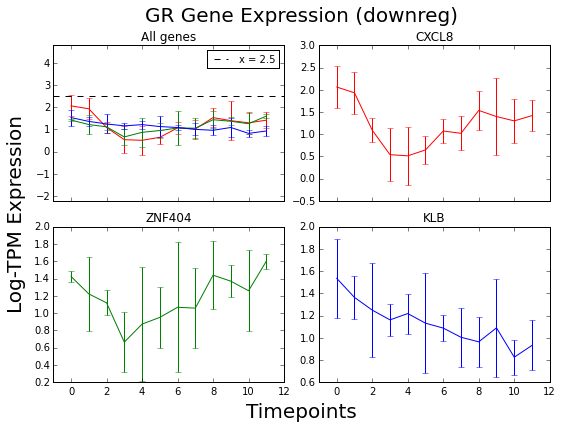

Gene to color is:  {'MOK': 'g', 'NR4A3': 'b', 'ZNF846': 'r'}
Y min is :  0.664639567048
Y max is :  1.79789443693
Y avg is :  1.11149697177
Y std is :  0.219472593874
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-MOK-NR4A3-ZNF846


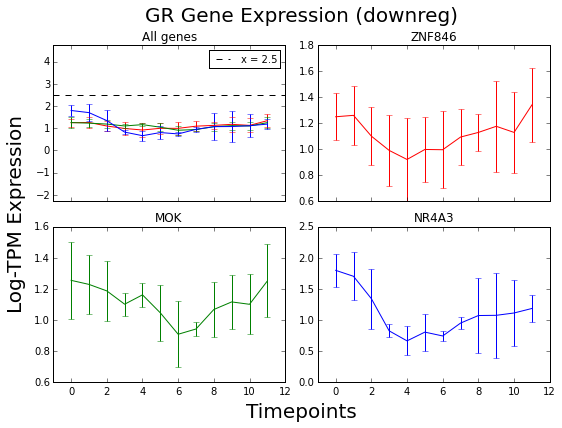

Gene to color is:  {'ANK1': 'g', 'TNFSF15': 'b', 'OLR1': 'r'}
Y min is :  0.388257769357
Y max is :  2.60453403089
Y avg is :  1.08444228242
Y std is :  0.472092216909
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-ANK1-OLR1-TNFSF15


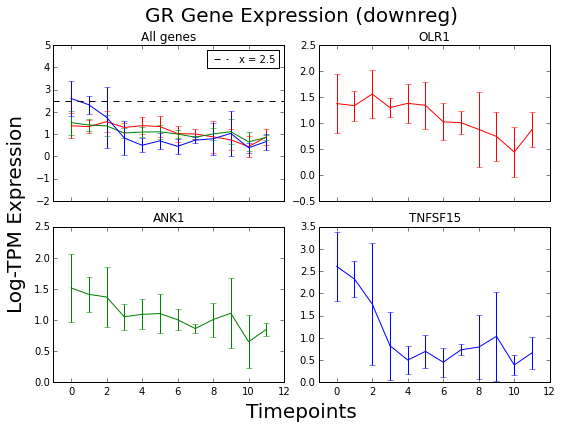

Gene to color is:  {'ZSWIM4': 'b', 'MYO5B': 'r', 'PRSS35': 'g'}
Y min is :  0.49444748032
Y max is :  1.97827959462
Y avg is :  1.03898857438
Y std is :  0.342678767661
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-1-0-MYO5B-PRSS35-ZSWIM4


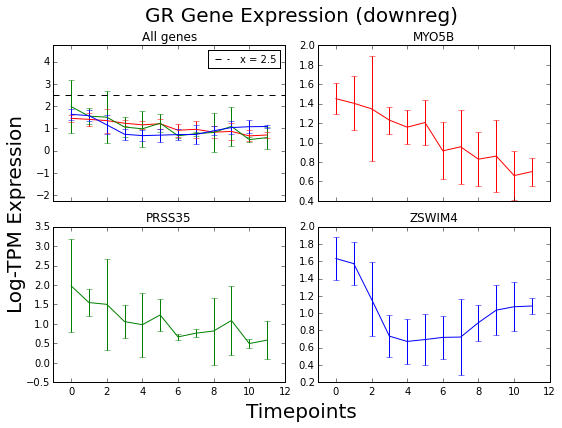

Gene to color is:  {'WDR78': 'r', 'TMOD1': 'g', 'KCNK3': 'b'}
Y min is :  0.470162026062
Y max is :  1.57154230513
Y avg is :  0.920105046045
Y std is :  0.259523386175
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-KCNK3-TMOD1-WDR78


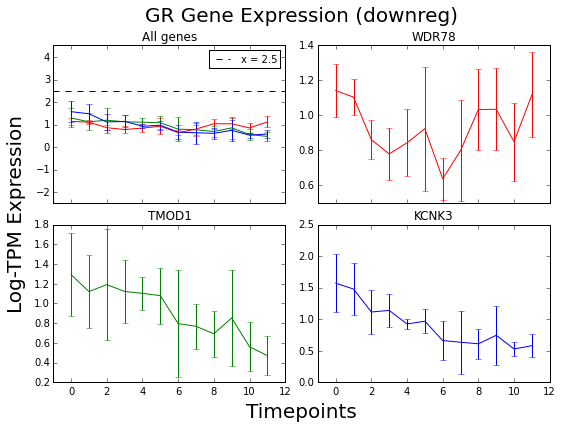

Gene to color is:  {'LHX1': 'b', 'NEK10': 'g', 'TMCC2': 'r'}
Y min is :  0.550208676742
Y max is :  1.40289224411
Y avg is :  0.852951372572
Y std is :  0.232708118989
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-LHX1-NEK10-TMCC2


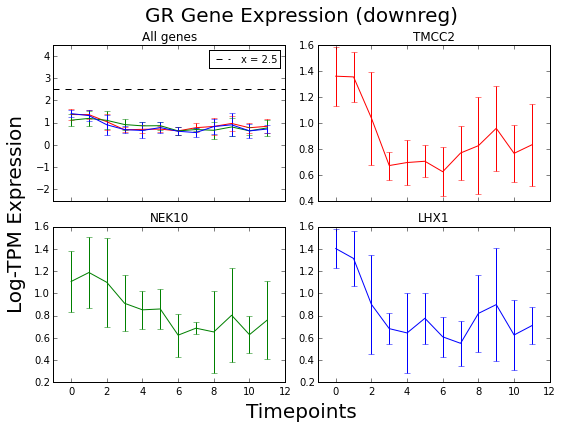

Gene to color is:  {'CD274': 'b', 'FLRT2': 'r', 'IFIT2': 'g'}
Y min is :  0.459212252257
Y max is :  1.33806669829
Y avg is :  0.799229546726
Y std is :  0.248066975963
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-CD274-FLRT2-IFIT2


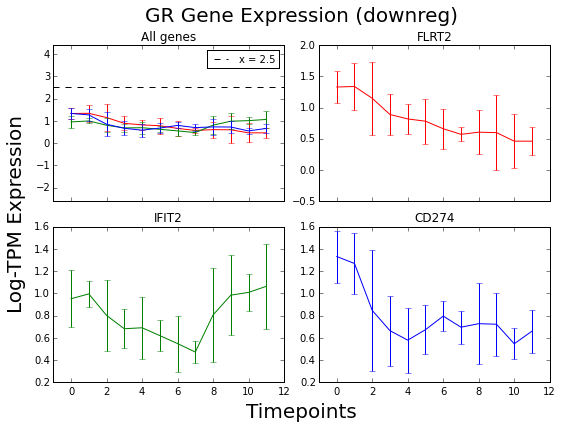

Gene to color is:  {'CA2': 'r', 'MYH15': 'g', 'EN1': 'b'}
Y min is :  0.401517068351
Y max is :  1.23214123862
Y avg is :  0.766858060563
Y std is :  0.212933733707
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-CA2-EN1-MYH15


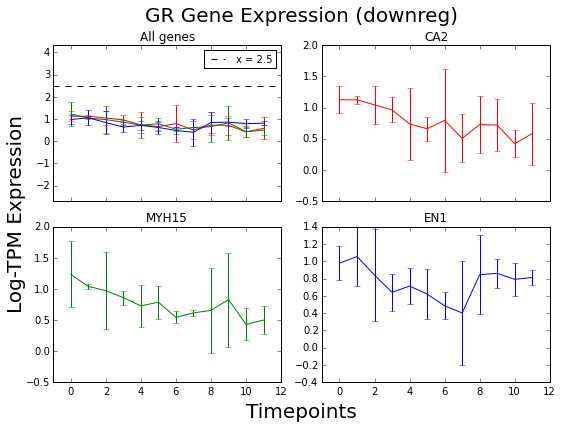

Gene to color is:  {'TBX19': 'r', 'FANK1': 'b', 'LETM2': 'g'}
Y min is :  0.45613730455
Y max is :  1.04870007364
Y avg is :  0.729388837263
Y std is :  0.133041114644
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-FANK1-LETM2-TBX19


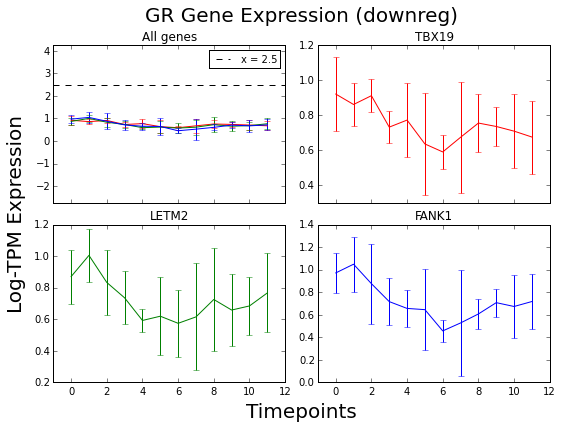

Gene to color is:  {'FRMD4A': 'r', 'HOXB2': 'g', 'IGFBP5': 'b'}
Y min is :  0.232421419612
Y max is :  1.09919504139
Y avg is :  0.687697912088
Y std is :  0.186128766047
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-FRMD4A-HOXB2-IGFBP5


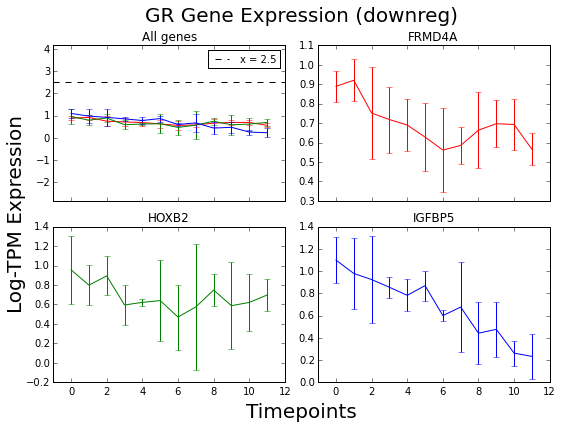

Gene to color is:  {'SOX2': 'r', 'SERTAD4': 'g', 'ARID5A': 'b'}
Y min is :  0.401003864611
Y max is :  1.45614126937
Y avg is :  0.670179737876
Y std is :  0.261076444883
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-ARID5A-SERTAD4-SOX2


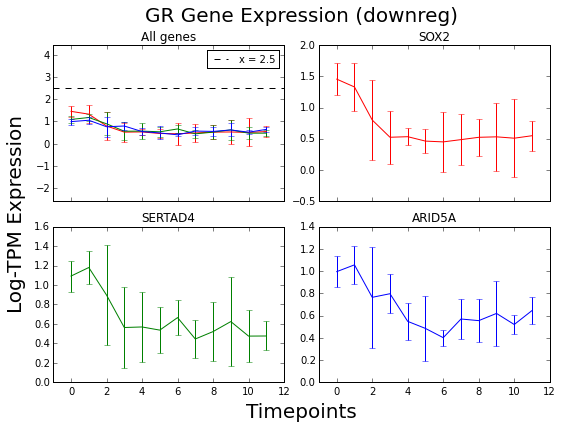

Gene to color is:  {'RGS14': 'g', 'CAMK2A': 'r', 'RERG': 'b'}
Y min is :  0.304510484636
Y max is :  0.935459490701
Y avg is :  0.605696096821
Y std is :  0.145055058151
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-CAMK2A-RERG-RGS14


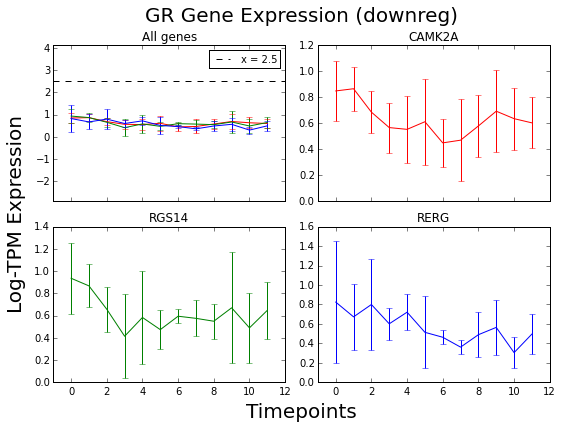

Gene to color is:  {'PADI1': 'b', 'RASGRP3': 'r', 'FOXA3': 'g'}
Y min is :  0.105721434348
Y max is :  1.00764194862
Y avg is :  0.526619956019
Y std is :  0.23692592658
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-FOXA3-PADI1-RASGRP3


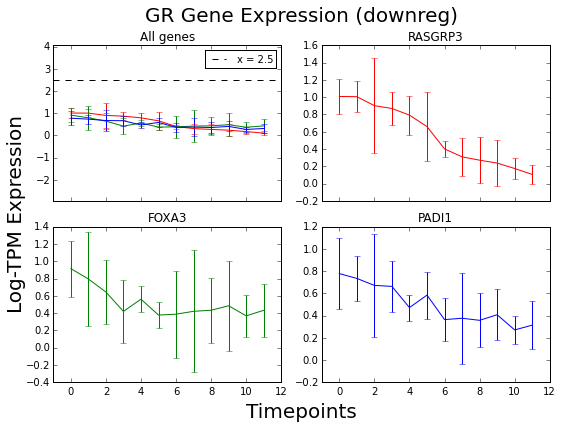

Gene to color is:  {'SLC6A12': 'r', 'TNFRSF9': 'b', 'AIM1L': 'g'}
Y min is :  0.243213136396
Y max is :  0.809785886682
Y avg is :  0.484415287827
Y std is :  0.136968952486
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-AIM1L-SLC6A12-TNFRSF9


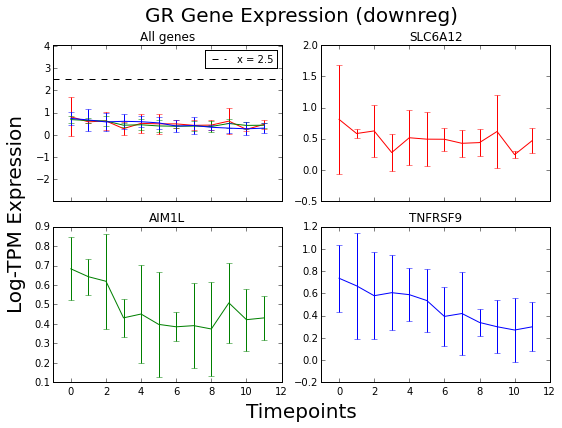

Gene to color is:  {'BDKRB1': 'r', 'PDCD1LG2': 'g', 'CYP39A1': 'b'}
Y min is :  0.173798082639
Y max is :  0.987264131417
Y avg is :  0.46170472771
Y std is :  0.196779405283
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-BDKRB1-CYP39A1-PDCD1LG2


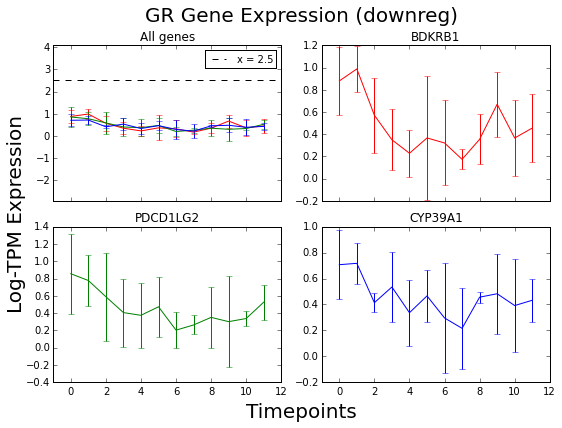

Gene to color is:  {'ACTC1': 'b', 'DACT1': 'g', 'ANKRD31': 'r'}
Y min is :  0.209037327969
Y max is :  0.685676239225
Y avg is :  0.421320661781
Y std is :  0.127722653425
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-ACTC1-ANKRD31-DACT1


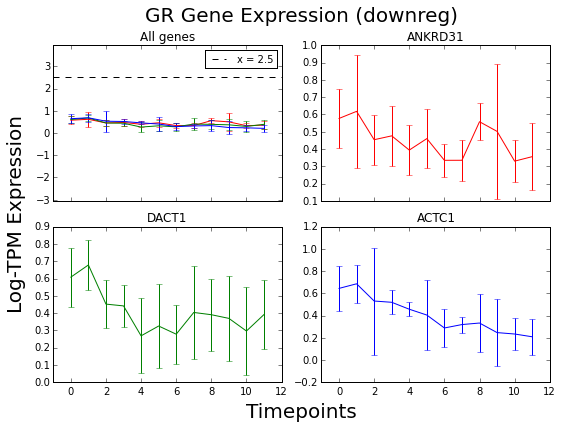

Gene to color is:  {'SLAMF7': 'r', 'BMP2': 'g', 'TRPV3': 'b'}
Y min is :  0.195617766238
Y max is :  0.774986740459
Y avg is :  0.371160275711
Y std is :  0.14209834207
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-BMP2-SLAMF7-TRPV3


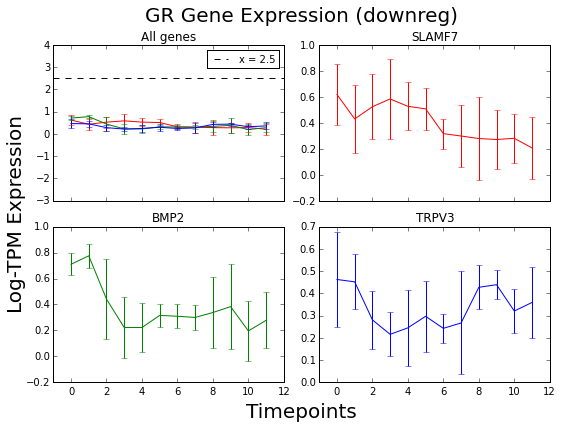

Gene to color is:  {'PLA2G4C': 'r', 'EFCAB5': 'g', 'DUSP8': 'b'}
Y min is :  0.139219726899
Y max is :  0.611650751651
Y avg is :  0.304986217084
Y std is :  0.106166565488
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-DUSP8-EFCAB5-PLA2G4C


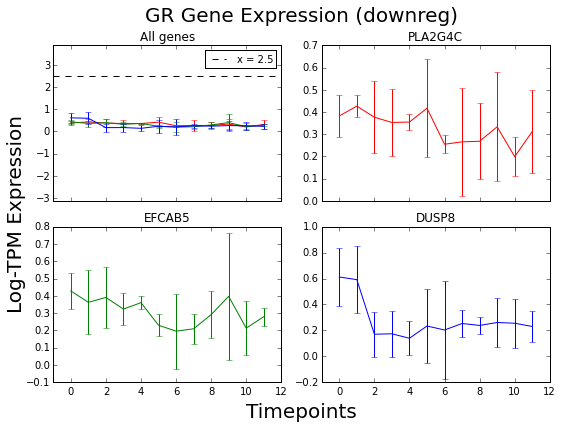

Gene to color is:  {'CLVS1': 'b', 'HTR1F': 'r', 'PTAFR': 'g'}
Y min is :  -0.0222700479509
Y max is :  0.519006143155
Y avg is :  0.24919290851
Y std is :  0.141627736752
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-CLVS1-HTR1F-PTAFR


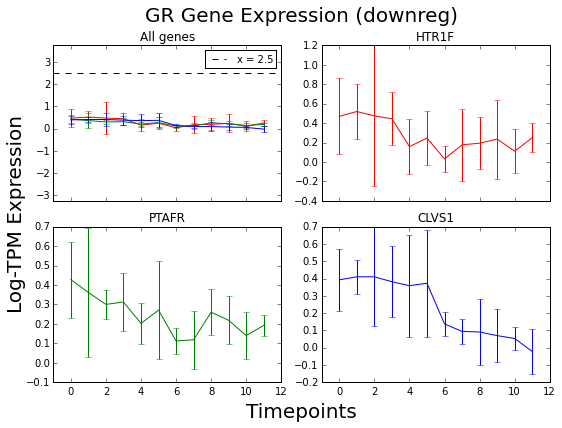

Gene to color is:  {'PAX6': 'g', 'SAMD12': 'r', 'KCTD16': 'b'}
Y min is :  0.0664068769521
Y max is :  0.370024986592
Y avg is :  0.208823614974
Y std is :  0.0830858489164
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-KCTD16-PAX6-SAMD12


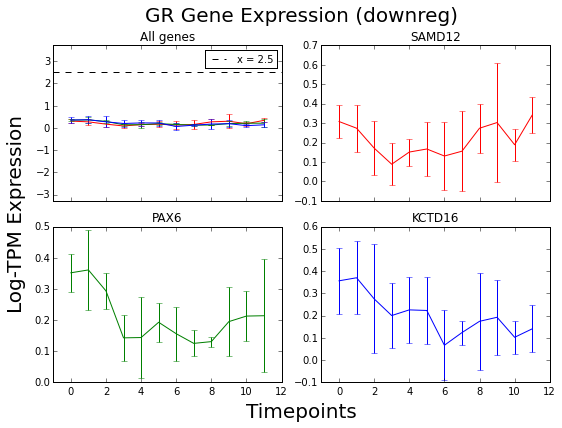

Gene to color is:  {'IL6': 'b', 'NOTUM': 'g', 'AZIN2': 'r'}
Y min is :  0.0102599380035
Y max is :  0.478955781086
Y avg is :  0.182588265903
Y std is :  0.111634325298
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-AZIN2-IL6-NOTUM


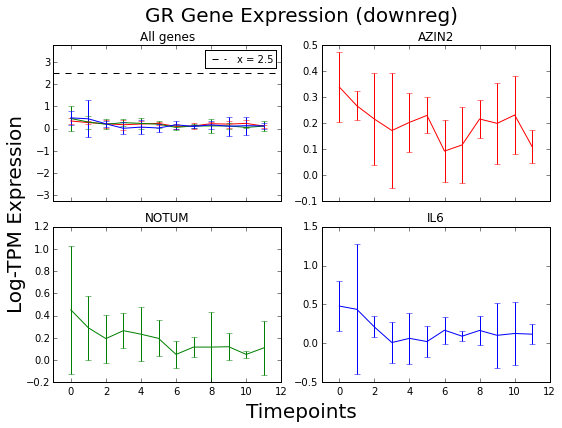

Gene to color is:  {'OTUD7A': 'b', 'DNAH6': 'r', 'DLX3': 'g'}
Y min is :  0.0386374489071
Y max is :  0.346625226992
Y avg is :  0.132423066492
Y std is :  0.0624282721844
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-DLX3-DNAH6-OTUD7A


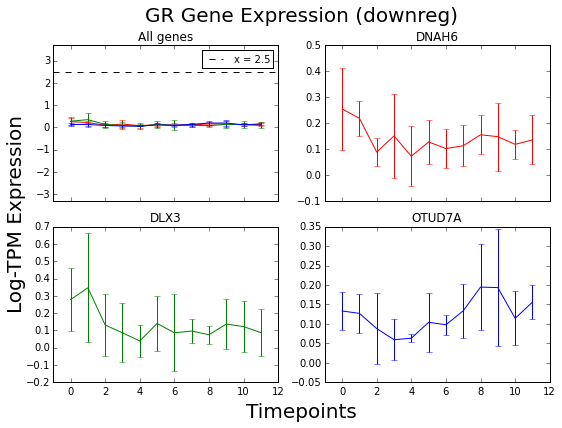

Gene to color is:  {'NEURL3': 'r'}
Y min is :  0.00228955552614
Y max is :  0.406817945895
Y avg is :  0.115975654554
Y std is :  0.131912056123
Figure saved to  plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression-0-0-NEURL3


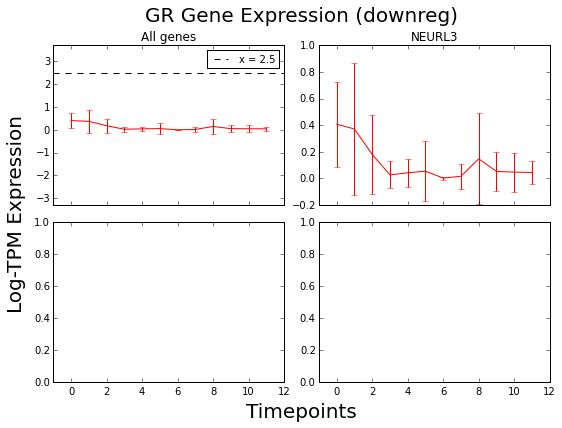

In [140]:
reload(gtm)

plot_genes_list = sorted(data_downreg_mid_genes, key = lambda gene: data[data["gene"] == gene]["avg"].values[0],
                        reverse=True)
file_prefix="plots/GR-downreg-mid-Expression/GR-downreg-mid-Expression"
title = "GR Gene Expression (downreg)"

!mkdir plots/GR-downreg-mid-Expression

horizontal_line_color_labels = [(2.5, 'k', "x = 2.5")]
print len(plot_genes_list)

gtm.plot_multi_genes_grid(data, plot_genes_list, title, file_prefix=file_prefix, horizontal_line_color_labels=horizontal_line_color_labels)

# Plot GR genes with immune genes

In [6]:
print er_bg_df.shape

(16929, 54)


In [7]:
er_bg_df.columns

Index([u'#BioGRID Interaction ID', u'Entrez Gene Interactor A',
       u'Entrez Gene Interactor B', u'BioGRID ID Interactor A',
       u'BioGRID ID Interactor B', u'Systematic Name Interactor A',
       u'Systematic Name Interactor B', u'Official Symbol Interactor A',
       u'Official Symbol Interactor B', u'Synonyms Interactor A',
       u'Synonyms Interactor B', u'Experimental System',
       u'Experimental System Type', u'Author', u'Pubmed ID',
       u'Organism Interactor A', u'Organism Interactor B', u'Throughput',
       u'Score', u'Modification', u'Phenotypes', u'Qualifications', u'Tags',
       u'Source Database', u'Pair', u'Immune_GOC-Priority_A',
       u'Immune_GOC-Priority_B', u'Immune_GOC-Priority', u'Immune_GSEA_A',
       u'Immune_GSEA_B', u'Immune_GSEA', u'Metabolism_GSEA_A',
       u'Metabolism_GSEA_B', u'Metabolism_GSEA', u'Diabetes_lowconf_A',
       u'Diabetes_lowconf_B', u'Diabetes_lowconf', u'Diabetes_highconf_A',
       u'Diabetes_highconf_B', u'Diabetes_highcon

In [8]:
er_bg_df["GR_A"] = np.logical_or(er_bg_df["GR_GO_A"], er_bg_df["GR_direct-candidate_A"])
print len(np.where(er_bg_df["GR_A"])[0])

591


In [15]:
indices = np.logical_and(er_bg_df["GR_A"] != 0, er_bg_df["Immune_GOC-Priority_A"])
imm_pairs = zip(er_bg_df[indices]["Official Symbol Interactor A"].values,
                er_bg_df[indices]["Official Symbol Interactor B"].values)
print imm_pairs[0:5]
print "Num imm_pairs: ", len(imm_pairs)

[('NR3C1', 'RAD9A'), ('CEBPB', 'MED23'), ('TGFBR1', 'SMURF1'), ('NR3C1', 'JUN'), ('NR3C1', 'STAT3')]
Num imm_pairs:  150


mkdir: plots/GR-Immune-Interaction: File exists
150
 pair to color is:  {('NFKBIA', 'BARD1'): 'g', ('NFKBIA', 'PIR'): 'r', ('NFKBIA', 'DYNLL1'): 'b'}
[('NFKBIA', 'PIR'), ('NFKBIA', 'BARD1'), ('NFKBIA', 'DYNLL1')]
set(['PIR', 'NFKBIA', 'DYNLL1', 'BARD1'])
Y min is :  3.03503789755
Y max is :  6.20634149571
Y avg is :  4.84832889257
Y std is :  1.09203989618
NFKBIA PIR
NFKBIA BARD1
NFKBIA DYNLL1
NFKBIA PIR
NFKBIA BARD1
NFKBIA DYNLL1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-1-BARD1-DYNLL1-NFKBIA-PIR


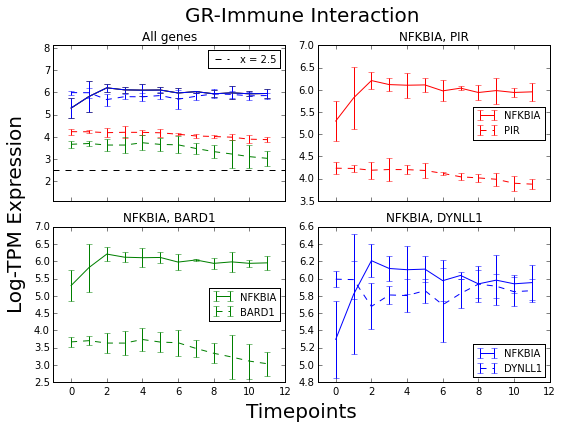

 pair to color is:  {('NFKBIA', 'RELB'): 'g', ('NFKBIA', 'MAP3K14'): 'r', ('NFKBIA', 'CUL1'): 'b'}
[('NFKBIA', 'MAP3K14'), ('NFKBIA', 'RELB'), ('NFKBIA', 'CUL1')]
set(['RELB', 'NFKBIA', 'MAP3K14', 'CUL1'])
Y min is :  1.33451844125
Y max is :  6.20634149571
Y avg is :  3.87062969888
Y std is :  1.71588499928
NFKBIA MAP3K14
NFKBIA RELB
NFKBIA CUL1
NFKBIA MAP3K14
NFKBIA RELB
NFKBIA CUL1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-1-CUL1-MAP3K14-NFKBIA-RELB


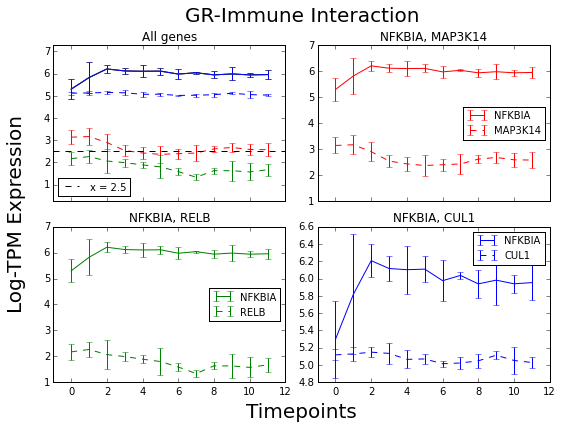

 pair to color is:  {('NFKBIA', 'SPDL1'): 'b', ('NFKBIA', 'ATF4'): 'g', ('NFKBIA', 'MALT1'): 'r'}
[('NFKBIA', 'MALT1'), ('NFKBIA', 'ATF4'), ('NFKBIA', 'SPDL1')]
set(['ATF4', 'NFKBIA', 'MALT1', 'SPDL1'])
Y min is :  3.25014917006
Y max is :  6.20634149571
Y avg is :  4.65662152552
Y std is :  0.904675932812
NFKBIA MALT1
NFKBIA ATF4
NFKBIA SPDL1
NFKBIA MALT1
NFKBIA ATF4
NFKBIA SPDL1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-0-ATF4-MALT1-NFKBIA-SPDL1


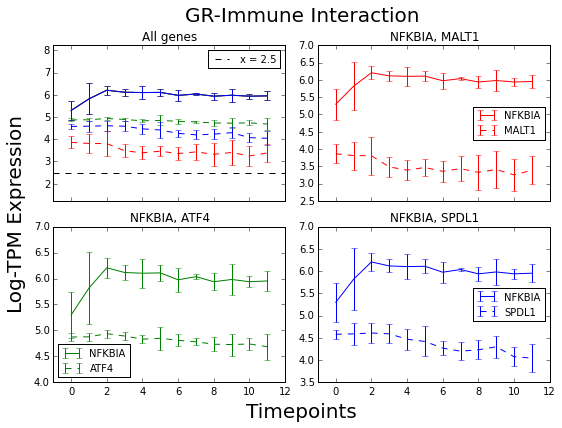

 pair to color is:  {('NFKBIA', 'NFKB2'): 'r', ('NFKBIA', 'SRC'): 'g', ('NFKBIA', 'PRTFDC1'): 'b'}
[('NFKBIA', 'NFKB2'), ('NFKBIA', 'SRC'), ('NFKBIA', 'PRTFDC1')]
set(['SRC', 'NFKB2', 'NFKBIA', 'PRTFDC1'])
Y min is :  2.42838077958
Y max is :  6.20634149571
Y avg is :  4.25175099375
Y std is :  1.13527209311
NFKBIA NFKB2
NFKBIA SRC
NFKBIA PRTFDC1
NFKBIA NFKB2
NFKBIA SRC
NFKBIA PRTFDC1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-1-NFKB2-NFKBIA-PRTFDC1-SRC


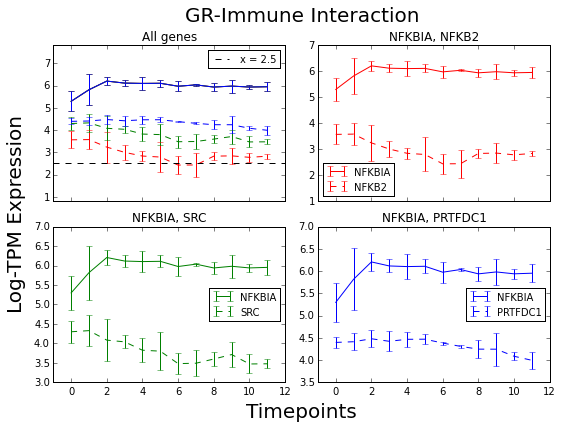

 pair to color is:  {('CEBPB', 'MED23'): 'b', ('NFKBIA', 'NFKBIE'): 'g', ('NFKBIA', 'CENPF'): 'r'}
[('NFKBIA', 'CENPF'), ('NFKBIA', 'NFKBIE'), ('CEBPB', 'MED23')]
set(['CENPF', 'MED23', 'NFKBIA', 'CEBPB', 'NFKBIE'])
Y min is :  1.82203794989
Y max is :  6.20634149571
Y avg is :  4.43169014183
Y std is :  1.48513694452
NFKBIA CENPF
NFKBIA NFKBIE
CEBPB MED23
NFKBIA CENPF
NFKBIA NFKBIE
CEBPB MED23
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-1-CEBPB-CENPF-MED23-NFKBIA-NFKBIE


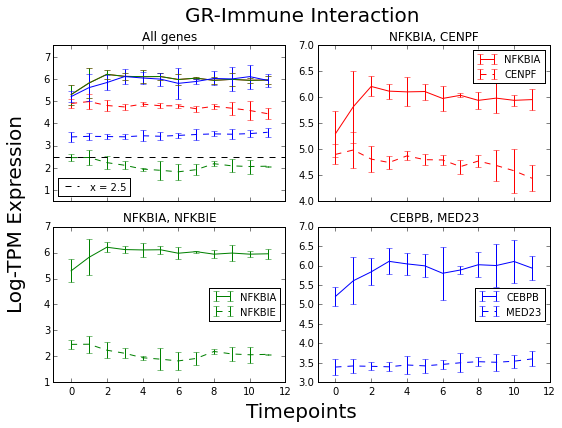

 pair to color is:  {('CEBPB', 'SMARCA2'): 'r', ('CEBPB', 'NR3C1'): 'g', ('CEBPB', 'RARB'): 'b'}
[('CEBPB', 'SMARCA2'), ('CEBPB', 'NR3C1'), ('CEBPB', 'RARB')]
set(['CEBPB', 'SMARCA2', 'RARB', 'NR3C1'])
Y min is :  3.40100092661
Y max is :  6.10760199116
Y avg is :  4.80046725858
Y std is :  0.889290219416
CEBPB SMARCA2
CEBPB NR3C1
CEBPB RARB
CEBPB SMARCA2
CEBPB NR3C1
CEBPB RARB
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-0-CEBPB-NR3C1-RARB-SMARCA2


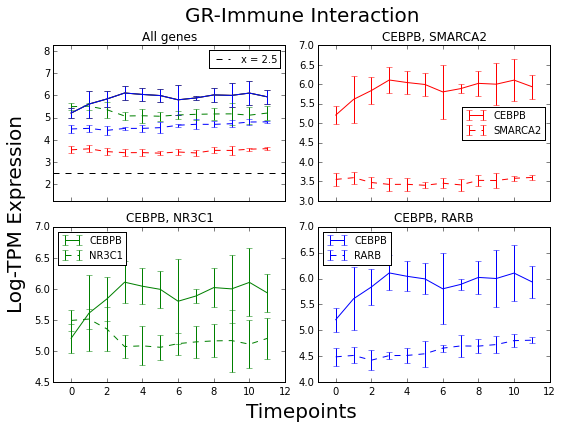

 pair to color is:  {('CEBPB', 'NOLC1'): 'r', ('CEBPB', 'CEBPG'): 'g', ('CEBPB', 'CEBPD'): 'b'}
[('CEBPB', 'NOLC1'), ('CEBPB', 'CEBPG'), ('CEBPB', 'CEBPD')]
set(['CEBPB', 'NOLC1', 'CEBPG', 'CEBPD'])
Y min is :  2.97189272824
Y max is :  6.10760199116
Y avg is :  4.79593361044
Y std is :  0.786306103436
CEBPB NOLC1
CEBPB CEBPG
CEBPB CEBPD
CEBPB NOLC1
CEBPB CEBPG
CEBPB CEBPD
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-0-CEBPB-CEBPD-CEBPG-NOLC1


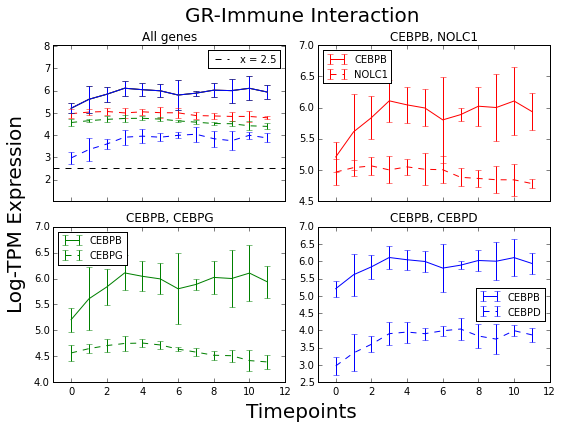

 pair to color is:  {('CEBPB', 'RUNX1'): 'r', ('CEBPB', 'CEBPB'): 'g', ('CEBPB', 'STAT3'): 'b'}
[('CEBPB', 'RUNX1'), ('CEBPB', 'CEBPB'), ('CEBPB', 'STAT3')]
set(['CEBPB', 'RUNX1', 'STAT3'])
Y min is :  1.97545592256
Y max is :  6.10760199116
Y avg is :  4.32059819837
Y std is :  1.55022469759
CEBPB RUNX1
CEBPB CEBPB
CEBPB STAT3
CEBPB RUNX1
CEBPB CEBPB
CEBPB STAT3
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-1-CEBPB-RUNX1-STAT3


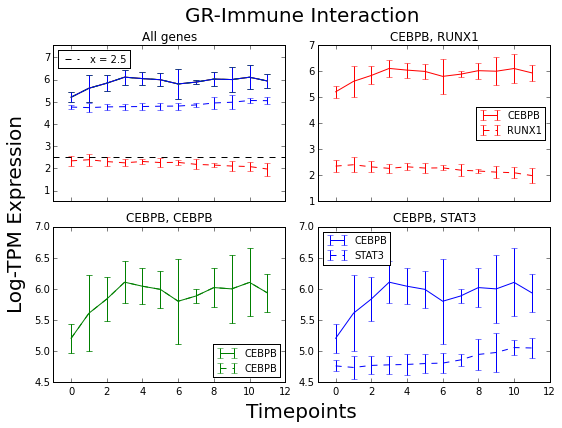

 pair to color is:  {('CEBPB', 'CASP8'): 'g', ('CEBPB', 'ATF3'): 'r', ('TGFBR1', 'SMURF1'): 'b'}
[('CEBPB', 'ATF3'), ('CEBPB', 'CASP8'), ('TGFBR1', 'SMURF1')]
set(['SMURF1', 'CEBPB', 'TGFBR1', 'CASP8', 'ATF3'])
Y min is :  0.682990191123
Y max is :  6.30637557262
Y avg is :  3.91261602846
Y std is :  1.80024631905
CEBPB ATF3
CEBPB CASP8
TGFBR1 SMURF1
CEBPB ATF3
CEBPB CASP8
TGFBR1 SMURF1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-1-ATF3-CASP8-CEBPB-SMURF1-TGFBR1


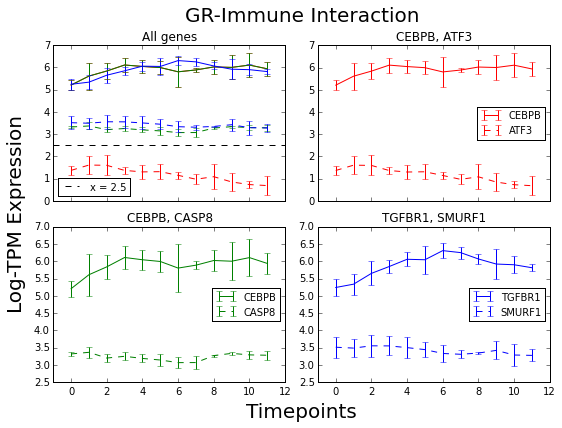

 pair to color is:  {('TGFBR1', 'CAV1'): 'g', ('TGFBR1', 'PIK3R1'): 'r', ('TGFBR1', 'SMAD2'): 'b'}
[('TGFBR1', 'PIK3R1'), ('TGFBR1', 'CAV1'), ('TGFBR1', 'SMAD2')]
set(['TGFBR1', 'SMAD2', 'PIK3R1', 'CAV1'])
Y min is :  2.55316892632
Y max is :  7.404655362
Y avg is :  4.78260149401
Y std is :  1.8093584136
TGFBR1 PIK3R1
TGFBR1 CAV1
TGFBR1 SMAD2
TGFBR1 PIK3R1
TGFBR1 CAV1
TGFBR1 SMAD2
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-1-CAV1-PIK3R1-SMAD2-TGFBR1


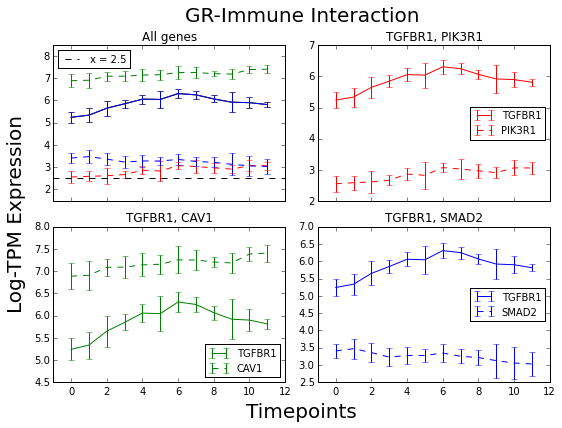

 pair to color is:  {('TGFBR1', 'MAPK14'): 'r', ('TGFBR1', 'HMMR'): 'b', ('TGFBR1', 'TSC22D1'): 'g'}
[('TGFBR1', 'MAPK14'), ('TGFBR1', 'TSC22D1'), ('TGFBR1', 'HMMR')]
set(['MAPK14', 'TSC22D1', 'TGFBR1', 'HMMR'])
Y min is :  3.95668763966
Y max is :  6.30637557262
Y avg is :  4.66549817968
Y std is :  0.730789441164
TGFBR1 MAPK14
TGFBR1 TSC22D1
TGFBR1 HMMR
TGFBR1 MAPK14
TGFBR1 TSC22D1
TGFBR1 HMMR
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-0-HMMR-MAPK14-TGFBR1-TSC22D1


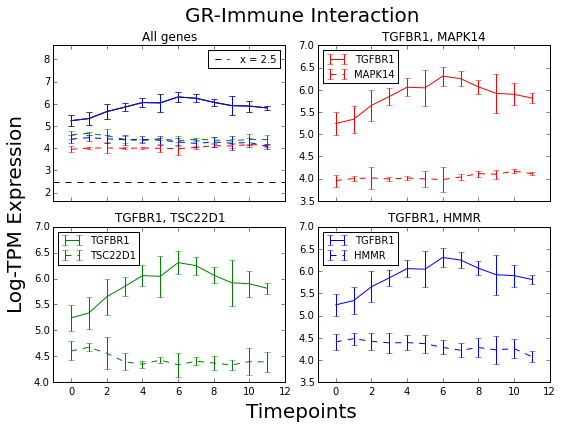

 pair to color is:  {('TGFBR1', 'ANK1'): 'b', ('TGFBR1', 'TAB2'): 'g', ('TGFBR1', 'BAMBI'): 'r'}
[('TGFBR1', 'BAMBI'), ('TGFBR1', 'TAB2'), ('TGFBR1', 'ANK1')]
set(['TAB2', 'TGFBR1', 'BAMBI', 'ANK1'])
Y min is :  0.651431217591
Y max is :  6.30637557262
Y avg is :  3.82860165413
Y std is :  1.75024866234
TGFBR1 BAMBI
TGFBR1 TAB2
TGFBR1 ANK1
TGFBR1 BAMBI
TGFBR1 TAB2
TGFBR1 ANK1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-1-ANK1-BAMBI-TAB2-TGFBR1


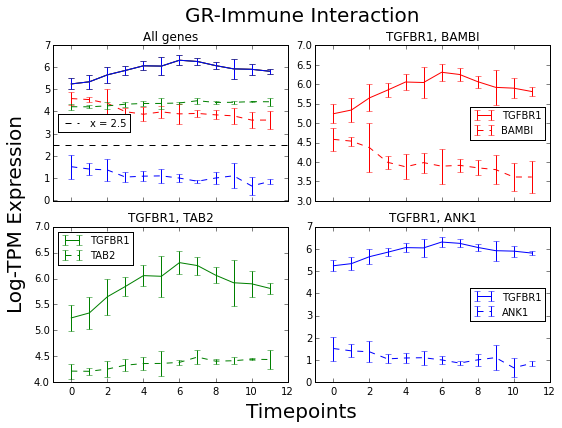

 pair to color is:  {('TGFBR1', 'NOTCH1'): 'g', ('TGFBR1', 'TPM1'): 'r', ('TGFBR1', 'SH3KBP1'): 'b'}
[('TGFBR1', 'TPM1'), ('TGFBR1', 'NOTCH1'), ('TGFBR1', 'SH3KBP1')]
set(['TGFBR1', 'NOTCH1', 'TPM1', 'SH3KBP1'])
Y min is :  1.60242814984
Y max is :  6.30637557262
Y avg is :  4.49856955318
Y std is :  1.64716458484
TGFBR1 TPM1
TGFBR1 NOTCH1
TGFBR1 SH3KBP1
TGFBR1 TPM1
TGFBR1 NOTCH1
TGFBR1 SH3KBP1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-1-NOTCH1-SH3KBP1-TGFBR1-TPM1


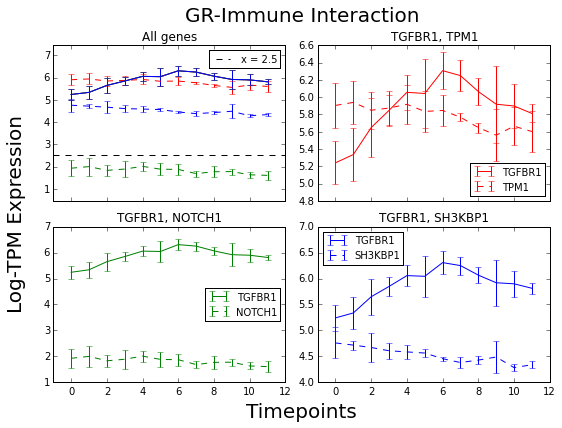

 pair to color is:  {('NR3C1', 'STAT3'): 'b', ('NR3C1', 'JUN'): 'g', ('NR3C1', 'RAD9A'): 'r'}
[('NR3C1', 'RAD9A'), ('NR3C1', 'JUN'), ('NR3C1', 'STAT3')]
set(['STAT3', 'NR3C1', 'JUN', 'RAD9A'])
Y min is :  2.54606178421
Y max is :  5.51473398403
Y avg is :  4.01048497344
Y std is :  1.06210615427
NR3C1 RAD9A
NR3C1 JUN
NR3C1 STAT3
NR3C1 RAD9A
NR3C1 JUN
NR3C1 STAT3
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-1-JUN-NR3C1-RAD9A-STAT3


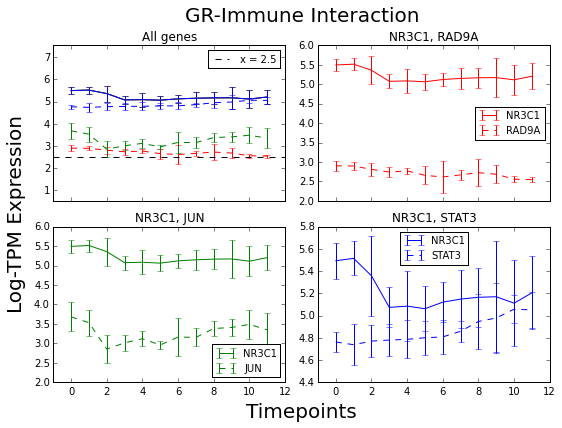

 pair to color is:  {('NR3C1', 'TSG101'): 'r', ('NR3C1', 'TXN'): 'g', ('NR3C1', 'ETS2'): 'b'}
[('NR3C1', 'TSG101'), ('NR3C1', 'TXN'), ('NR3C1', 'ETS2')]
set(['TSG101', 'TXN', 'NR3C1', 'ETS2'])
Y min is :  4.15021828637
Y max is :  6.97745694838
Y avg is :  5.2170455658
Y std is :  1.00087163989
NR3C1 TSG101
NR3C1 TXN
NR3C1 ETS2
NR3C1 TSG101
NR3C1 TXN
NR3C1 ETS2
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-5-1-ETS2-NR3C1-TSG101-TXN


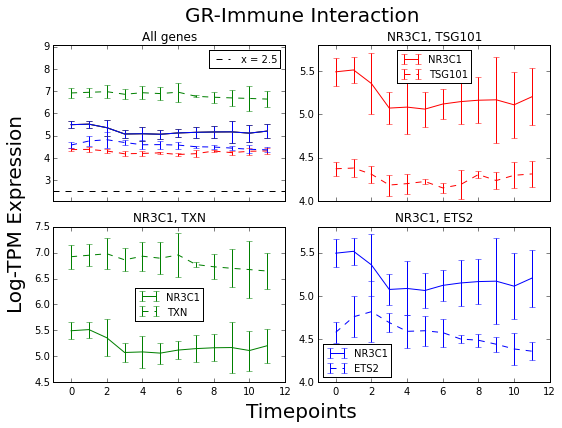

 pair to color is:  {('NR3C1', 'NFKB2'): 'b', ('NR3C1', 'NCL'): 'r', ('NR3C1', 'NR3C1'): 'g'}
[('NR3C1', 'NCL'), ('NR3C1', 'NR3C1'), ('NR3C1', 'NFKB2')]
set(['NR3C1', 'NCL', 'NFKB2'])
Y min is :  2.42838077958
Y max is :  6.42454446807
Y avg is :  4.80806488643
Y std is :  1.41915677274
NR3C1 NCL
NR3C1 NR3C1
NR3C1 NFKB2
NR3C1 NCL
NR3C1 NR3C1
NR3C1 NFKB2
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-1-NCL-NFKB2-NR3C1


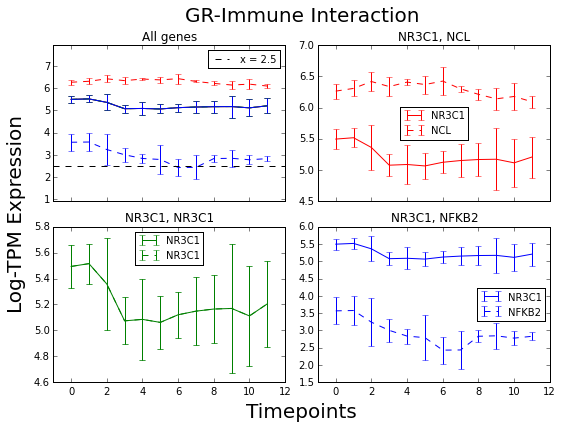

 pair to color is:  {('NR3C1', 'NCOR2'): 'g', ('NR3C1', 'BAG1'): 'b', ('NR3C1', 'HMGB2'): 'r'}
[('NR3C1', 'HMGB2'), ('NR3C1', 'NCOR2'), ('NR3C1', 'BAG1')]
set(['HMGB2', 'NR3C1', 'BAG1', 'NCOR2'])
Y min is :  3.03231866273
Y max is :  5.51473398403
Y avg is :  4.32448766594
Y std is :  0.74460585872
NR3C1 HMGB2
NR3C1 NCOR2
NR3C1 BAG1
NR3C1 HMGB2
NR3C1 NCOR2
NR3C1 BAG1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-0-BAG1-HMGB2-NCOR2-NR3C1


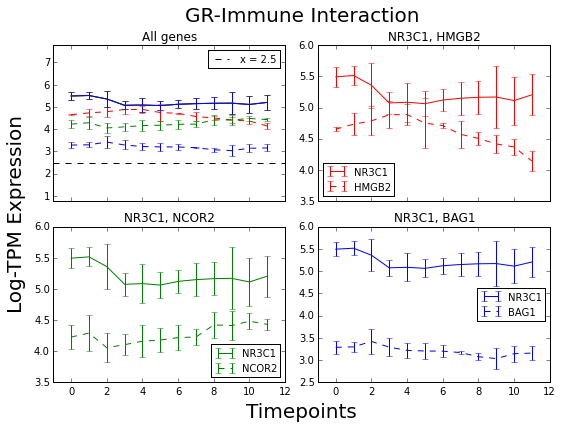

 pair to color is:  {('NR3C1', 'RBM14'): 'b', ('NR3C1', 'TP53'): 'r', ('NR3C1', 'SMARCA2'): 'g'}
[('NR3C1', 'TP53'), ('NR3C1', 'SMARCA2'), ('NR3C1', 'RBM14')]
set(['NR3C1', 'TP53', 'SMARCA2', 'RBM14'])
Y min is :  3.40100092661
Y max is :  5.51473398403
Y avg is :  4.26807227477
Y std is :  0.622716789918
NR3C1 TP53
NR3C1 SMARCA2
NR3C1 RBM14
NR3C1 TP53
NR3C1 SMARCA2
NR3C1 RBM14
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-0-NR3C1-RBM14-SMARCA2-TP53


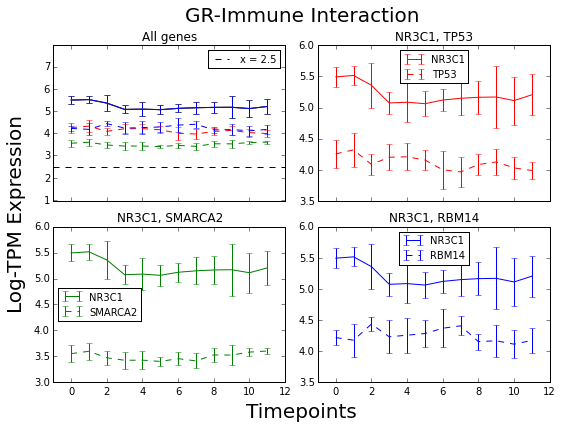

 pair to color is:  {('NR3C1', 'MAFF'): 'r', ('NR3C1', 'ZNF496'): 'b', ('NR3C1', 'ZBTB20'): 'g'}
[('NR3C1', 'MAFF'), ('NR3C1', 'ZBTB20'), ('NR3C1', 'ZNF496')]
set(['ZNF496', 'NR3C1', 'ZBTB20', 'MAFF'])
Y min is :  0.60605910924
Y max is :  5.51473398403
Y avg is :  2.48570064025
Y std is :  1.69976642548
NR3C1 MAFF
NR3C1 ZBTB20
NR3C1 ZNF496
NR3C1 MAFF
NR3C1 ZBTB20
NR3C1 ZNF496
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-2-1-MAFF-NR3C1-ZBTB20-ZNF496


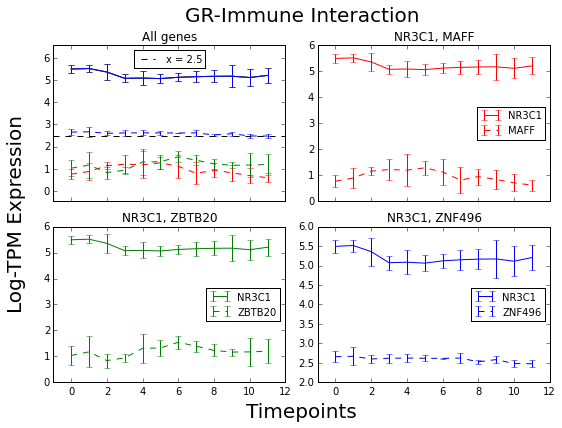

 pair to color is:  {('NR3C1', 'NR0B1'): 'b', ('NR3C1', 'FTH1'): 'g', ('NR3C1', 'MDM2'): 'r'}
[('NR3C1', 'MDM2'), ('NR3C1', 'FTH1'), ('NR3C1', 'NR0B1')]
set(['NR0B1', 'NR3C1', 'FTH1', 'MDM2'])
Y min is :  1.93275816889
Y max is :  8.38257156504
Y avg is :  5.07014608609
Y std is :  2.06003469238
NR3C1 MDM2
NR3C1 FTH1
NR3C1 NR0B1
NR3C1 MDM2
NR3C1 FTH1
NR3C1 NR0B1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-5-2-FTH1-MDM2-NR0B1-NR3C1


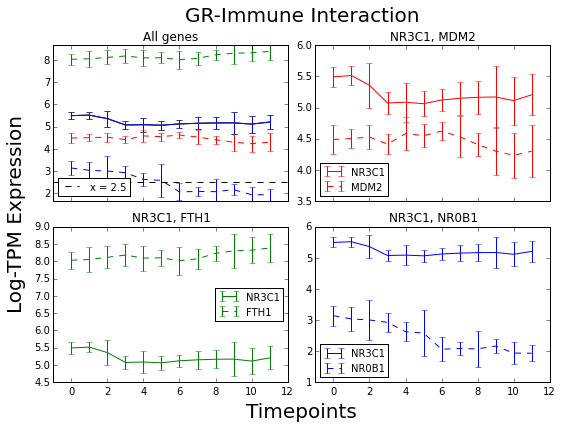

 pair to color is:  {('NR3C1', 'PPID'): 'b', ('NR3C1', 'FKBP5'): 'g', ('NR3C1', 'SRC'): 'r'}
[('NR3C1', 'SRC'), ('NR3C1', 'FKBP5'), ('NR3C1', 'PPID')]
set(['SRC', 'NR3C1', 'PPID', 'FKBP5'])
Y min is :  2.07493217347
Y max is :  5.51473398403
Y avg is :  4.33470381265
Y std is :  0.761776487351
NR3C1 SRC
NR3C1 FKBP5
NR3C1 PPID
NR3C1 SRC
NR3C1 FKBP5
NR3C1 PPID
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-0-FKBP5-NR3C1-PPID-SRC


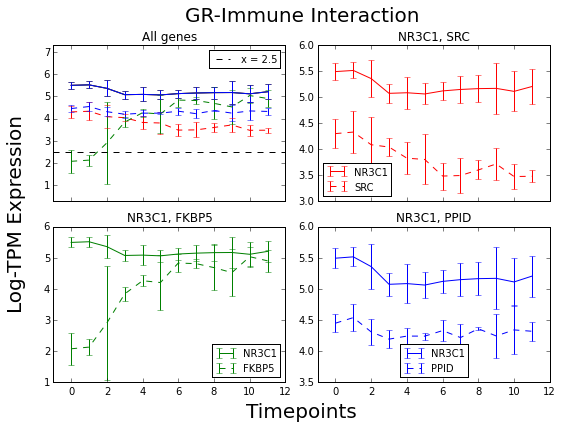

 pair to color is:  {('ZFP36', 'SH3KBP1'): 'b', ('ZFP36', 'HDAC7'): 'g', ('NR3C1', 'HNRNPR'): 'r'}
[('NR3C1', 'HNRNPR'), ('ZFP36', 'HDAC7'), ('ZFP36', 'SH3KBP1')]
set(['ZFP36', 'NR3C1', 'HNRNPR', 'HDAC7', 'SH3KBP1'])
Y min is :  2.88246208264
Y max is :  5.51473398403
Y avg is :  4.4838345374
Y std is :  0.755370021087
NR3C1 HNRNPR
ZFP36 HDAC7
ZFP36 SH3KBP1
NR3C1 HNRNPR
ZFP36 HDAC7
ZFP36 SH3KBP1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-0-HDAC7-HNRNPR-NR3C1-SH3KBP1-ZFP36


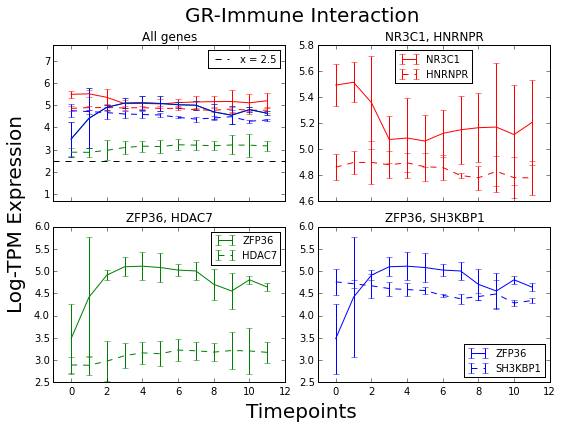

 pair to color is:  {('ZFP36', 'YWHAQ'): 'b', ('ZFP36', 'NCL'): 'r', ('ZFP36', 'EDC3'): 'g'}
[('ZFP36', 'NCL'), ('ZFP36', 'EDC3'), ('ZFP36', 'YWHAQ')]
set(['EDC3', 'ZFP36', 'YWHAQ', 'NCL'])
Y min is :  2.94889951393
Y max is :  8.09626042637
Y avg is :  5.51616873056
Y std is :  1.82068996759
ZFP36 NCL
ZFP36 EDC3
ZFP36 YWHAQ
ZFP36 NCL
ZFP36 EDC3
ZFP36 YWHAQ
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-5-1-EDC3-NCL-YWHAQ-ZFP36


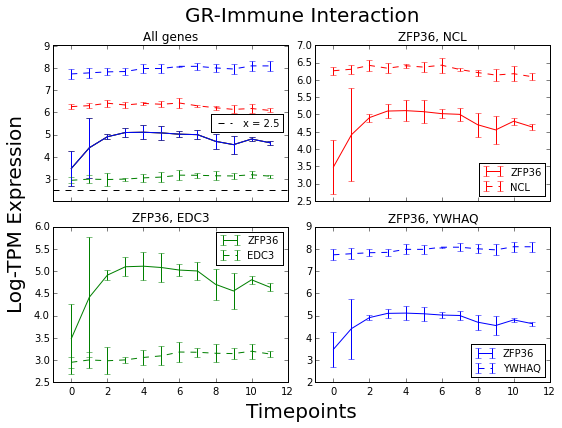

 pair to color is:  {('ZFP36', 'DNAJB1'): 'b', ('ZFP36', 'PRR5L'): 'g', ('ZFP36', 'TRAF2'): 'r'}
[('ZFP36', 'TRAF2'), ('ZFP36', 'PRR5L'), ('ZFP36', 'DNAJB1')]
set(['DNAJB1', 'ZFP36', 'PRR5L', 'TRAF2'])
Y min is :  1.78055224724
Y max is :  5.67254215669
Y avg is :  3.80873135534
Y std is :  1.42261457303
ZFP36 TRAF2
ZFP36 PRR5L
ZFP36 DNAJB1
ZFP36 TRAF2
ZFP36 PRR5L
ZFP36 DNAJB1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-1-DNAJB1-PRR5L-TRAF2-ZFP36


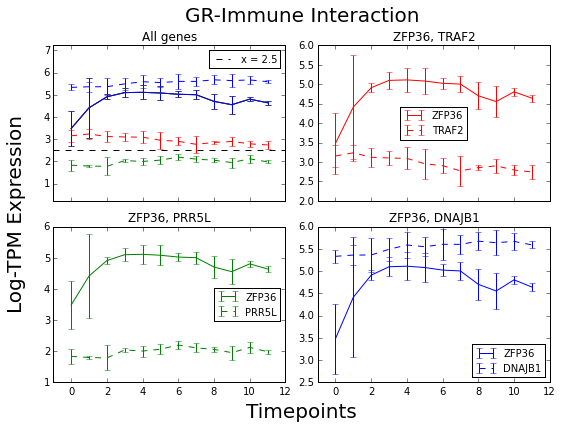

 pair to color is:  {('ZFP36', 'ZEB2'): 'r', ('ZFP36', 'PPP2CB'): 'b', ('ZFP36', 'KLHL2'): 'g'}
[('ZFP36', 'ZEB2'), ('ZFP36', 'KLHL2'), ('ZFP36', 'PPP2CB')]
set(['ZFP36', 'PPP2CB', 'KLHL2', 'ZEB2'])
Y min is :  1.39967099301
Y max is :  5.95281647363
Y avg is :  3.99668138318
Y std is :  1.5862362976
ZFP36 ZEB2
ZFP36 KLHL2
ZFP36 PPP2CB
ZFP36 ZEB2
ZFP36 KLHL2
ZFP36 PPP2CB
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-1-KLHL2-PPP2CB-ZEB2-ZFP36


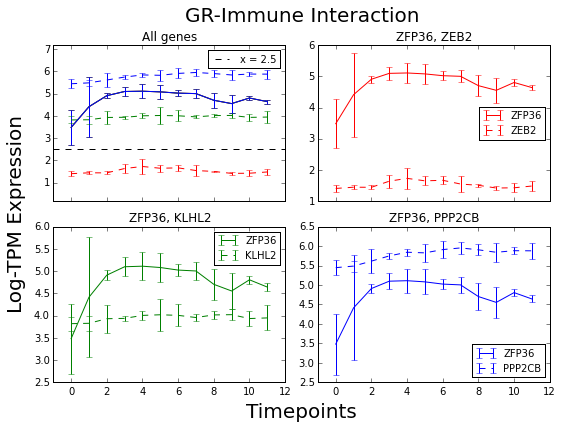

 pair to color is:  {('ZFP36', 'STK40'): 'g', ('ZFP36', 'TANK'): 'b', ('ZFP36', 'SPRY2'): 'r'}
[('ZFP36', 'SPRY2'), ('ZFP36', 'STK40'), ('ZFP36', 'TANK')]
set(['SPRY2', 'ZFP36', 'TANK', 'STK40'])
Y min is :  1.47058529612
Y max is :  5.11025553033
Y avg is :  3.28942616188
Y std is :  1.12804678918
ZFP36 SPRY2
ZFP36 STK40
ZFP36 TANK
ZFP36 SPRY2
ZFP36 STK40
ZFP36 TANK
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-1-SPRY2-STK40-TANK-ZFP36


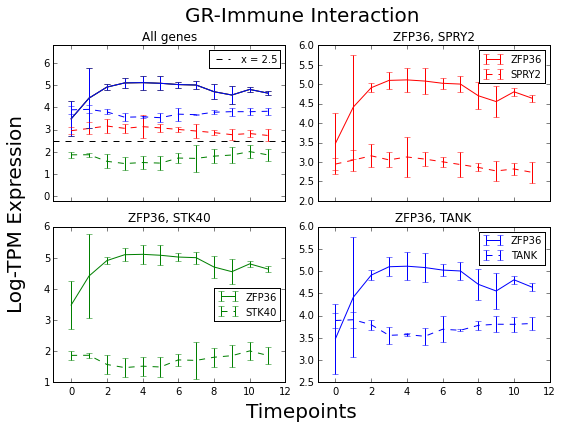

 pair to color is:  {('BIRC3', 'TRAF2'): 'b', ('BIRC3', 'CASP9'): 'r', ('BIRC3', 'RIPK2'): 'g'}
[('BIRC3', 'CASP9'), ('BIRC3', 'RIPK2'), ('BIRC3', 'TRAF2')]
set(['TRAF2', 'RIPK2', 'BIRC3', 'CASP9'])
Y min is :  2.06386431619
Y max is :  4.93656112951
Y avg is :  3.51579479978
Y std is :  0.981470101509
BIRC3 CASP9
BIRC3 RIPK2
BIRC3 TRAF2
BIRC3 CASP9
BIRC3 RIPK2
BIRC3 TRAF2
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-0-BIRC3-CASP9-RIPK2-TRAF2


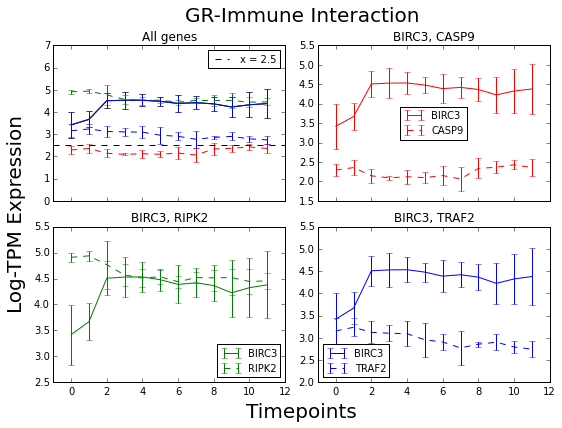

 pair to color is:  {('BIRC3', 'CASP3'): 'g', ('BIRC3', 'BIRC3'): 'b', ('BIRC3', 'TRAF1'): 'r'}
[('BIRC3', 'TRAF1'), ('BIRC3', 'CASP3'), ('BIRC3', 'BIRC3')]
set(['TRAF1', 'BIRC3', 'CASP3'])
Y min is :  1.07550403872
Y max is :  4.61932295274
Y avg is :  3.3526186457
Y std is :  1.47967612536
BIRC3 TRAF1
BIRC3 CASP3
BIRC3 BIRC3
BIRC3 TRAF1
BIRC3 CASP3
BIRC3 BIRC3
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-1-BIRC3-CASP3-TRAF1


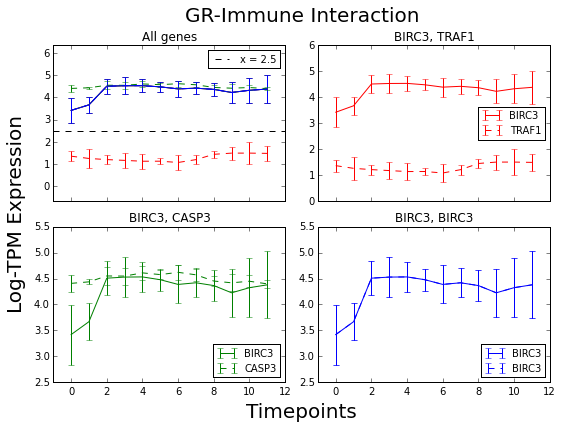

 pair to color is:  {('BIRC3', 'RIPK4'): 'g', ('BIRC3', 'BIRC5'): 'r', ('BIRC3', 'SEPT4'): 'b'}
[('BIRC3', 'BIRC5'), ('BIRC3', 'RIPK4'), ('BIRC3', 'SEPT4')]
set(['SEPT4', 'BIRC5', 'BIRC3', 'RIPK4'])
Y min is :  0.23511753563
Y max is :  5.07329359754
Y avg is :  3.14246120455
Y std is :  1.68947370463
BIRC3 BIRC5
BIRC3 RIPK4
BIRC3 SEPT4
BIRC3 BIRC5
BIRC3 RIPK4
BIRC3 SEPT4
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-1-BIRC3-BIRC5-RIPK4-SEPT4


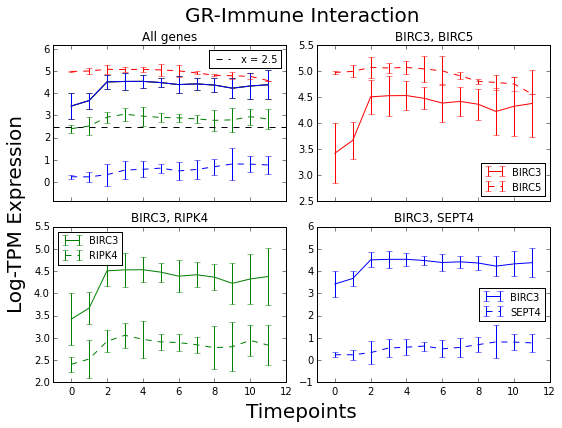

 pair to color is:  {('BIRC3', 'TANK'): 'r', ('BIRC3', 'CASP8'): 'g', ('BIRC3', 'CASP10'): 'b'}
[('BIRC3', 'TANK'), ('BIRC3', 'CASP8'), ('BIRC3', 'CASP10')]
set(['CASP10', 'TANK', 'BIRC3', 'CASP8'])
Y min is :  1.64461673599
Y max is :  4.53060117412
Y avg is :  3.27735691172
Y std is :  0.912266130879
BIRC3 TANK
BIRC3 CASP8
BIRC3 CASP10
BIRC3 TANK
BIRC3 CASP8
BIRC3 CASP10
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-0-BIRC3-CASP10-CASP8-TANK


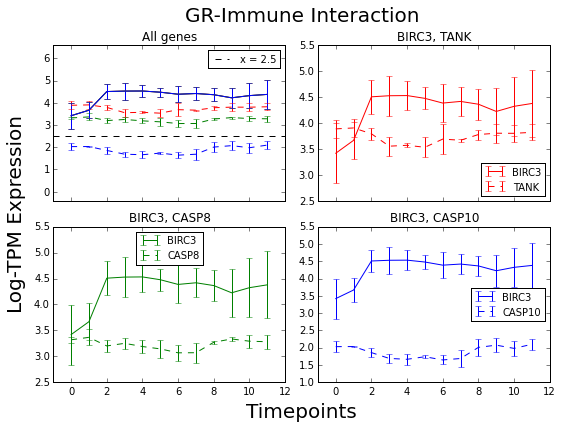

 pair to color is:  {('FKBP5', 'AURKB'): 'b', ('BIRC3', 'LIMA1'): 'r', ('FKBP5', 'NUDCD3'): 'g'}
[('BIRC3', 'LIMA1'), ('FKBP5', 'NUDCD3'), ('FKBP5', 'AURKB')]
set(['NUDCD3', 'LIMA1', 'BIRC3', 'AURKB', 'FKBP5'])
Y min is :  2.07493217347
Y max is :  5.03421505851
Y avg is :  3.62166567373
Y std is :  0.763220104908
BIRC3 LIMA1
FKBP5 NUDCD3
FKBP5 AURKB
BIRC3 LIMA1
FKBP5 NUDCD3
FKBP5 AURKB
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-0-AURKB-BIRC3-FKBP5-LIMA1-NUDCD3


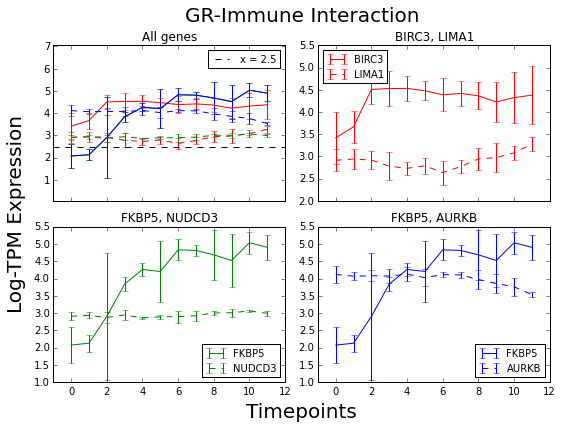

 pair to color is:  {('FKBP5', 'CHORDC1'): 'r', ('FKBP5', 'MCMBP'): 'b', ('FKBP5', 'KIAA1279'): 'g'}
[('FKBP5', 'CHORDC1'), ('FKBP5', 'KIAA1279'), ('FKBP5', 'MCMBP')]
set(['FKBP5', 'CHORDC1', 'MCMBP', 'KIAA1279'])
Y min is :  2.07493217347
Y max is :  5.09643955728
Y avg is :  4.41301171316
Y std is :  0.690196067567
FKBP5 CHORDC1
FKBP5 KIAA1279
FKBP5 MCMBP
FKBP5 CHORDC1
FKBP5 KIAA1279
FKBP5 MCMBP
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-0-CHORDC1-FKBP5-KIAA1279-MCMBP


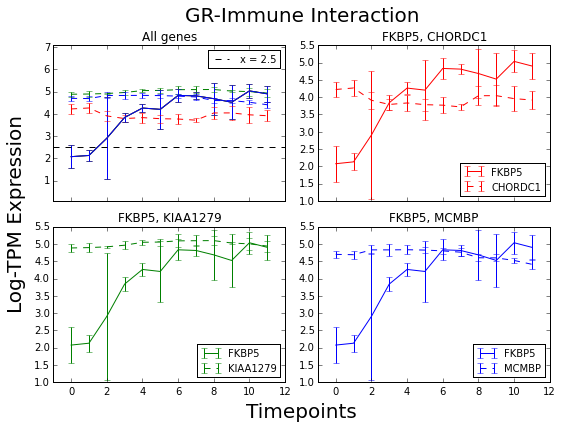

 pair to color is:  {('FKBP5', 'MCM4'): 'g', ('FKBP5', 'DUT'): 'b', ('FKBP5', 'PYGL'): 'r'}
[('FKBP5', 'PYGL'), ('FKBP5', 'MCM4'), ('FKBP5', 'DUT')]
set(['DUT', 'FKBP5', 'MCM4', 'PYGL'])
Y min is :  2.07493217347
Y max is :  5.58654520291
Y avg is :  4.81033615341
Y std is :  0.801194337984
FKBP5 PYGL
FKBP5 MCM4
FKBP5 DUT
FKBP5 PYGL
FKBP5 MCM4
FKBP5 DUT
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-0-DUT-FKBP5-MCM4-PYGL


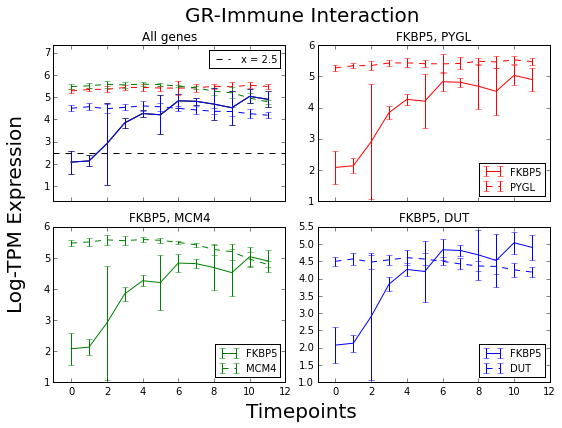

 pair to color is:  {('FKBP5', 'TLE3'): 'r', ('F3', 'STX12'): 'g', ('IL6R', 'IL6ST'): 'b'}
[('FKBP5', 'TLE3'), ('F3', 'STX12'), ('IL6R', 'IL6ST')]
set(['F3', 'TLE3', 'IL6ST', 'FKBP5', 'STX12', 'IL6R'])
Y min is :  1.4927742288
Y max is :  5.88003091797
Y avg is :  3.50255565454
Y std is :  1.23826501714
FKBP5 TLE3
F3 STX12
IL6R IL6ST
FKBP5 TLE3
F3 STX12
IL6R IL6ST
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-1-F3-FKBP5-IL6R-IL6ST-STX12-TLE3


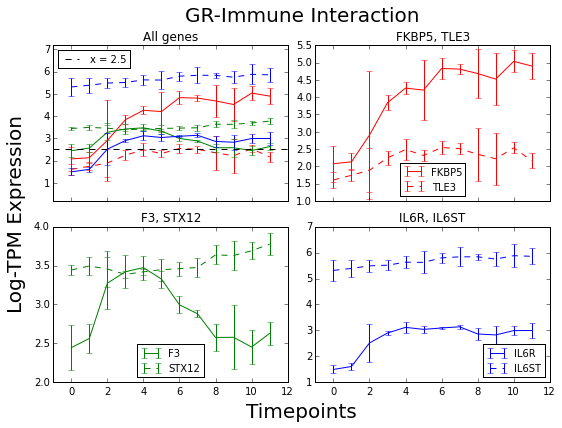

 pair to color is:  {('IL6R', 'STAT3'): 'r', ('BCL6', 'HDAC7'): 'g', ('BCL6', 'NCOR2'): 'b'}
[('IL6R', 'STAT3'), ('BCL6', 'HDAC7'), ('BCL6', 'NCOR2')]
set(['BCL6', 'STAT3', 'NCOR2', 'HDAC7', 'IL6R'])
Y min is :  1.4927742288
Y max is :  5.05724522142
Y avg is :  3.48075130583
Y std is :  0.968536491616
IL6R STAT3
BCL6 HDAC7
BCL6 NCOR2
IL6R STAT3
BCL6 HDAC7
BCL6 NCOR2
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-0-BCL6-HDAC7-IL6R-NCOR2-STAT3


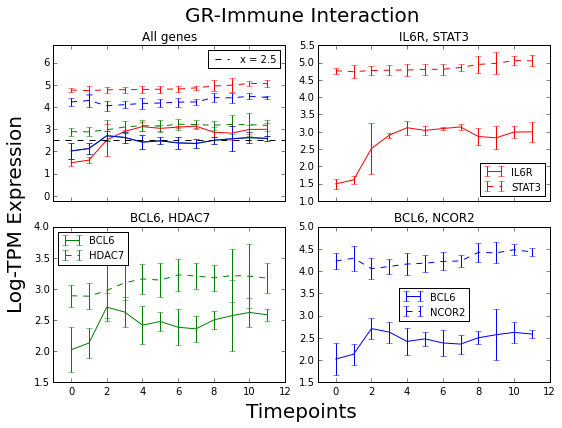

 pair to color is:  {('BCL6', 'SIN3A'): 'r', ('BCL6', 'JUNB'): 'b', ('BCL6', 'JUND'): 'g'}
[('BCL6', 'SIN3A'), ('BCL6', 'JUND'), ('BCL6', 'JUNB')]
set(['BCL6', 'JUNB', 'JUND', 'SIN3A'])
Y min is :  2.02171281221
Y max is :  5.27200418522
Y avg is :  3.68303394597
Y std is :  0.931435122886
BCL6 SIN3A
BCL6 JUND
BCL6 JUNB
BCL6 SIN3A
BCL6 JUND
BCL6 JUNB
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-0-BCL6-JUNB-JUND-SIN3A


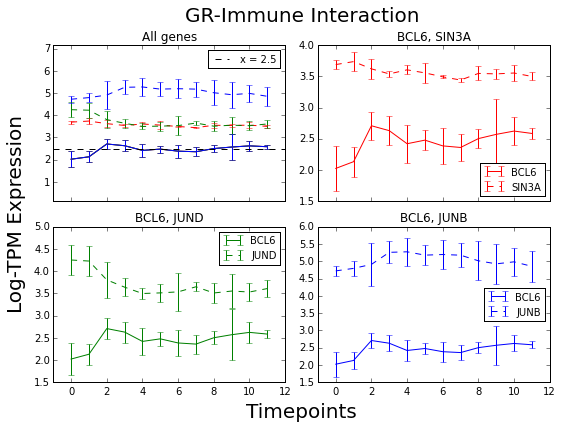

 pair to color is:  {('BCL6', 'HELZ2'): 'b', ('BCL6', 'EBF1'): 'g', ('BCL6', 'ZBTB16'): 'r'}
[('BCL6', 'ZBTB16'), ('BCL6', 'EBF1'), ('BCL6', 'HELZ2')]
set(['BCL6', 'HELZ2', 'ZBTB16', 'EBF1'])
Y min is :  0.0173028557763
Y max is :  2.70703921489
Y avg is :  1.33488451433
Y std is :  0.954437971558
BCL6 ZBTB16
BCL6 EBF1
BCL6 HELZ2
BCL6 ZBTB16
BCL6 EBF1
BCL6 HELZ2
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-1-0-BCL6-EBF1-HELZ2-ZBTB16


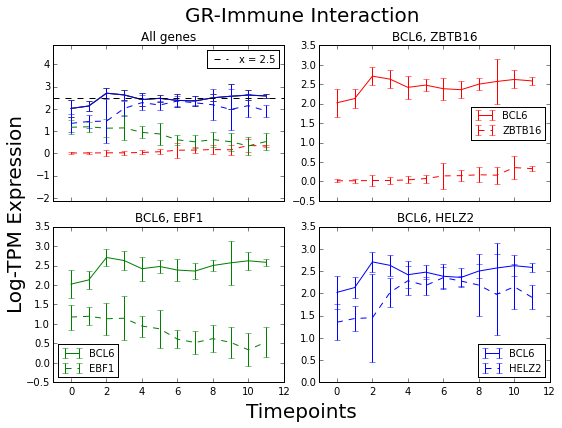

 pair to color is:  {('BCL6', 'SAE1'): 'g', ('BCL6', 'ZMYND8'): 'r', ('BCL6', 'LSM1'): 'b'}
[('BCL6', 'ZMYND8'), ('BCL6', 'SAE1'), ('BCL6', 'LSM1')]
set(['SAE1', 'BCL6', 'ZMYND8', 'LSM1'])
Y min is :  2.02171281221
Y max is :  5.17680061447
Y avg is :  3.83926704473
Y std is :  1.17648879364
BCL6 ZMYND8
BCL6 SAE1
BCL6 LSM1
BCL6 ZMYND8
BCL6 SAE1
BCL6 LSM1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-1-BCL6-LSM1-SAE1-ZMYND8


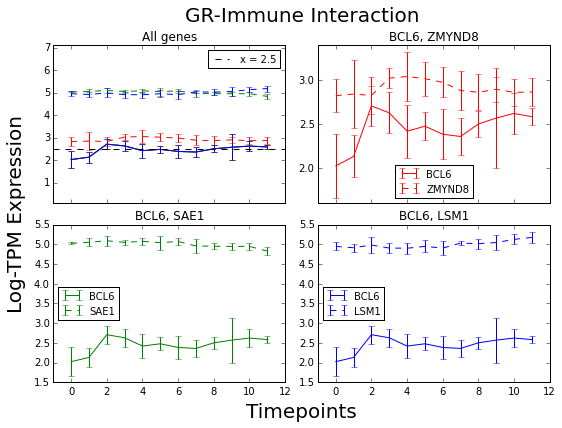

 pair to color is:  {('BCL6', 'MED23'): 'g', ('BCL6', 'OSBPL1A'): 'r', ('BCL6', 'WNT16'): 'b'}
[('BCL6', 'OSBPL1A'), ('BCL6', 'MED23'), ('BCL6', 'WNT16')]
set(['OSBPL1A', 'MED23', 'BCL6', 'WNT16'])
Y min is :  -0.000782110508258
Y max is :  3.59938541621
Y avg is :  2.29768784448
Y std is :  1.32225060223
BCL6 OSBPL1A
BCL6 MED23
BCL6 WNT16
BCL6 OSBPL1A
BCL6 MED23
BCL6 WNT16
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-2-1-BCL6-MED23-OSBPL1A-WNT16


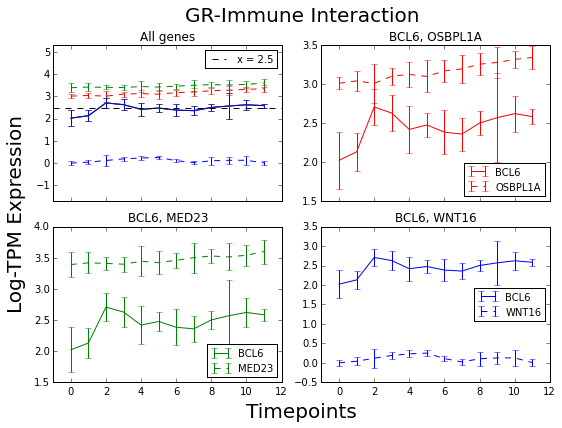

 pair to color is:  {('BCL6', 'EIF2AK3'): 'b', ('BCL6', 'EPHB6'): 'g', ('BCL6', 'ARNT2'): 'r'}
[('BCL6', 'ARNT2'), ('BCL6', 'EPHB6'), ('BCL6', 'EIF2AK3')]
set(['EIF2AK3', 'BCL6', 'EPHB6', 'ARNT2'])
Y min is :  0.121163190405
Y max is :  4.12948309629
Y avg is :  2.36986257788
Y std is :  1.29832041916
BCL6 ARNT2
BCL6 EPHB6
BCL6 EIF2AK3
BCL6 ARNT2
BCL6 EPHB6
BCL6 EIF2AK3
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-2-1-ARNT2-BCL6-EIF2AK3-EPHB6


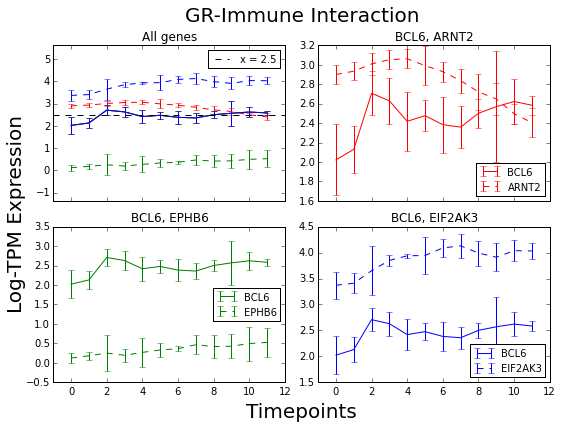

 pair to color is:  {('BCL6', 'EHMT1'): 'r', ('BCL6', 'TRIB3'): 'g', ('BCL6', 'PPAP2B'): 'b'}
[('BCL6', 'EHMT1'), ('BCL6', 'TRIB3'), ('BCL6', 'PPAP2B')]
set(['EHMT1', 'BCL6', 'PPAP2B', 'TRIB3'])
Y min is :  2.02171281221
Y max is :  4.38669324999
Y avg is :  3.31358291276
Y std is :  0.669759906677
BCL6 EHMT1
BCL6 TRIB3
BCL6 PPAP2B
BCL6 EHMT1
BCL6 TRIB3
BCL6 PPAP2B
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-0-BCL6-EHMT1-PPAP2B-TRIB3


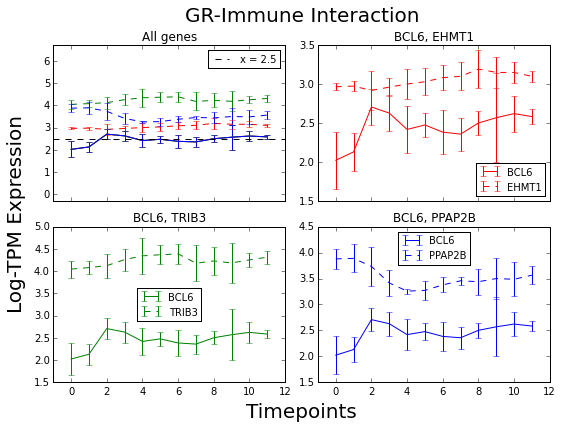

 pair to color is:  {('BCL6', 'SENP7'): 'r', ('BCL6', 'CACNA1A'): 'g', ('BCL6', 'WNK4'): 'b'}
[('BCL6', 'SENP7'), ('BCL6', 'CACNA1A'), ('BCL6', 'WNK4')]
set(['SENP7', 'CACNA1A', 'BCL6', 'WNK4'])
Y min is :  0.0025542804174
Y max is :  2.92365767946
Y avg is :  1.43739459563
Y std is :  1.1539723253
BCL6 SENP7
BCL6 CACNA1A
BCL6 WNK4
BCL6 SENP7
BCL6 CACNA1A
BCL6 WNK4
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-1-1-BCL6-CACNA1A-SENP7-WNK4


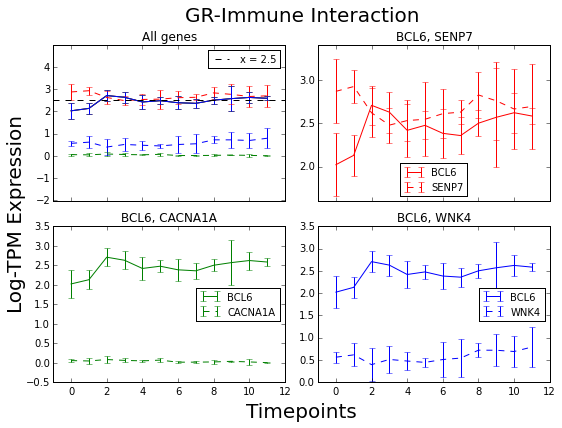

 pair to color is:  {('BCL6', 'MED17'): 'g', ('BCL6', 'KIF13B'): 'r', ('BCL6', 'FOXM1'): 'b'}
[('BCL6', 'KIF13B'), ('BCL6', 'MED17'), ('BCL6', 'FOXM1')]
set(['KIF13B', 'BCL6', 'FOXM1', 'MED17'])
Y min is :  2.02171281221
Y max is :  4.24443919639
Y avg is :  2.9698465387
Y std is :  0.701313138122
BCL6 KIF13B
BCL6 MED17
BCL6 FOXM1
BCL6 KIF13B
BCL6 MED17
BCL6 FOXM1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-2-0-BCL6-FOXM1-KIF13B-MED17


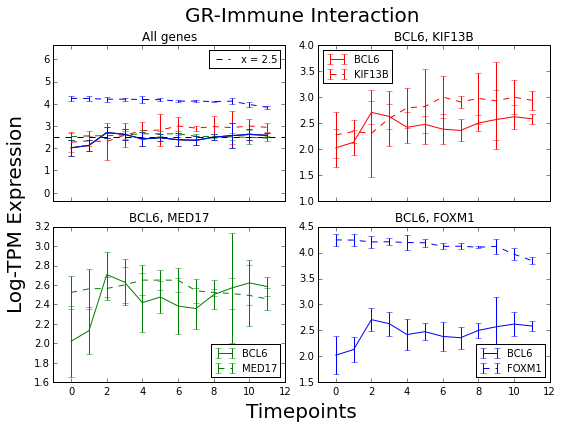

 pair to color is:  {('BCL6', 'TRAF1'): 'b', ('BCL6', 'BCL6'): 'r', ('BCL6', 'KIFC3'): 'g'}
[('BCL6', 'BCL6'), ('BCL6', 'KIFC3'), ('BCL6', 'TRAF1')]
set(['TRAF1', 'BCL6', 'KIFC3'])
Y min is :  1.07550403872
Y max is :  4.13016090472
Y avg is :  2.55249094022
Y std is :  1.08865850841
BCL6 BCL6
BCL6 KIFC3
BCL6 TRAF1
BCL6 BCL6
BCL6 KIFC3
BCL6 TRAF1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-2-1-BCL6-KIFC3-TRAF1


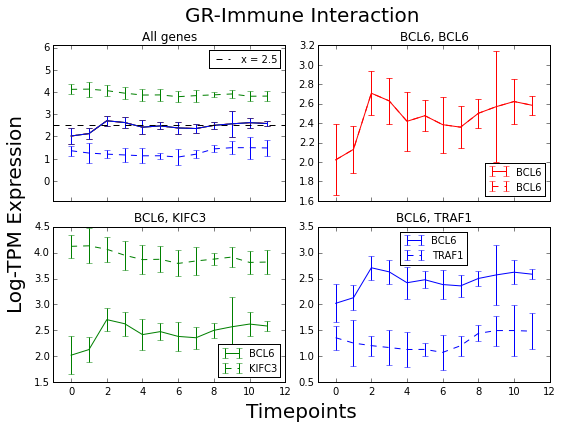

 pair to color is:  {('BCL6', 'ZBTB7B'): 'g', ('BCL6', 'BLZF1'): 'r', ('TNFAIP3', 'TRAF1'): 'b'}
[('BCL6', 'BLZF1'), ('BCL6', 'ZBTB7B'), ('TNFAIP3', 'TRAF1')]
set(['TRAF1', 'BLZF1', 'BCL6', 'TNFAIP3', 'ZBTB7B'])
Y min is :  1.07550403872
Y max is :  3.37935479453
Y avg is :  2.4492923618
Y std is :  0.694295921429
BCL6 BLZF1
BCL6 ZBTB7B
TNFAIP3 TRAF1
BCL6 BLZF1
BCL6 ZBTB7B
TNFAIP3 TRAF1
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-2-0-BCL6-BLZF1-TNFAIP3-TRAF1-ZBTB7B


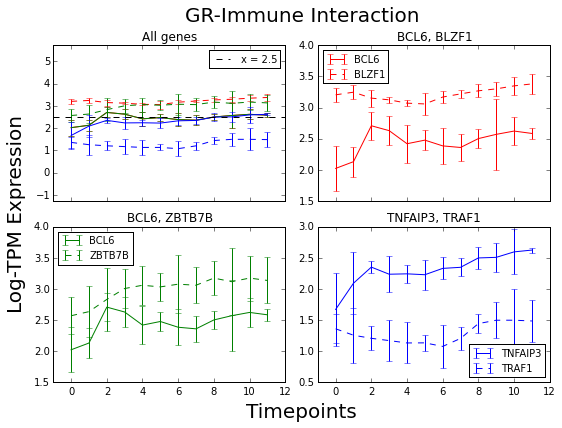

 pair to color is:  {('TNFAIP3', 'TRAF2'): 'r', ('TNFAIP3', 'YWHAE'): 'b', ('TNFAIP3', 'TNFAIP3'): 'g'}
[('TNFAIP3', 'TRAF2'), ('TNFAIP3', 'TNFAIP3'), ('TNFAIP3', 'YWHAE')]
set(['TRAF2', 'TNFAIP3', 'YWHAE'])
Y min is :  1.66966222593
Y max is :  6.66309840358
Y avg is :  3.95411824113
Y std is :  1.88653189224
TNFAIP3 TRAF2
TNFAIP3 TNFAIP3
TNFAIP3 YWHAE
TNFAIP3 TRAF2
TNFAIP3 TNFAIP3
TNFAIP3 YWHAE
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-1-TNFAIP3-TRAF2-YWHAE


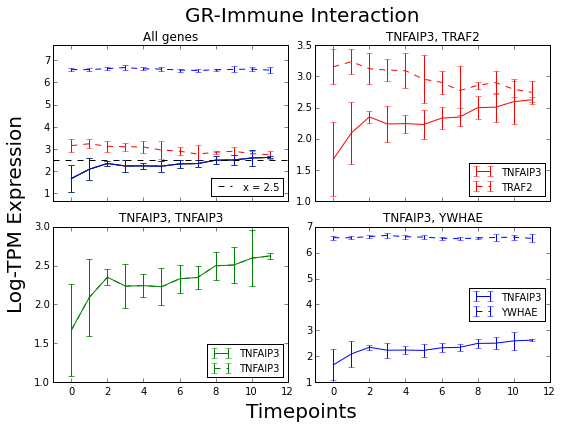

 pair to color is:  {('TNFAIP3', 'MCM6'): 'b', ('TNFAIP3', 'GLDC'): 'r', ('TNFAIP3', 'KIF11'): 'g'}
[('TNFAIP3', 'GLDC'), ('TNFAIP3', 'KIF11'), ('TNFAIP3', 'MCM6')]
set(['MCM6', 'GLDC', 'KIF11', 'TNFAIP3'])
Y min is :  1.66966222593
Y max is :  5.80334308956
Y avg is :  4.35332058336
Y std is :  1.31661556834
TNFAIP3 GLDC
TNFAIP3 KIF11
TNFAIP3 MCM6
TNFAIP3 GLDC
TNFAIP3 KIF11
TNFAIP3 MCM6
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-1-GLDC-KIF11-MCM6-TNFAIP3


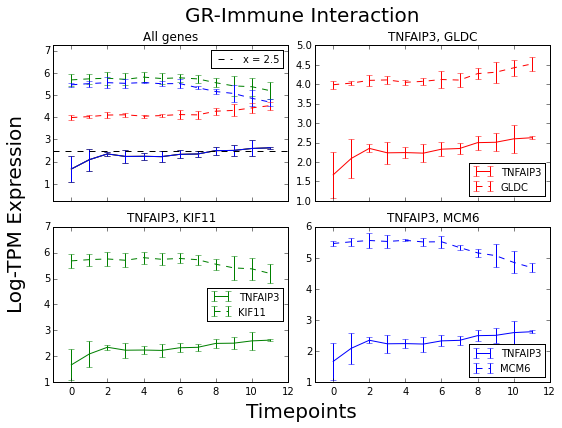

 pair to color is:  {('TNFAIP3', 'FBXO3'): 'g', ('TNFAIP3', 'TRIM5'): 'b', ('TNFAIP3', 'CNKSR2'): 'r'}
[('TNFAIP3', 'CNKSR2'), ('TNFAIP3', 'FBXO3'), ('TNFAIP3', 'TRIM5')]
set(['FBXO3', 'TRIM5', 'TNFAIP3', 'CNKSR2'])
Y min is :  1.66966222593
Y max is :  3.52274527216
Y avg is :  2.7654440816
Y std is :  0.490182611371
TNFAIP3 CNKSR2
TNFAIP3 FBXO3
TNFAIP3 TRIM5
TNFAIP3 CNKSR2
TNFAIP3 FBXO3
TNFAIP3 TRIM5
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-2-0-CNKSR2-FBXO3-TNFAIP3-TRIM5


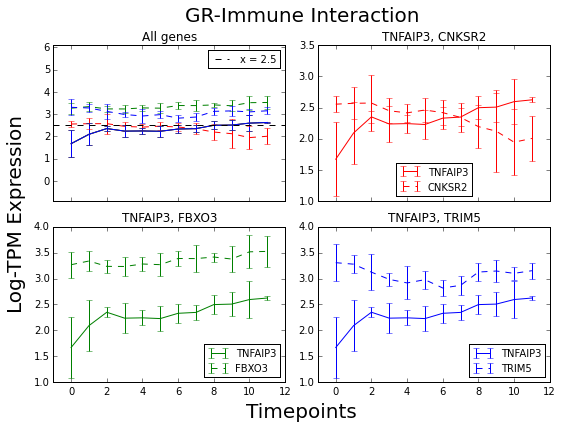

 pair to color is:  {('TNFAIP3', 'TP53'): 'r', ('TNFAIP3', 'NFKB2'): 'g', ('TNFAIP3', 'BIRC3'): 'b'}
[('TNFAIP3', 'TP53'), ('TNFAIP3', 'NFKB2'), ('TNFAIP3', 'BIRC3')]
set(['BIRC3', 'NFKB2', 'TP53', 'TNFAIP3'])
Y min is :  1.66966222593
Y max is :  4.53060117412
Y avg is :  3.40603976329
Y std is :  0.86519494979
TNFAIP3 TP53
TNFAIP3 NFKB2
TNFAIP3 BIRC3
TNFAIP3 TP53
TNFAIP3 NFKB2
TNFAIP3 BIRC3
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-3-0-BIRC3-NFKB2-TNFAIP3-TP53


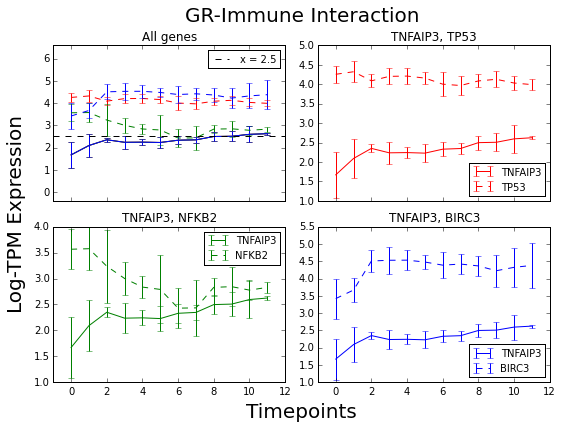

 pair to color is:  {('TNFAIP3', 'YWHAQ'): 'g', ('TNFAIP3', 'ARRDC3'): 'b', ('TNFAIP3', 'OCLN'): 'r'}
[('TNFAIP3', 'OCLN'), ('TNFAIP3', 'YWHAQ'), ('TNFAIP3', 'ARRDC3')]
set(['OCLN', 'YWHAQ', 'TNFAIP3', 'ARRDC3'])
Y min is :  1.66966222593
Y max is :  8.09626042637
Y avg is :  4.03384555348
Y std is :  2.31245532241
TNFAIP3 OCLN
TNFAIP3 YWHAQ
TNFAIP3 ARRDC3
TNFAIP3 OCLN
TNFAIP3 YWHAQ
TNFAIP3 ARRDC3
Figure saved to  plots/GR-Immune-Interaction/GR-Immune-Interaction-4-2-ARRDC3-OCLN-TNFAIP3-YWHAQ


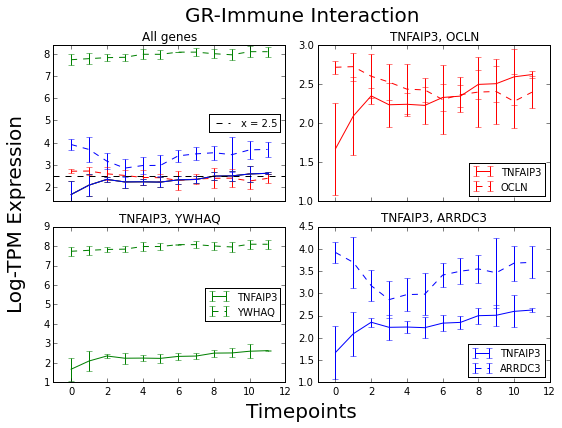

In [20]:
reload(gtm)

plot_pairs_list = sorted(imm_pairs, key = lambda pair: data[data["gene"] == pair[0]]["avg"].values[0],
                        reverse=True)
file_prefix="plots/GR-Immune-Interaction/GR-Immune-Interaction"
title = "GR-Immune Interaction"

!mkdir plots/GR-Immune-Interaction

horizontal_line_color_labels = [(2.5, 'k', "x = 2.5")]
print len(plot_pairs_list)

gtm.plot_multi_pairs_grid(data, plot_pairs_list, title, file_prefix=file_prefix, horizontal_line_color_labels=horizontal_line_color_labels)

In [23]:
er_bg_df["GR_B"] = np.logical_or(er_bg_df["GR_GO_B"], er_bg_df["GR_direct-candidate_B"])

indices = np.logical_and(er_bg_df["GR_A"] != 0, er_bg_df["GR_B"] != 0)
dup_both_pairs = zip(er_bg_df[indices]["Official Symbol Interactor A"].values,
                er_bg_df[indices]["Official Symbol Interactor B"].values)

both_pairs = []
for dup_both_pair in dup_both_pairs:
    if dup_both_pair[0] != dup_both_pair[1]:
        both_pairs.append(dup_both_pair)
print "Num both GR: ", len(both_pairs)

Num both GR:  20


mkdir: plots/GR-Both-Interaction: File exists
20
 pair to color is:  {('CEBPB', 'NR3C1'): 'r', ('CEBPB', 'CEBPG'): 'g', ('CEBPB', 'CEBPD'): 'b'}
[('CEBPB', 'NR3C1'), ('CEBPB', 'CEBPG'), ('CEBPB', 'CEBPD')]
set(['CEBPB', 'NR3C1', 'CEBPG', 'CEBPD'])
Y min is :  2.97189272824
Y max is :  6.10760199116
Y avg is :  4.86251305437
Y std is :  0.809113015468
CEBPB NR3C1
CEBPB CEBPG
CEBPB CEBPD
CEBPB NR3C1
CEBPB CEBPG
CEBPB CEBPD
Figure saved to  plots/GR-Both-Interaction/GR-Both-Interaction-4-0-CEBPB-CEBPD-CEBPG-NR3C1


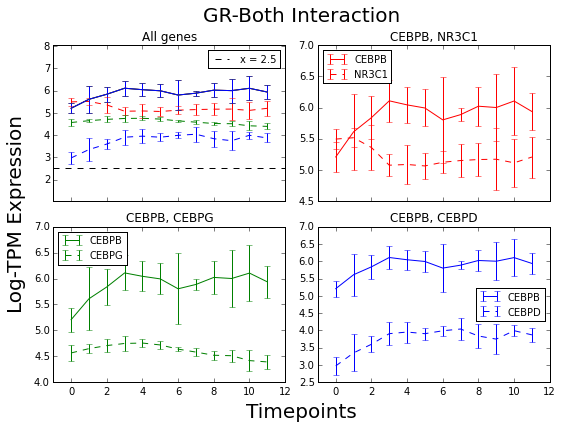

 pair to color is:  {('NEDD4', 'SPRY1'): 'r', ('NEDD4', 'IRS2'): 'b', ('NEDD4', 'WEE1'): 'g'}
[('NEDD4', 'SPRY1'), ('NEDD4', 'WEE1'), ('NEDD4', 'IRS2')]
set(['SPRY1', 'NEDD4', 'WEE1', 'IRS2'])
Y min is :  0.903071693425
Y max is :  6.29287544417
Y avg is :  4.01049594632
Y std is :  1.49306993177
NEDD4 SPRY1
NEDD4 WEE1
NEDD4 IRS2
NEDD4 SPRY1
NEDD4 WEE1
NEDD4 IRS2
Figure saved to  plots/GR-Both-Interaction/GR-Both-Interaction-4-1-IRS2-NEDD4-SPRY1-WEE1


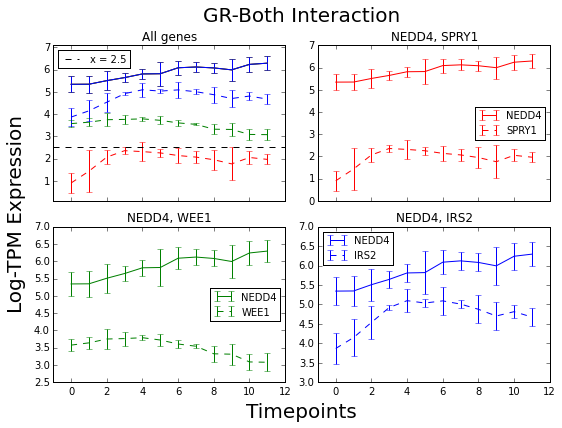

 pair to color is:  {('NR3C1', 'RBM14'): 'g', ('NR3C1', 'ETS2'): 'r', ('NR3C1', 'FKBP5'): 'b'}
[('NR3C1', 'ETS2'), ('NR3C1', 'RBM14'), ('NR3C1', 'FKBP5')]
set(['ETS2', 'FKBP5', 'NR3C1', 'RBM14'])
Y min is :  2.07493217347
Y max is :  5.51473398403
Y avg is :  4.50916157553
Y std is :  0.688746453812
NR3C1 ETS2
NR3C1 RBM14
NR3C1 FKBP5
NR3C1 ETS2
NR3C1 RBM14
NR3C1 FKBP5
Figure saved to  plots/GR-Both-Interaction/GR-Both-Interaction-4-0-ETS2-FKBP5-NR3C1-RBM14


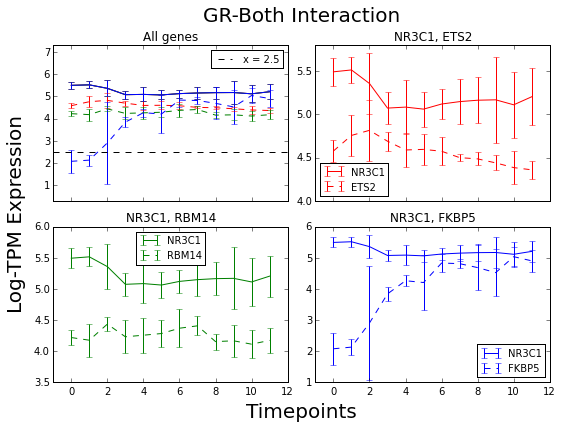

 pair to color is:  {('BIRC3', 'RIPK4'): 'r', ('PER2', 'CRY1'): 'b', ('PER1', 'CRY1'): 'g'}
[('BIRC3', 'RIPK4'), ('PER1', 'CRY1'), ('PER2', 'CRY1')]
set(['PER2', 'PER1', 'BIRC3', 'RIPK4', 'CRY1'])
Y min is :  1.6308723733
Y max is :  4.53060117412
Y avg is :  3.51675117333
Y std is :  0.68125460935
BIRC3 RIPK4
PER1 CRY1
PER2 CRY1
BIRC3 RIPK4
PER1 CRY1
PER2 CRY1
Figure saved to  plots/GR-Both-Interaction/GR-Both-Interaction-3-0-BIRC3-CRY1-PER1-PER2-RIPK4


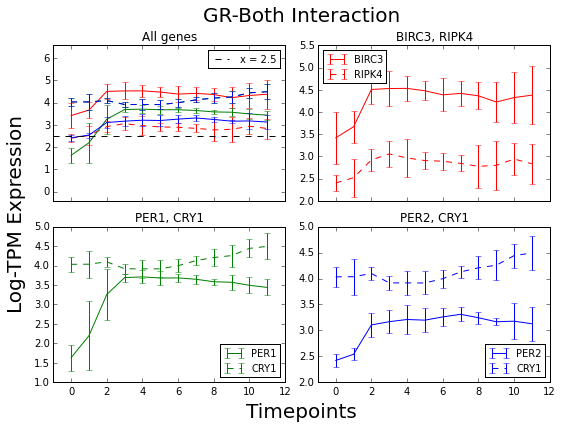

 pair to color is:  {('ARNTL', 'CRY1'): 'g', ('PER2', 'CRY2'): 'r', ('ARNTL', 'CRY2'): 'b'}
[('PER2', 'CRY2'), ('ARNTL', 'CRY1'), ('ARNTL', 'CRY2')]
set(['ARNTL', 'PER2', 'CRY1', 'CRY2'])
Y min is :  1.43265369881
Y max is :  4.49253617735
Y avg is :  2.9303497769
Y std is :  0.816710600923
PER2 CRY2
ARNTL CRY1
ARNTL CRY2
PER2 CRY2
ARNTL CRY1
ARNTL CRY2
Figure saved to  plots/GR-Both-Interaction/GR-Both-Interaction-2-0-ARNTL-CRY1-CRY2-PER2


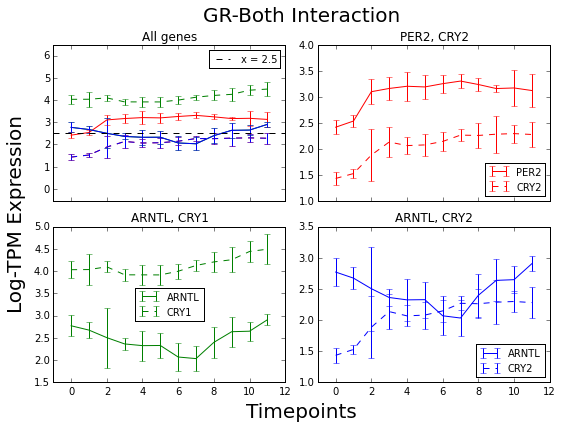

 pair to color is:  {('TNFAIP3', 'BIRC3'): 'r', ('CRY2', 'PER1'): 'g', ('CRY2', 'CRY1'): 'b'}
[('TNFAIP3', 'BIRC3'), ('CRY2', 'PER1'), ('CRY2', 'CRY1')]
set(['PER1', 'BIRC3', 'CRY2', 'TNFAIP3', 'CRY1'])
Y min is :  1.43265369881
Y max is :  4.53060117412
Y avg is :  3.20987909713
Y std is :  0.980014472248
TNFAIP3 BIRC3
CRY2 PER1
CRY2 CRY1
TNFAIP3 BIRC3
CRY2 PER1
CRY2 CRY1
Figure saved to  plots/GR-Both-Interaction/GR-Both-Interaction-3-0-BIRC3-CRY1-CRY2-PER1-TNFAIP3


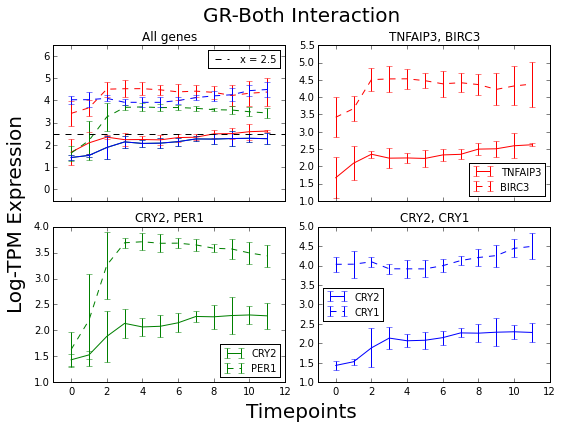

 pair to color is:  {('TRIM63', 'PDK4'): 'g', ('POU5F1', 'ETS2'): 'r'}
[('POU5F1', 'ETS2'), ('TRIM63', 'PDK4')]
set(['ETS2', 'TRIM63', 'POU5F1', 'PDK4'])
Y min is :  -0.019282966966
Y max is :  4.81621193426
Y avg is :  2.72293089933
Y std is :  1.89272647032
POU5F1 ETS2
TRIM63 PDK4
POU5F1 ETS2
TRIM63 PDK4
Figure saved to  plots/GR-Both-Interaction/GR-Both-Interaction-2-1-ETS2-PDK4-POU5F1-TRIM63


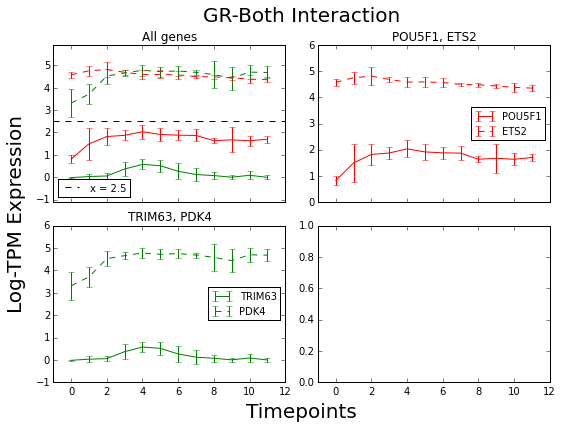

In [25]:
reload(gtm)

plot_pairs_list = sorted(both_pairs, key = lambda pair: data[data["gene"] == pair[0]]["avg"].values[0],
                        reverse=True)
file_prefix="plots/GR-Both-Interaction/GR-Both-Interaction"
title = "GR-Both Interaction"

!mkdir plots/GR-Both-Interaction

horizontal_line_color_labels = [(2.5, 'k', "x = 2.5")]
print len(plot_pairs_list)

gtm.plot_multi_pairs_grid(data, plot_pairs_list, title, file_prefix=file_prefix, horizontal_line_color_labels=horizontal_line_color_labels)

# Top genes from initial pagerank

In [28]:
import numpy as np

pr_genes = np.load("raw_files/sigGenes_simplePgR.npy")
pr_genes = [nh.ensg2hg(gene) for gene in pr_genes]
print pr_genes


[u'SUSD3', u'TNFSF15', u'EDN2', u'PIR', u'SLC16A12', u'CDKN1C', u'LEFTY1', u'C1RL', u'KRT6A', u'TFCP2L1', u'TUBA3E', u'AOX1', u'GPR1', u'SDS', u'ALPP', u'CIDEC', u'NR1D2', u'PCSK6', u'NID2', u'OCA2', u'STK32B', u'CILP', u'HS3ST6', u'ACSL1', u'CENPH', u'CDH16', u'RRAD', u'CLDN7', u'RASD1', u'DUSP22', u'HIST1H3B', u'STAC2', u'ANKRD2', u'FKBP5', u'FGD4', u'KIF4A', u'EZR', u'IGFBP1', u'XRCC2', u'CDCA2', u'ESCO2', u'LBP', u'KCNB1']


43
Gene to color is:  {u'CDCA2': 'g', u'KIF4A': 'b', u'EZR': 'r'}
Y min is :  4.21417503895
Y max is :  6.63721165976
Y avg is :  5.24919857981
Y std is :  0.917814115752
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-5-0-CDCA2-EZR-KIF4A


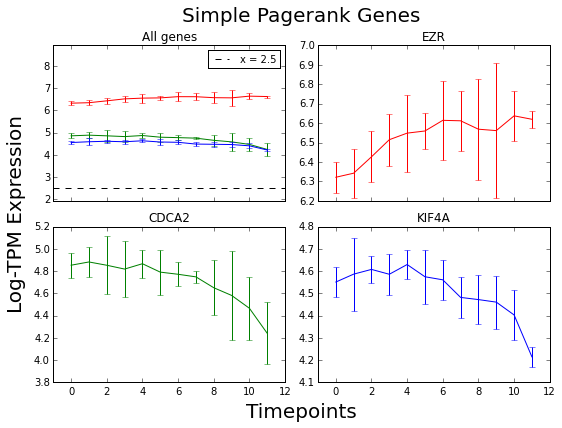

Gene to color is:  {u'NR1D2': 'g', u'ACSL1': 'r', u'CIDEC': 'b'}
Y min is :  1.73586639474
Y max is :  5.68830359432
Y avg is :  4.28484925603
Y std is :  0.870339173238
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-4-0-ACSL1-CIDEC-NR1D2


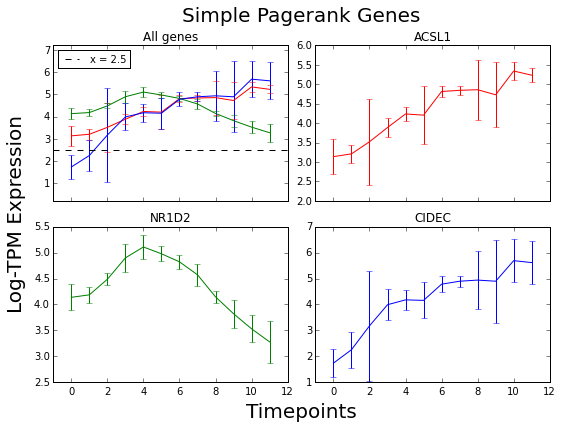

Gene to color is:  {u'PIR': 'r', u'TFCP2L1': 'b', u'CENPH': 'g'}
Y min is :  1.73730729708
Y max is :  4.99408807342
Y avg is :  4.07148302921
Y std is :  0.669960844955
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-4-0-CENPH-PIR-TFCP2L1


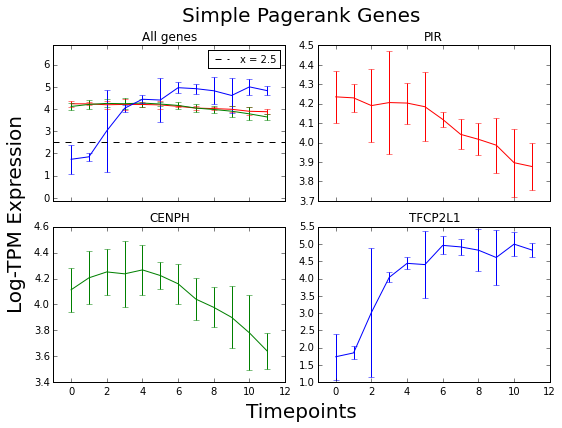

Gene to color is:  {u'FKBP5': 'r', u'ESCO2': 'b', u'NID2': 'g'}
Y min is :  2.07493217347
Y max is :  5.03421505851
Y avg is :  3.83950829545
Y std is :  0.656709142777
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-3-0-ESCO2-FKBP5-NID2


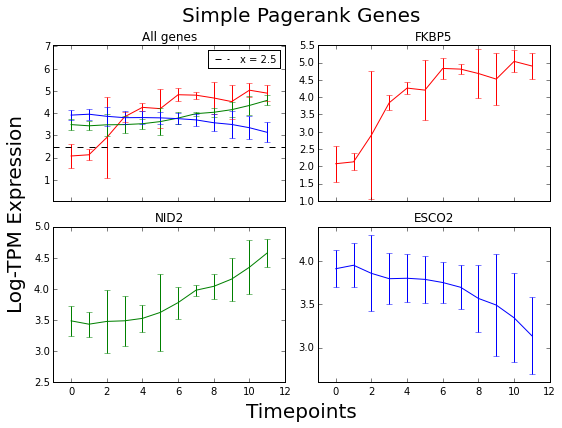

Gene to color is:  {u'FGD4': 'r', u'XRCC2': 'g', u'IGFBP1': 'b'}
Y min is :  1.9366836541
Y max is :  4.21651289231
Y avg is :  3.25556469598
Y std is :  0.611253518362
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-3-0-FGD4-IGFBP1-XRCC2


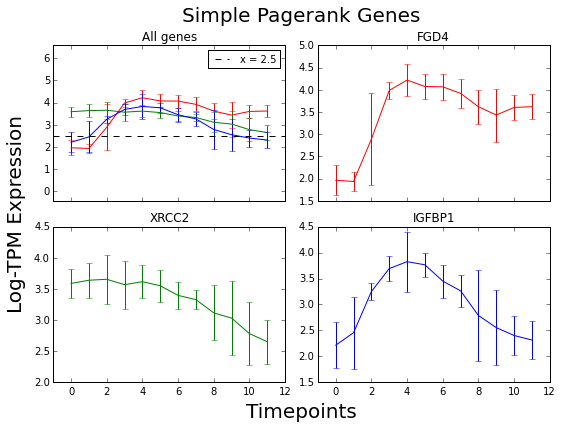

Gene to color is:  {u'AOX1': 'g', u'EDN2': 'b', u'C1RL': 'r'}
Y min is :  1.61018993018
Y max is :  3.57670702605
Y avg is :  2.81769681291
Y std is :  0.444161036596
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-2-0-AOX1-C1RL-EDN2


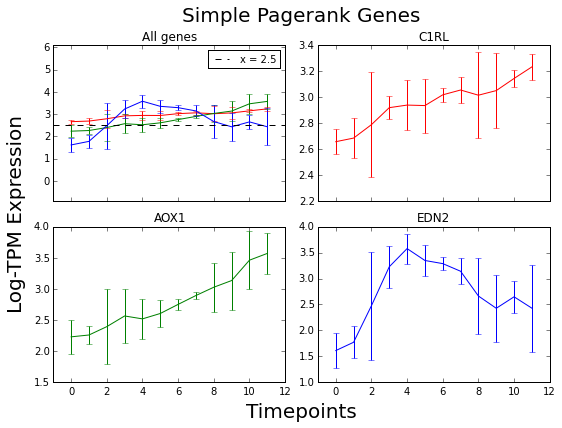

Gene to color is:  {u'CDKN1C': 'b', u'DUSP22': 'r', u'GPR1': 'g'}
Y min is :  0.479288106326
Y max is :  3.52653082194
Y avg is :  2.53473102448
Y std is :  0.814462044897
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-2-0-CDKN1C-DUSP22-GPR1


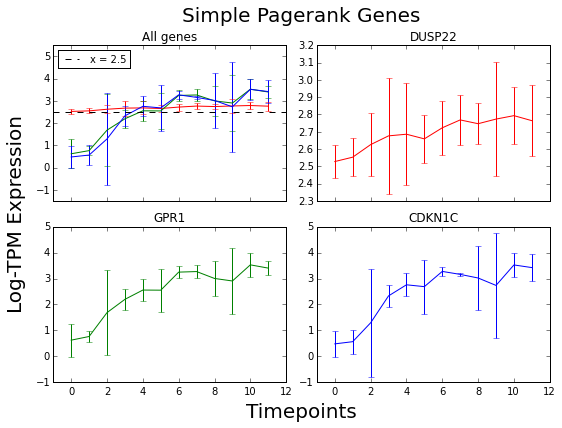

Gene to color is:  {u'STK32B': 'g', u'PCSK6': 'b', u'RRAD': 'r'}
Y min is :  0.658231947981
Y max is :  3.1605311968
Y avg is :  2.2857999494
Y std is :  0.548991210066
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-2-0-PCSK6-RRAD-STK32B


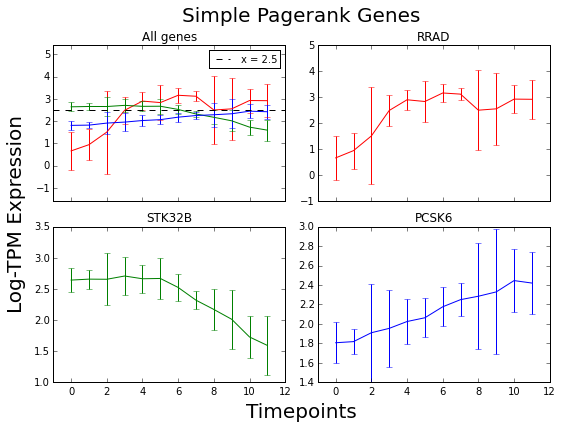

Gene to color is:  {u'STAC2': 'b', u'ANKRD2': 'r', u'CDH16': 'g'}
Y min is :  0.212960995206
Y max is :  3.34153983222
Y avg is :  2.03278483947
Y std is :  0.815001262094
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-2-0-ANKRD2-CDH16-STAC2


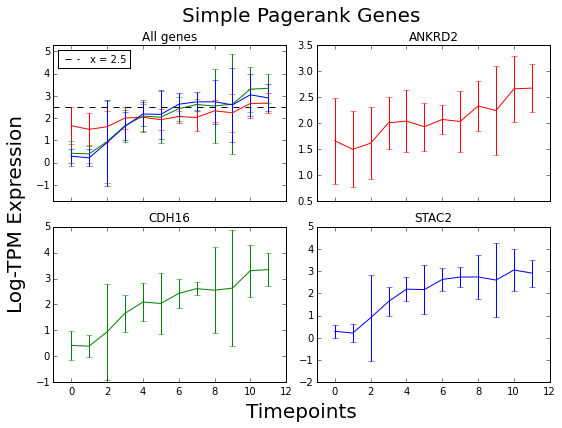

Gene to color is:  {u'HIST1H3B': 'g', u'ALPP': 'b', u'SDS': 'r'}
Y min is :  0.221936829531
Y max is :  3.35971868406
Y avg is :  1.83410168025
Y std is :  0.708501189182
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-1-0-ALPP-HIST1H3B-SDS


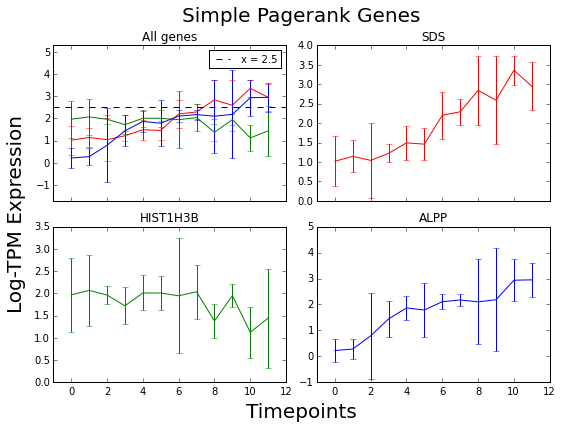

Gene to color is:  {u'KCNB1': 'g', u'SLC16A12': 'b', u'KRT6A': 'r'}
Y min is :  0.305885080813
Y max is :  3.13116613215
Y avg is :  1.63198695406
Y std is :  0.843459879078
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-1-0-KCNB1-KRT6A-SLC16A12


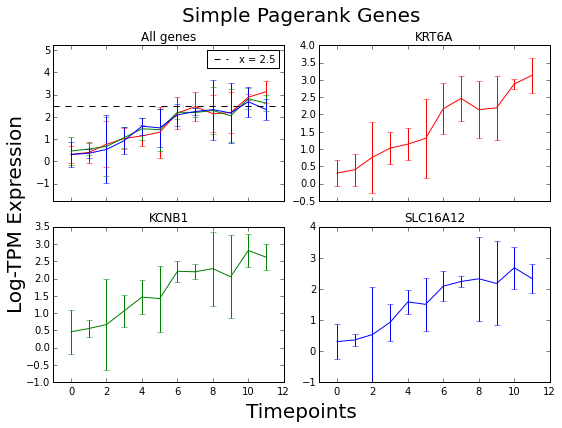

Gene to color is:  {u'CILP': 'r', u'HS3ST6': 'b', u'RASD1': 'g'}
Y min is :  0.180631385581
Y max is :  2.64735044011
Y avg is :  1.40862254523
Y std is :  0.626192446339
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-1-0-CILP-HS3ST6-RASD1


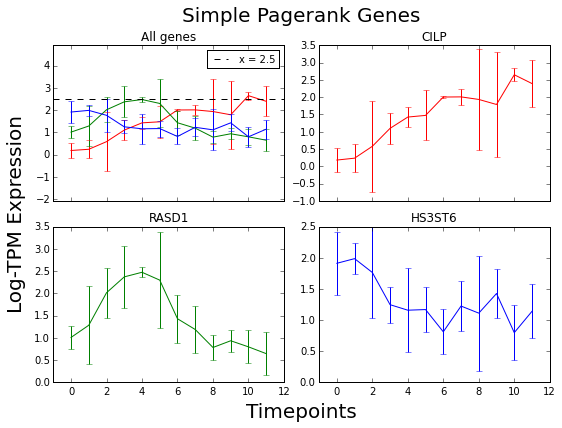

Gene to color is:  {u'LBP': 'r', u'TUBA3E': 'b', u'LEFTY1': 'g'}
Y min is :  0.166174617851
Y max is :  2.15574633508
Y avg is :  1.19259664362
Y std is :  0.513230939723
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-1-0-LBP-LEFTY1-TUBA3E


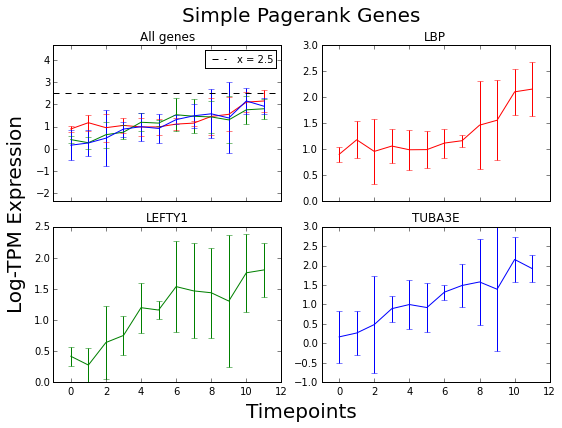

Gene to color is:  {u'OCA2': 'b', u'TNFSF15': 'g', u'CLDN7': 'r'}
Y min is :  0.279601730229
Y max is :  2.60453403089
Y avg is :  1.01314484257
Y std is :  0.549106733468
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-1-0-CLDN7-OCA2-TNFSF15


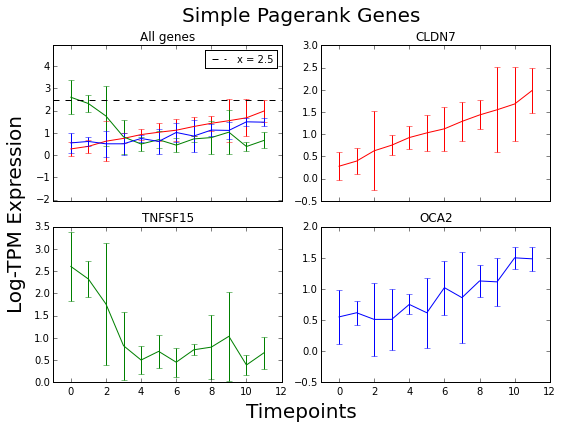

Gene to color is:  {u'SUSD3': 'r'}
Y min is :  0.239052844019
Y max is :  1.29831938766
Y avg is :  0.668698491287
Y std is :  0.361380215688
Figure saved to  plots/sigGenes_simplePgR/sigGenes_simplePgR-0-0-SUSD3


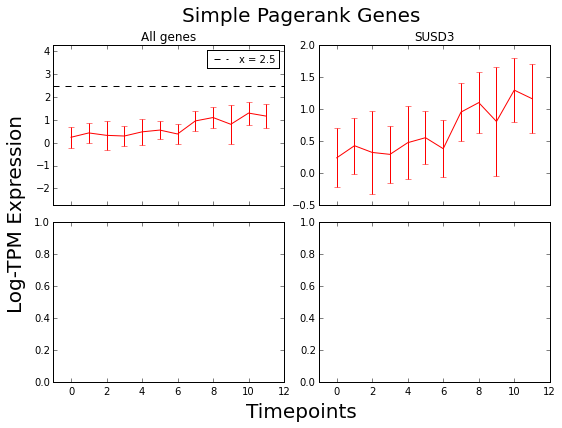

In [29]:
plot_genes_list = sorted(pr_genes, key = lambda gene: data[data["gene"] == gene]["avg"].values[0],
                        reverse=True)

file_prefix="plots/sigGenes_simplePgR/sigGenes_simplePgR"
title = "Simple Pagerank Genes"

!mkdir plots/sigGenes_simplePgR

horizontal_line_color_labels = [(2.5, 'k', "x = 2.5")]
print len(plot_genes_list)

gtm.plot_multi_genes_grid(data, plot_genes_list, title, file_prefix=file_prefix, horizontal_line_color_labels=horizontal_line_color_labels)

## Plot some more granger-causal pairs

In [35]:
reload(nh)
reload(gtm)

lag_1_file = "raw_files/edgeR-avg-Lag-1_beta-t-1_unshuffled-abs-thresh-FDR-0.1-network.txt"

lag_1_df = nh.load_network_df(lag_1_file, cols=["Lag-1 Cause", "Lag-1 Effect"])

lag_1_df.head()

lag_1_pairs = zip(lag_1_df["Lag-1 Cause"].values, lag_1_df["Lag-1 Effect"].values)
print lag_1_pairs

Initial pairs:  2404
After dup drops:  2404
After self drops:  2404
[('GPR153', 'LEFTY1'), ('GPR153', 'SLC16A12'), ('GPR153', 'HOGA1'), ('ERRFI1', 'PDK4'), ('CDKN1C', 'SPSB1'), ('FGD4', 'TMEM51'), ('RRAD', 'TMEM51'), ('PADI1', 'SLC16A12'), ('DDIT4L', 'IFFO2'), ('IFFO2', 'LRRC8A'), ('FGD4', 'IL22RA1'), ('MAN1C1', 'SDS'), ('OCA2', 'PAQR7'), ('HMGN2', 'NR1D2'), ('TRNP1', 'TUBA3E'), ('KRT6A', 'TRNP1'), ('KCNB1', 'TRNP1'), ('CLSPN', 'HIST1H3B'), ('LEFTY1', 'MAP7D1'), ('MAP7D1', 'SIX2'), ('MAP7D1', 'TUBA3E'), ('MAP7D1', 'TUBA3D'), ('ALPP', 'MAP7D1'), ('MAP7D1', 'S100P'), ('ACSL1', 'MAP7D1'), ('FST', 'MAP7D1'), ('KCNH2', 'MAP7D1'), ('MAP7D1', 'SLC16A12'), ('EVL', 'MAP7D1'), ('CILP', 'MAP7D1'), ('CDH16', 'MAP7D1'), ('KCNB1', 'MAP7D1'), ('SH3D21', 'TUBA3E'), ('FGD4', 'ZC3H12A'), ('KLF15', 'MFSD2A'), ('SCMH1', 'SDS'), ('KIF2C', 'RASD1'), ('NASP', 'NR1D2'), ('HS3ST6', 'PRKAA2'), ('KCNF1', 'USP1'), ('HIST1H3B', 'USP1'), ('E2F8', 'USP1'), ('E2F7', 'USP1'), ('ATAD5', 'USP1'), ('PCNA', 'USP1'), ('E2F

mkdir: plots/GR-Lag-1: File exists
2404
 pair to color is:  {('PCNA', 'USP1'): 'r', ('PCNA', 'STK32B'): 'g', ('KRT8', 'MUC3A'): 'b'}
[('PCNA', 'USP1'), ('PCNA', 'STK32B'), ('KRT8', 'MUC3A')]
set(['PCNA', 'USP1', 'MUC3A', 'KRT8', 'STK32B'])
Y min is :  0.855473965076
Y max is :  7.96622511483
Y avg is :  4.69887147516
Y std is :  2.61492020534
PCNA USP1
PCNA STK32B
KRT8 MUC3A
PCNA USP1
PCNA STK32B
KRT8 MUC3A
Figure saved to  plots/GR-Lag-1/GR-Lag-1-4-2-KRT8-MUC3A-PCNA-STK32B-USP1


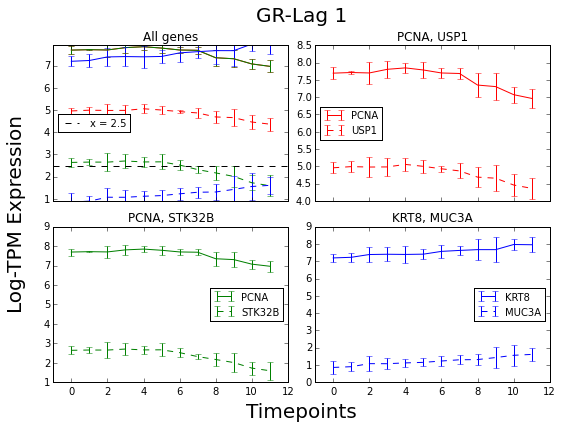

 pair to color is:  {('AKR1C3', 'CEP70'): 'r', ('AKR1C3', 'GLP2R'): 'g', ('ANXA1', 'SLC7A11'): 'b'}
[('AKR1C3', 'CEP70'), ('AKR1C3', 'GLP2R'), ('ANXA1', 'SLC7A11')]
set(['ANXA1', 'CEP70', 'SLC7A11', 'GLP2R', 'AKR1C3'])
Y min is :  2.37151728663
Y max is :  7.45865174836
Y avg is :  5.32803329454
Y std is :  1.80182410965
AKR1C3 CEP70
AKR1C3 GLP2R
ANXA1 SLC7A11
AKR1C3 CEP70
AKR1C3 GLP2R
ANXA1 SLC7A11
Figure saved to  plots/GR-Lag-1/GR-Lag-1-5-1-AKR1C3-ANXA1-CEP70-GLP2R-SLC7A11


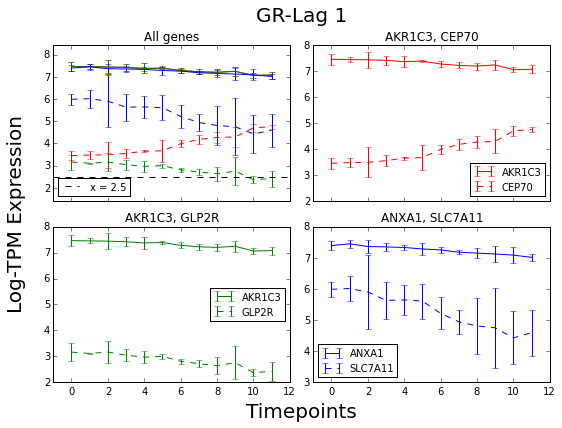

 pair to color is:  {('MAT2A', 'RP11-434D12.1'): 'b', ('ANXA1', 'SEMA3A'): 'r', ('STOM', 'TBX3'): 'g'}
[('ANXA1', 'SEMA3A'), ('STOM', 'TBX3'), ('MAT2A', 'RP11-434D12.1')]
set(['ANXA1', 'SEMA3A', 'MAT2A', 'STOM', 'RP11-434D12.1', 'TBX3'])
Y min is :  1.06230122375
Y max is :  7.89212648498
Y avg is :  4.74827336907
Y std is :  2.4385332427
ANXA1 SEMA3A
STOM TBX3
MAT2A RP11-434D12.1
ANXA1 SEMA3A
STOM TBX3
MAT2A RP11-434D12.1
Figure saved to  plots/GR-Lag-1/GR-Lag-1-4-2-ANXA1-MAT2A-RP11-434D12.1-SEMA3A-STOM-TBX3


ValueError: Format "1-sema3a-stom-tbx3" is not supported.
Supported formats: eps, jpeg, jpg, pdf, pgf, png, ps, raw, rgba, svg, svgz, tif, tiff.

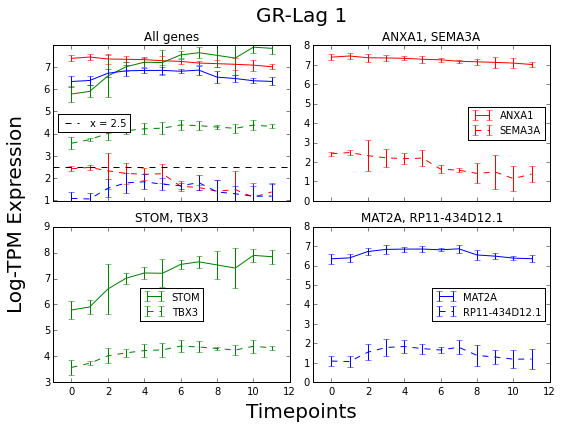

In [38]:
reload(gtm)

plot_pairs_list = sorted(lag_1_pairs, key = lambda pair: data[data["gene"] == pair[0]]["avg"].values[0],
                        reverse=True)
file_prefix="plots/GR-Lag-1/GR-Lag-1"
title = "GR-Lag 1"
max_plot = 30

!mkdir plots/GR-Lag-1

horizontal_line_color_labels = [(2.5, 'k', "x = 2.5")]
print len(plot_pairs_list)

gtm.plot_multi_pairs_grid(data, plot_pairs_list,  title, max_plot=max_plot, file_prefix=file_prefix, horizontal_line_color_labels=horizontal_line_color_labels)

In [40]:
reload(nh)
reload(gtm)

lag_2_file = "raw_files/edgeR-avg-Lag-2_beta-t-2_unshuffled-abs-thresh-FDR-0.1-network.txt"

lag_2_df = nh.load_network_df(lag_2_file, cols=["Lag-2 Cause", "Lag-2 Effect"])

lag_2_df.head()

lag_2_pairs = zip(lag_2_df["Lag-2 Cause"].values, lag_2_df["Lag-2 Effect"].values)
print lag_2_pairs

Initial pairs:  87261
After dup drops:  87120
After self drops:  87120
[('FAM213B', 'HTR1D'), ('CHD5', 'KCNB1'), ('ALPP', 'GPR153'), ('CIDEC', 'GPR153'), ('D4S234E', 'GPR153'), ('FKBP5', 'GPR153'), ('GPR153', 'KCNH2'), ('GPR153', 'ST3GAL1'), ('GPR153', 'OLAH'), ('GPR153', 'RASSF4'), ('CDKN1C', 'GPR153'), ('GPR153', 'KRT6A'), ('CKB', 'GPR153'), ('CILP', 'GPR153'), ('CDKN1C', 'HES2'), ('ETNK2', 'SLC45A1'), ('ALPP', 'SLC45A1'), ('CIDEC', 'SLC45A1'), ('PTH1R', 'SLC45A1'), ('S100P', 'SLC45A1'), ('FKBP5', 'SLC45A1'), ('CDKN1C', 'SLC45A1'), ('KRT6A', 'SLC45A1'), ('ENOX1', 'SLC45A1'), ('CILP', 'SLC45A1'), ('RHCG', 'SLC45A1'), ('MT2A', 'SLC45A1'), ('MT1X', 'SLC45A1'), ('CDH16', 'SLC45A1'), ('KCNB1', 'SLC45A1'), ('MTHFR', 'ZNF404'), ('NR0B1', 'PADI1'), ('IFFO2', 'LRRC8A'), ('GPR153', 'NBL1'), ('NBL1', 'NMNAT1'), ('NBL1', 'STK40'), ('MEAF6', 'NBL1'), ('CITED4', 'NBL1'), ('EDN2', 'NBL1'), ('NBL1', 'ZCCHC11'), ('NBL1', 'ZYG11B'), ('JUN', 'NBL1'), ('BTBD8', 'NBL1'), ('ATP1A1', 'NBL1'), ('NBL1', 'ZNF

mkdir: plots/GR-Lag-1: File exists
2404
 pair to color is:  {('PCNA', 'USP1'): 'r', ('PCNA', 'STK32B'): 'g', ('KRT8', 'MUC3A'): 'b'}
[('PCNA', 'USP1'), ('PCNA', 'STK32B'), ('KRT8', 'MUC3A')]
set(['PCNA', 'USP1', 'MUC3A', 'KRT8', 'STK32B'])
Y min is :  0.855473965076
Y max is :  7.96622511483
Y avg is :  4.69887147516
Y std is :  2.61492020534
PCNA USP1
PCNA STK32B
KRT8 MUC3A
PCNA USP1
PCNA STK32B
KRT8 MUC3A
Figure saved to  plots/GR-Lag-1/GR-Lag-1-4-2-KRT8-MUC3A-PCNA-STK32B-USP1


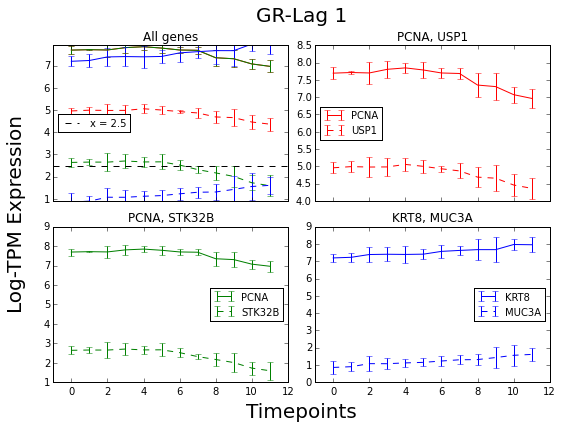

 pair to color is:  {('AKR1C3', 'CEP70'): 'r', ('AKR1C3', 'GLP2R'): 'g', ('ANXA1', 'SLC7A11'): 'b'}
[('AKR1C3', 'CEP70'), ('AKR1C3', 'GLP2R'), ('ANXA1', 'SLC7A11')]
set(['ANXA1', 'CEP70', 'SLC7A11', 'GLP2R', 'AKR1C3'])
Y min is :  2.37151728663
Y max is :  7.45865174836
Y avg is :  5.32803329454
Y std is :  1.80182410965
AKR1C3 CEP70
AKR1C3 GLP2R
ANXA1 SLC7A11
AKR1C3 CEP70
AKR1C3 GLP2R
ANXA1 SLC7A11
Figure saved to  plots/GR-Lag-1/GR-Lag-1-5-1-AKR1C3-ANXA1-CEP70-GLP2R-SLC7A11


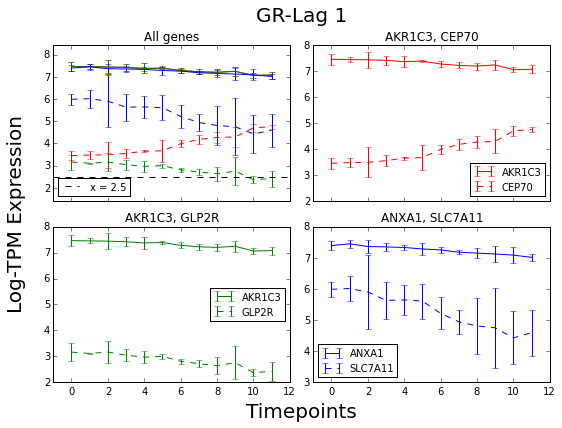

 pair to color is:  {('MAT2A', 'RP11-434D12.1'): 'b', ('ANXA1', 'SEMA3A'): 'r', ('STOM', 'TBX3'): 'g'}
[('ANXA1', 'SEMA3A'), ('STOM', 'TBX3'), ('MAT2A', 'RP11-434D12.1')]
set(['ANXA1', 'SEMA3A', 'MAT2A', 'STOM', 'RP11-434D12.1', 'TBX3'])
Y min is :  1.06230122375
Y max is :  7.89212648498
Y avg is :  4.74827336907
Y std is :  2.4385332427
ANXA1 SEMA3A
STOM TBX3
MAT2A RP11-434D12.1
ANXA1 SEMA3A
STOM TBX3
MAT2A RP11-434D12.1
Figure saved to  plots/GR-Lag-1/GR-Lag-1-4-2-ANXA1-MAT2A-RP11-434D12.1-SEMA3A-STOM-TBX3


ValueError: Format "1-sema3a-stom-tbx3" is not supported.
Supported formats: eps, jpeg, jpg, pdf, pgf, png, ps, raw, rgba, svg, svgz, tif, tiff.

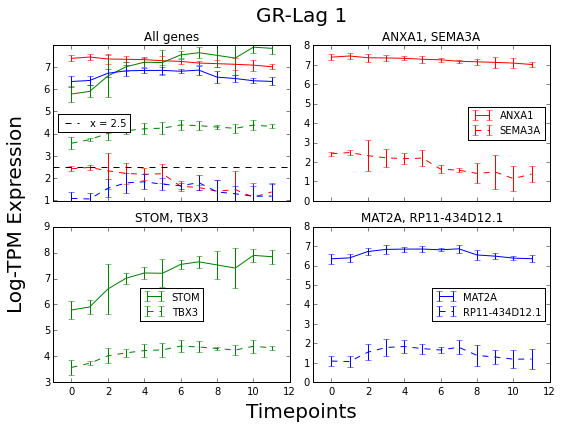

In [38]:
reload(gtm)

plot_pairs_list = sorted(lag_1_pairs, key = lambda pair: data[data["gene"] == pair[0]]["avg"].values[0],
                        reverse=True)
file_prefix="plots/GR-Lag-1/GR-Lag-1"
title = "GR-Lag 1"
max_plot = 30

!mkdir plots/GR-Lag-1

horizontal_line_color_labels = [(2.5, 'k', "x = 2.5")]
print len(plot_pairs_list)

gtm.plot_multi_pairs_grid(data, plot_pairs_list,  title, max_plot=max_plot, file_prefix=file_prefix, horizontal_line_color_labels=horizontal_line_color_labels)

In [35]:
reload(nh)
reload(gtm)

lag_1_file = "raw_files/edgeR-avg-Lag-1_beta-t-1_unshuffled-abs-thresh-FDR-0.1-network.txt"

lag_1_df = nh.load_network_df(lag_1_file, cols=["Lag-1 Cause", "Lag-1 Effect"])

lag_1_df.head()

lag_1_pairs = zip(lag_1_df["Lag-1 Cause"].values, lag_1_df["Lag-1 Effect"].values)
print lag_1_pairs

Initial pairs:  2404
After dup drops:  2404
After self drops:  2404
[('GPR153', 'LEFTY1'), ('GPR153', 'SLC16A12'), ('GPR153', 'HOGA1'), ('ERRFI1', 'PDK4'), ('CDKN1C', 'SPSB1'), ('FGD4', 'TMEM51'), ('RRAD', 'TMEM51'), ('PADI1', 'SLC16A12'), ('DDIT4L', 'IFFO2'), ('IFFO2', 'LRRC8A'), ('FGD4', 'IL22RA1'), ('MAN1C1', 'SDS'), ('OCA2', 'PAQR7'), ('HMGN2', 'NR1D2'), ('TRNP1', 'TUBA3E'), ('KRT6A', 'TRNP1'), ('KCNB1', 'TRNP1'), ('CLSPN', 'HIST1H3B'), ('LEFTY1', 'MAP7D1'), ('MAP7D1', 'SIX2'), ('MAP7D1', 'TUBA3E'), ('MAP7D1', 'TUBA3D'), ('ALPP', 'MAP7D1'), ('MAP7D1', 'S100P'), ('ACSL1', 'MAP7D1'), ('FST', 'MAP7D1'), ('KCNH2', 'MAP7D1'), ('MAP7D1', 'SLC16A12'), ('EVL', 'MAP7D1'), ('CILP', 'MAP7D1'), ('CDH16', 'MAP7D1'), ('KCNB1', 'MAP7D1'), ('SH3D21', 'TUBA3E'), ('FGD4', 'ZC3H12A'), ('KLF15', 'MFSD2A'), ('SCMH1', 'SDS'), ('KIF2C', 'RASD1'), ('NASP', 'NR1D2'), ('HS3ST6', 'PRKAA2'), ('KCNF1', 'USP1'), ('HIST1H3B', 'USP1'), ('E2F8', 'USP1'), ('E2F7', 'USP1'), ('ATAD5', 'USP1'), ('PCNA', 'USP1'), ('E2F

mkdir: plots/GR-Lag-1: File exists
2404
 pair to color is:  {('PCNA', 'USP1'): 'r', ('PCNA', 'STK32B'): 'g', ('KRT8', 'MUC3A'): 'b'}
[('PCNA', 'USP1'), ('PCNA', 'STK32B'), ('KRT8', 'MUC3A')]
set(['PCNA', 'USP1', 'MUC3A', 'KRT8', 'STK32B'])
Y min is :  0.855473965076
Y max is :  7.96622511483
Y avg is :  4.69887147516
Y std is :  2.61492020534
PCNA USP1
PCNA STK32B
KRT8 MUC3A
PCNA USP1
PCNA STK32B
KRT8 MUC3A
Figure saved to  plots/GR-Lag-1/GR-Lag-1-4-2-KRT8-MUC3A-PCNA-STK32B-USP1


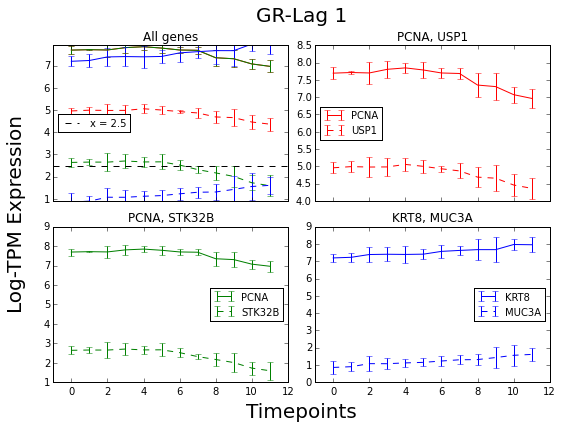

 pair to color is:  {('AKR1C3', 'CEP70'): 'r', ('AKR1C3', 'GLP2R'): 'g', ('ANXA1', 'SLC7A11'): 'b'}
[('AKR1C3', 'CEP70'), ('AKR1C3', 'GLP2R'), ('ANXA1', 'SLC7A11')]
set(['ANXA1', 'CEP70', 'SLC7A11', 'GLP2R', 'AKR1C3'])
Y min is :  2.37151728663
Y max is :  7.45865174836
Y avg is :  5.32803329454
Y std is :  1.80182410965
AKR1C3 CEP70
AKR1C3 GLP2R
ANXA1 SLC7A11
AKR1C3 CEP70
AKR1C3 GLP2R
ANXA1 SLC7A11
Figure saved to  plots/GR-Lag-1/GR-Lag-1-5-1-AKR1C3-ANXA1-CEP70-GLP2R-SLC7A11


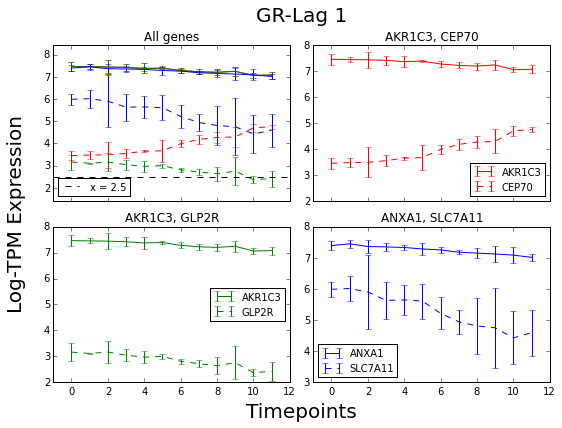

 pair to color is:  {('MAT2A', 'RP11-434D12.1'): 'b', ('ANXA1', 'SEMA3A'): 'r', ('STOM', 'TBX3'): 'g'}
[('ANXA1', 'SEMA3A'), ('STOM', 'TBX3'), ('MAT2A', 'RP11-434D12.1')]
set(['ANXA1', 'SEMA3A', 'MAT2A', 'STOM', 'RP11-434D12.1', 'TBX3'])
Y min is :  1.06230122375
Y max is :  7.89212648498
Y avg is :  4.74827336907
Y std is :  2.4385332427
ANXA1 SEMA3A
STOM TBX3
MAT2A RP11-434D12.1
ANXA1 SEMA3A
STOM TBX3
MAT2A RP11-434D12.1
Figure saved to  plots/GR-Lag-1/GR-Lag-1-4-2-ANXA1-MAT2A-RP11-434D12.1-SEMA3A-STOM-TBX3


ValueError: Format "1-sema3a-stom-tbx3" is not supported.
Supported formats: eps, jpeg, jpg, pdf, pgf, png, ps, raw, rgba, svg, svgz, tif, tiff.

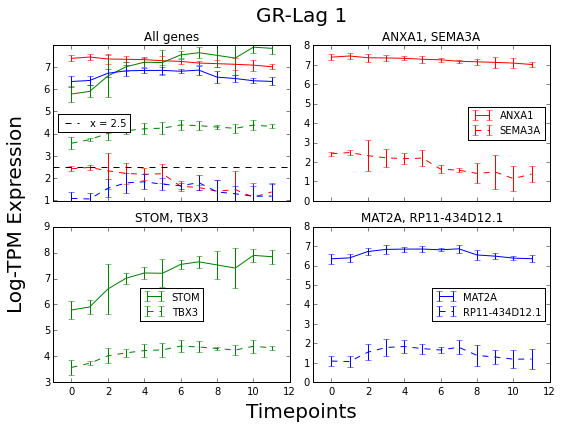

In [38]:
reload(gtm)

plot_pairs_list = sorted(lag_1_pairs, key = lambda pair: data[data["gene"] == pair[0]]["avg"].values[0],
                        reverse=True)
file_prefix="plots/GR-Lag-1/GR-Lag-1"
title = "GR-Lag 1"
max_plot = 30

!mkdir plots/GR-Lag-1

horizontal_line_color_labels = [(2.5, 'k', "x = 2.5")]
print len(plot_pairs_list)

gtm.plot_multi_pairs_grid(data, plot_pairs_list,  title, max_plot=max_plot, file_prefix=file_prefix, horizontal_line_color_labels=horizontal_line_color_labels)